# Bootstrap analysis for $\rho^0$, $\omega$, and $\phi$

This notebook automatically discovers and analyses every electron- or muon-induced
rho, omega, and phi bootstrap ROOT file in the configured output directory.  Each
dataset receives its own output directory, CSV summaries, and labelled figures.

For moment-recovery plots, the experimental/bootstrap-input moment is always on the
horizontal axis and the fitted moment is on the vertical axis.


In [33]:
from pathlib import Path
import re
import warnings

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt

try:
    from IPython.display import display
except Exception:
    def display(x):
        print(x)

pd.set_option("display.max_columns", 120)
pd.set_option("display.max_rows", 200)

ROOT_DIR = Path(
    "~/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles"
).expanduser()
TREE_NAME = "PartialWaves"
PARTICLES = ("Rho", "Omega", "Phi")
BEAM_PREFIXES = ("El", "Mu")
OUT_DIR = Path("outputs/bootstrap_only_analysis")

# Set ROOT_FILES to an explicit list of paths to override automatic discovery.
ROOT_FILES = None

REQUIRE_VALID = True
GOOD_STATUSES = {0}
CHI2_MAX = None
MAX_SCATTER_POINTS = 3000
TOP_N_MOMENT_PLOTS = 12
RANDOM_SEED = 12345
rng = np.random.default_rng(RANDOM_SEED)

plt.rcParams.update({
    "font.family": "serif",
    "mathtext.fontset": "stix",
    "font.size": 12,
    "axes.titlesize": 14,
    "axes.labelsize": 13,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "legend.fontsize": 10,
    "axes.linewidth": 1.2,
    "lines.linewidth": 1.8,
    "savefig.dpi": 300,
})

COLORS = {
    "input": "#D55E00",
    "fit": "#0072B2",
    "residual": "#009E73",
    "neutral": "#333333",
}


def style_axis(ax, grid=False):
    ax.minorticks_on()
    ax.tick_params(which="major", direction="in", top=True, right=True, length=6, width=1.1)
    ax.tick_params(which="minor", direction="in", top=True, right=True, length=3, width=0.9)
    if grid:
        ax.grid(True, color="0.90", linewidth=0.8, zorder=0)
    for spine in ax.spines.values():
        spine.set_linewidth(1.2)


def discover_bootstrap_files(root_dir=ROOT_DIR):
    files = []
    for beam in BEAM_PREFIXES:
        for particle in PARTICLES:
            files.extend(root_dir.glob(f"{beam}{particle}_bootstrap_*.root"))
    return sorted(set(path.resolve() for path in files), key=lambda p: p.name)


def dataset_metadata(path):
    match = re.match(
        r"(?P<beam>El|Mu)(?P<particle>Rho|Omega|Phi)_bootstrap_(?P<bin>\d+)$",
        Path(path).stem,
    )
    if not match:
        return {"key": Path(path).stem, "title": Path(path).stem, "bin": None}
    info = match.groupdict()
    beam = {"El": r"$e^-$", "Mu": r"$\mu^-$"}[info["beam"]]
    particle = {"Rho": r"$\rho^0$", "Omega": r"$\omega$", "Phi": r"$\phi$"}[info["particle"]]
    return {
        "key": Path(path).stem,
        "title": f"{beam}{particle}, bootstrap bin {info['bin']}",
        "bin": int(info["bin"]),
        "particle": info["particle"],
        "beam": info["beam"],
    }


if ROOT_FILES is None:
    ROOT_FILES = discover_bootstrap_files()
else:
    ROOT_FILES = [Path(item).expanduser().resolve() for item in ROOT_FILES]

if not ROOT_FILES:
    raise FileNotFoundError(
        f"No rho/omega/phi bootstrap ROOT files found in {ROOT_DIR}. "
        "Update ROOT_DIR or set ROOT_FILES explicitly."
    )

print(f"Discovered {len(ROOT_FILES)} bootstrap files:")
for root_file in ROOT_FILES:
    print(" -", root_file.name)


Discovered 17 bootstrap files:
 - ElOmega_bootstrap_0.root
 - ElOmega_bootstrap_1.root
 - ElOmega_bootstrap_2.root
 - ElPhi_bootstrap_0.root
 - ElPhi_bootstrap_1.root
 - ElPhi_bootstrap_2.root
 - ElRho_bootstrap_0.root
 - ElRho_bootstrap_1.root
 - ElRho_bootstrap_2.root
 - ElRho_bootstrap_3.root
 - MuOmega_bootstrap_0.root
 - MuOmega_bootstrap_1.root
 - MuOmega_bootstrap_2.root
 - MuRho_bootstrap_0.root
 - MuRho_bootstrap_1.root
 - MuRho_bootstrap_2.root
 - MuRho_bootstrap_3.root


## ROOT reading helpers


In [34]:
USE_UPROOT = False  # Leave False for standard ROOT/PyROOT environments.


def _module_available(module_name):
    import importlib.util
    return importlib.util.find_spec(module_name) is not None


def _open_tree_pyroot(path, tree_name):
    import ROOT
    f = ROOT.TFile.Open(str(path))
    if not f or f.IsZombie():
        raise OSError(f"Could not open ROOT file: {path}")
    tree = f.Get(tree_name)
    if not tree:
        keys = [key.GetName() for key in f.GetListOfKeys()]
        f.Close()
        raise KeyError(f"Could not find tree {tree_name!r} in {path}; keys: {keys}")
    return f, tree


def list_root_branches(path, tree_name=TREE_NAME):
    if USE_UPROOT:
        if not _module_available("uproot"):
            raise ModuleNotFoundError("Install uproot or set USE_UPROOT=False")
        import uproot
        with uproot.open(path) as f:
            return list(f[tree_name].keys())

    f, tree = _open_tree_pyroot(path, tree_name)
    branches = [branch.GetName() for branch in tree.GetListOfBranches()]
    f.Close()
    return branches


def _read_with_pyroot_loop(path, tree_name, branches):
    f, tree = _open_tree_pyroot(path, tree_name)
    for branch in tree.GetListOfBranches():
        tree.SetBranchStatus(branch.GetName(), 0)
    for name in branches:
        tree.SetBranchStatus(str(name), 1)

    n_entries = int(tree.GetEntries())
    data = {str(name): np.empty(n_entries, dtype=float) for name in branches}
    for index in range(n_entries):
        tree.GetEntry(index)
        for name in branches:
            try:
                data[str(name)][index] = float(getattr(tree, str(name)))
            except Exception:
                data[str(name)][index] = np.nan
    f.Close()
    return pd.DataFrame(data)


def read_root_tree(path, tree_name=TREE_NAME, branches=None):
    if USE_UPROOT:
        if not _module_available("uproot"):
            raise ModuleNotFoundError("Install uproot or set USE_UPROOT=False")
        import uproot
        with uproot.open(path) as f:
            tree = f[tree_name]
            columns = list(tree.keys()) if branches is None else list(branches)
            df = tree.arrays(columns, library="pd")
    else:
        try:
            import ROOT
            rdf = ROOT.RDataFrame(tree_name, str(path))
            columns = [str(c) for c in rdf.GetColumnNames()] if branches is None else [str(c) for c in branches]
            arrays = rdf.AsNumpy(columns)
            df = pd.DataFrame({str(key): np.asarray(value) for key, value in arrays.items()})
        except Exception as rdf_exc:
            warnings.warn(f"RDataFrame read failed ({rdf_exc}); using the TTree loop fallback")
            columns = list_root_branches(path, tree_name) if branches is None else branches
            df = _read_with_pyroot_loop(path, tree_name, columns)

    for column in df.columns:
        if df[column].dtype == object:
            converted = pd.to_numeric(df[column], errors="coerce")
            if converted.notna().any():
                df[column] = converted
    return df


## Branch classification and statistical helpers


In [35]:
AMP_MAG_RE = re.compile(r"^(?P<refl>[ab])_(?P<pol>[TL])_(?P<l>\d+)_(?P<m>m?\d+)$")
AMP_PHASE_RE = re.compile(r"^(?P<refl>[ab])phi_(?P<pol>[TL])_(?P<l>\d+)_(?P<m>m?\d+)$")
H_RE = re.compile(r"^H_(?P<alpha>\d+)_(?P<L>\d+)_(?P<M>m?\d+)$")


def m_token_to_int(token):
    token = str(token)
    return -int(token[1:]) if token.startswith("m") else int(token)


def branch_sort_key(name):
    bare = re.sub(r"^(throw_|fit_)", "", name)
    bare = bare.removeprefix("R")
    h04 = re.match(r"^H04_(\d+)_(m?\d+)$", bare)
    if h04:
        return ("H", 4, int(h04.group(1)), m_token_to_int(h04.group(2)), name)
    hm = H_RE.match(bare)
    if hm:
        values = hm.groupdict()
        return ("H", int(values["alpha"]), int(values["L"]), m_token_to_int(values["M"]), name)
    for pattern in (AMP_MAG_RE, AMP_PHASE_RE):
        match = pattern.match(name)
        if match:
            values = match.groupdict()
            return (values["refl"], values["pol"], int(values["l"]), m_token_to_int(values["m"]), name)
    return (name,)


def classify_branches(df):
    return {
        "quality": [c for c in ["valid", "status", "valid_starts", "chi2", "log_val", "log10_chi2"] if c in df],
        "throw": sorted([c for c in df if c.startswith("throw_RH")], key=branch_sort_key),
        "fit_rh": sorted([c for c in df if c.startswith("fit_RH")], key=branch_sort_key),
        "h": sorted([c for c in df if H_RE.match(c)], key=branch_sort_key),
        "amp_mag": sorted([c for c in df if AMP_MAG_RE.match(c)], key=branch_sort_key),
        "amp_phase": sorted([c for c in df if AMP_PHASE_RE.match(c)], key=branch_sort_key),
    }


def build_quality_mask(df, require_valid=True, good_statuses={0}, chi2_max=None):
    mask = pd.Series(True, index=df.index)
    if require_valid and "valid" in df:
        mask &= df["valid"].astype(bool)
    if good_statuses is not None and "status" in df:
        status_mask = df["status"].isin(list(good_statuses))
        if status_mask.any():
            mask &= status_mask
        else:
            warnings.warn(f"No entries pass GOOD_STATUSES={good_statuses}; status cut ignored")
    if chi2_max is not None and "chi2" in df:
        mask &= np.isfinite(df["chi2"]) & (df["chi2"] <= chi2_max)
    if "chi2" in df:
        mask &= np.isfinite(df["chi2"])
    return mask


def finite_values(series):
    values = np.asarray(series, dtype=float)
    return values[np.isfinite(values)]


def summarise_columns(df, columns, group_name):
    rows = []
    for column in columns:
        values = finite_values(df[column])
        if len(values) == 0:
            continue
        q025, q16, q50, q84, q975 = np.quantile(values, [0.025, 0.16, 0.50, 0.84, 0.975])
        rows.append({
            "group": group_name, "branch": column, "n": len(values),
            "mean": np.mean(values), "std": np.std(values, ddof=1) if len(values) > 1 else np.nan,
            "median": q50, "err_low_16_50": q50 - q16, "err_high_50_84": q84 - q50,
            "q16": q16, "q84": q84, "q025": q025, "q975": q975,
            "min": np.min(values), "max": np.max(values),
        })
    return pd.DataFrame(rows)


def sample_indices(n, max_points=MAX_SCATTER_POINTS):
    if n <= max_points:
        return np.arange(n)
    return np.sort(rng.choice(n, size=max_points, replace=False))


def phase_branch_for_mag(mag_branch):
    match = AMP_MAG_RE.match(mag_branch)
    if not match:
        return None
    values = match.groupdict()
    return f"{values['refl']}phi_{values['pol']}_{values['l']}_{values['m']}"


def wrap_angle(values):
    return (np.asarray(values) + np.pi) % (2 * np.pi) - np.pi


def circular_mean(phi):
    return np.angle(np.mean(np.exp(1j * np.asarray(phi, dtype=float))))


def circular_std(phi):
    resultant = np.abs(np.mean(np.exp(1j * np.asarray(phi, dtype=float))))
    return np.inf if resultant <= 0 else np.sqrt(-2 * np.log(resultant))


## Moment and amplitude comparisons


In [36]:
def make_throw_fit_pairs(df, throw_columns):
    pairs = []
    for throw_column in throw_columns:
        suffix = throw_column[len("throw_"):]
        fit_column = "fit_" + suffix
        if fit_column in df:
            pairs.append((throw_column, fit_column, suffix))
    return pairs


def compare_throw_fit(df, pairs):
    rows = []
    for throw_column, fit_column, suffix in pairs:
        experimental = np.asarray(df[throw_column], dtype=float)
        fitted = np.asarray(df[fit_column], dtype=float)
        good = np.isfinite(experimental) & np.isfinite(fitted)
        experimental, fitted = experimental[good], fitted[good]
        if len(experimental) == 0:
            continue
        residual = fitted - experimental
        q16, q50, q84 = np.quantile(residual, [0.16, 0.50, 0.84])
        rows.append({
            "moment": suffix, "throw_branch": throw_column, "fit_branch": fit_column,
            "n": len(residual), "experimental_mean": np.mean(experimental),
            "fit_mean": np.mean(fitted), "bias_mean_fit_minus_input": np.mean(residual),
            "bias_median_fit_minus_input": q50,
            "resid_std": np.std(residual, ddof=1) if len(residual) > 1 else np.nan,
            "resid_rms": np.sqrt(np.mean(residual**2)), "resid_q16": q16, "resid_q84": q84,
            "mae": np.mean(np.abs(residual)),
            "corr_fit_input": np.corrcoef(experimental, fitted)[0, 1]
                if len(residual) > 1 and np.std(experimental) > 0 and np.std(fitted) > 0 else np.nan,
        })
    result = pd.DataFrame(rows)
    return result.sort_values("resid_rms", ascending=False).reset_index(drop=True) if len(result) else result


def amplitude_pairs(df, magnitude_columns):
    return [(mag, phase_branch_for_mag(mag)) for mag in magnitude_columns
            if phase_branch_for_mag(mag) in df]


def summarise_amplitudes(df, pairs):
    rows = []
    for mag_column, phase_column in pairs:
        magnitude = np.asarray(df[mag_column], dtype=float)
        phase = wrap_angle(np.asarray(df[phase_column], dtype=float))
        good = np.isfinite(magnitude) & np.isfinite(phase)
        magnitude, phase = magnitude[good], phase[good]
        if len(magnitude) == 0:
            continue
        amplitude = magnitude * np.exp(1j * phase)
        mag_q16, mag_q50, mag_q84 = np.quantile(magnitude, [0.16, 0.50, 0.84])
        rows.append({
            "amplitude": mag_column, "phase_branch": phase_column, "n": len(magnitude),
            "mag_mean": np.mean(magnitude),
            "mag_std": np.std(magnitude, ddof=1) if len(magnitude) > 1 else np.nan,
            "mag_median": mag_q50, "mag_err_low_16_50": mag_q50 - mag_q16,
            "mag_err_high_50_84": mag_q84 - mag_q50,
            "phase_circular_mean": circular_mean(phase), "phase_circular_std": circular_std(phase),
            "real_mean": np.mean(amplitude.real), "real_std": np.std(amplitude.real, ddof=1),
            "imag_mean": np.mean(amplitude.imag), "imag_std": np.std(amplitude.imag, ddof=1),
        })
    return pd.DataFrame(rows)


## Publication-quality plotting helpers


In [37]:
def save_figure(fig, output_path, show=True):
    fig.savefig(output_path, bbox_inches="tight")
    if show:
        plt.show()
    else:
        plt.close(fig)


def plot_fit_quality(df, title, out_dir):
    if "chi2" not in df:
        return
    fig, ax = plt.subplots(figsize=(7.2, 4.5))
    ax.hist(finite_values(df["chi2"]), bins=60, color=COLORS["fit"], alpha=0.82)
    ax.set_xlabel(r"Fit quality $\chi^2$")
    ax.set_ylabel("Bootstrap replicas")
    ax.set_title(title + "\nSelected fit-quality distribution")
    style_axis(ax)
    fig.tight_layout()
    save_figure(fig, out_dir / "chi2_distribution.png")


def plot_largest_residuals(comparison, title, out_dir):
    if comparison.empty:
        return
    table = comparison.head(min(TOP_N_MOMENT_PLOTS, len(comparison))).copy()
    x = np.arange(len(table))
    fig, ax = plt.subplots(figsize=(max(8, 0.72 * len(table)), 5.2))
    ax.bar(x, table["resid_rms"], color=COLORS["residual"], alpha=0.88)
    ax.set_xticks(x, table["moment"], rotation=45, ha="right")
    ax.set_xlabel("Moment")
    ax.set_ylabel(r"RMS$(H_{\rm fit}-H_{\rm input})$")
    ax.set_title(title + "\nLargest bootstrap moment residuals")
    style_axis(ax, grid=True)
    fig.tight_layout()
    save_figure(fig, out_dir / "largest_moment_residuals.png")


def plot_throw_fit(moment_or_suffix, df, pairs, title, out_dir):
    match = next((pair for pair in pairs if moment_or_suffix in set(pair)), None)
    if match is None:
        raise KeyError(f"No matched input/fit pair for {moment_or_suffix}")
    throw_column, fit_column, suffix = match
    experimental = np.asarray(df[throw_column], dtype=float)
    fitted = np.asarray(df[fit_column], dtype=float)
    good = np.isfinite(experimental) & np.isfinite(fitted)
    experimental, fitted = experimental[good], fitted[good]
    indices = sample_indices(len(experimental))

    low = min(np.min(experimental), np.min(fitted))
    high = max(np.max(experimental), np.max(fitted))
    padding = 0.05 * (high - low if high > low else 1)
    fig, ax = plt.subplots(figsize=(6.2, 5.6))
    ax.scatter(experimental[indices], fitted[indices], s=18, alpha=0.42,
               color=COLORS["fit"], edgecolors="none")
    ax.plot([low - padding, high + padding], [low - padding, high + padding],
            "--", color=COLORS["neutral"], label="Exact recovery")
    ax.set_xlabel(rf"Experimental/bootstrap-input moment: {suffix}")
    ax.set_ylabel(rf"Fitted moment: {suffix}")
    ax.set_title(title + rf"\nInput versus fitted moment {suffix}")
    ax.legend(frameon=False)
    style_axis(ax, grid=True)
    fig.tight_layout()
    save_figure(fig, out_dir / f"input_vs_fit_{suffix}.png")

    residual = fitted - experimental
    fig, ax = plt.subplots(figsize=(7.2, 4.5))
    ax.hist(residual, bins=60, color=COLORS["residual"], alpha=0.82)
    ax.axvline(np.median(residual), ls="--", color=COLORS["neutral"], label="Median")
    ax.axvline(0, ls=":", color="black", label="Zero")
    ax.set_xlabel(rf"Residual $H_{{\rm fit}}-H_{{\rm input}}$: {suffix}")
    ax.set_ylabel("Bootstrap replicas")
    ax.set_title(title + rf"\nResidual distribution for {suffix}")
    ax.legend(frameon=False)
    style_axis(ax)
    fig.tight_layout()
    save_figure(fig, out_dir / f"residual_{suffix}.png")


def plot_branch_distribution(branch, df, title, out_dir, bins=60):
    values = finite_values(df[branch])
    q16, q50, q84 = np.quantile(values, [0.16, 0.50, 0.84])
    fig, ax = plt.subplots(figsize=(7.2, 4.5))
    ax.hist(values, bins=bins, color=COLORS["fit"], alpha=0.82)
    ax.axvline(q50, ls="--", color=COLORS["neutral"], label="Median")
    ax.axvline(q16, ls=":", color=COLORS["neutral"], label="16th/84th percentiles")
    ax.axvline(q84, ls=":", color=COLORS["neutral"])
    ax.set_xlabel(f"Moment value: {branch}")
    ax.set_ylabel("Bootstrap replicas")
    ax.set_title(title + f"\nBootstrap distribution of {branch}")
    ax.legend(frameon=False)
    style_axis(ax)
    fig.tight_layout()
    save_figure(fig, out_dir / f"distribution_{branch}.png")


def get_complex_amplitude(df, mag_branch):
    phase_branch = phase_branch_for_mag(mag_branch)
    magnitude = np.asarray(df[mag_branch], dtype=float)
    phase = np.asarray(df[phase_branch], dtype=float)
    good = np.isfinite(magnitude) & np.isfinite(phase)
    return magnitude[good] * np.exp(1j * phase[good])


def plot_argand(df, pairs, title, out_dir):
    if not pairs:
        return
    fig, ax = plt.subplots(figsize=(7.2, 7.0))
    cmap = mpl.colormaps["tab20"]
    for index, (mag_branch, _) in enumerate(pairs):
        amplitude = get_complex_amplitude(df, mag_branch)
        sample = sample_indices(len(amplitude))
        color = cmap(index % 20)
        ax.scatter(amplitude.real[sample], amplitude.imag[sample], s=10,
                   alpha=0.20, color=color, edgecolors="none")
        mean = np.mean(amplitude)
        ax.scatter(mean.real, mean.imag, marker="o", s=55, color=color,
                   edgecolor="black", linewidth=0.6, label=mag_branch)
    ax.axhline(0, ls=":", color="0.45", lw=1)
    ax.axvline(0, ls=":", color="0.45", lw=1)
    ax.set_xlabel(r"Real part $\operatorname{Re}A$")
    ax.set_ylabel(r"Imaginary part $\operatorname{Im}A$")
    ax.set_title(title + "\nBootstrap amplitude Argand distributions")
    ax.set_aspect("equal", adjustable="datalim")
    if len(pairs) <= 16:
        ax.legend(frameon=False, fontsize=8, ncol=2)
    style_axis(ax)
    fig.tight_layout()
    save_figure(fig, out_dir / "argand_all_amplitudes.png")


def plot_phase_magnitude(amplitude, df, title, out_dir):
    phase_branch = phase_branch_for_mag(amplitude)
    magnitude = np.asarray(df[amplitude], dtype=float)
    phase = wrap_angle(np.asarray(df[phase_branch], dtype=float))
    good = np.isfinite(magnitude) & np.isfinite(phase)
    magnitude, phase = magnitude[good], phase[good]
    sample = sample_indices(len(magnitude))
    fig, ax = plt.subplots(figsize=(7.2, 4.8))
    ax.scatter(phase[sample], magnitude[sample], s=15, alpha=0.32,
               color=COLORS["fit"], edgecolors="none")
    ax.set_xlabel(r"Amplitude phase $\varphi$ [rad]")
    ax.set_ylabel(r"Amplitude magnitude $|A|$")
    ax.set_title(title + f"\nPhase--magnitude distribution for {amplitude}")
    style_axis(ax, grid=True)
    fig.tight_layout()
    save_figure(fig, out_dir / f"phase_magnitude_{amplitude}.png")


def plot_correlation(df, columns, title, plot_label, out_dir, max_cols=30):
    columns = [column for column in columns if column in df][:max_cols]
    if not columns:
        return
    correlation = df[columns].corr()
    size = max(7, 0.36 * len(columns) + 4)
    fig, ax = plt.subplots(figsize=(size, size))
    image = ax.imshow(correlation, vmin=-1, vmax=1, cmap="RdBu_r", aspect="equal")
    ticks = np.arange(len(columns))
    ax.set_xticks(ticks, columns, rotation=90, fontsize=8)
    ax.set_yticks(ticks, columns, fontsize=8)
    ax.set_xlabel("Branch")
    ax.set_ylabel("Branch")
    ax.set_title(title + "\n" + plot_label)
    colorbar = fig.colorbar(image, ax=ax, fraction=0.046, pad=0.04)
    colorbar.set_label("Pearson correlation coefficient")
    fig.tight_layout()
    save_figure(fig, out_dir / (plot_label.lower().replace(" ", "_") + ".png"))


## Optional official-moment comparison


In [38]:
# Generated directly from MakeLeptoMoments(6).C.
# Statistical and systematic SDME uncertainties are combined in quadrature,
# exactly as in Comb(...) and FillBin(...) in the ROOT macro.
OFFICIAL_MOMENTS_BY_DATASET = {
    "ElRho_bootstrap_0": {  # <Q^2> = 0.82 GeV^2
        "H04_2_0": (0.0188, 0.0795718543205),
        "H04_2_1": (0.0387979380895, 0.0476789261624),
        "H04_2_2": (0.0235151015307, 0.0241991735396),
        "H_1_0_0": (0.264, 0.128716743278),
        "H_1_2_0": (0.012, 0.0383916657622),
        "H_1_2_1": (0.051268703904, 0.0753870015321),
        "H_1_2_2": (0.277282238883, 0.0530358369407),
        "H_2_2_1": (-0.0318697348593, 0.0280570846668),
        "H_2_2_2": (-0.288059993751, 0.0416269143704),
        "H_3_2_1": (-0.00277128129211, 0.0578826398845),
        "H_3_2_2": (0.0205757138394, 0.050921115463),
        "H_5_0_0": (-0.182, 0.119348229983),
        "H_5_2_0": (-0.1088, 0.0446425805706),
        "H_5_2_1": (-0.209231737554, 0.0529452547449),
        "H_5_2_2": (0.00881816307402, 0.0215109274556),
        "H_6_2_1": (0.206460456262, 0.0249799919936),
        "H_6_2_2": (-0.0107777548682, 0.0160698475413),
        "H_7_2_1": (-0.109465611038, 0.0954484153876),
        "H_7_2_2": (-0.00293938769134, 0.0791454357496),
        "H_8_0_0": (-0.12, 0.270916961448),
        "H_8_2_0": (-0.0024, 0.0790948797331),
        "H_8_2_1": (-0.0554256258422, 0.0615012195001),
        "H_8_2_2": (0.0127373466625, 0.0612509591762),
    },
    "ElRho_bootstrap_1": {  # <Q^2> = 1.19 GeV^2
        "H04_2_0": (0.0416, 0.0253140277317),
        "H04_2_1": (0.0401835787356, 0.0105527247666),
        "H04_2_2": (0.0137171425596, 0.0138564064606),
        "H_1_0_0": (0.114, 0.103923048454),
        "H_1_2_0": (-0.036, 0.0328487442682),
        "H_1_2_1": (0.0595825477804, 0.0185903200618),
        "H_1_2_2": (0.256706525044, 0.0293938769134),
        "H_2_2_1": (-0.0304840942132, 0.0299759903923),
        "H_2_2_2": (-0.249847953764, 0.0266533299983),
        "H_3_2_1": (0.0568112664883, 0.036686782361),
        "H_3_2_2": (0, 0.0325699247773),
        "H_5_0_0": (-0.144, 0.0588557558782),
        "H_5_2_0": (-0.084, 0.0203960780544),
        "H_5_2_1": (-0.236944550475, 0.00969948452239),
        "H_5_2_2": (0.00783836717691, 0.00903327183251),
        "H_6_2_1": (0.231401987891, 0.0105527247666),
        "H_6_2_2": (0.00195959179423, 0.00969948452239),
        "H_7_2_1": (-0.127478939437, 0.054447038487),
        "H_7_2_2": (0.0225353056336, 0.0563276131218),
        "H_8_0_0": (-0.304, 0.248322371123),
        "H_8_2_0": (0.0128, 0.0771201659749),
        "H_8_2_1": (-0.0277128129211, 0.0443621460256),
        "H_8_2_2": (0.0705453045922, 0.0530358369407),
    },
    "ElRho_bootstrap_2": {  # <Q^2> = 1.66 GeV^2
        "H04_2_0": (0.0764, 0.0297106041675),
        "H04_2_1": (0.0484974226119, 0.018066543665),
        "H04_2_2": (0.0186161220452, 0.010229369482),
        "H_1_0_0": (0.078, 0.0888594395661),
        "H_1_2_0": (-0.024, 0.0285657137142),
        "H_1_2_1": (0.049883063258, 0.0235151015307),
        "H_1_2_2": (0.268464075809, 0.029991998933),
        "H_2_2_1": (-0.00692820323028, 0.0371806401236),
        "H_2_2_2": (-0.23417121941, 0.0198393548282),
        "H_3_2_1": (0.102537407808, 0.0353270434653),
        "H_3_2_2": (-0.0303736728105, 0.0320948594015),
        "H_5_0_0": (-0.082, 0.0696850055607),
        "H_5_2_0": (-0.052, 0.0218064210727),
        "H_5_2_1": (-0.223088144015, 0.00999199679744),
        "H_5_2_2": (-0.0127373466625, 0.00746190324247),
        "H_6_2_1": (0.231401987891, 0.0108221994068),
        "H_6_2_2": (0.00195959179423, 0.00789936706325),
        "H_7_2_1": (-0.0540399851961, 0.0501900388523),
        "H_7_2_2": (-0.00489897948557, 0.0547722557505),
        "H_8_0_0": (-0.312, 0.248233760798),
        "H_8_2_0": (-0.0024, 0.0779291986357),
        "H_8_2_1": (-0.102537407808, 0.047193219852),
        "H_8_2_2": (-0.017636326148, 0.0530539348211),
    },
    "ElRho_bootstrap_3": {  # <Q^2> = 3.06 GeV^2
        "H04_2_0": (0.1448, 0.0213653925777),
        "H04_2_1": (0.0360266567974, 0.0105527247666),
        "H04_2_2": (-0.000979795897113, 0.011171392035),
        "H_1_0_0": (-0.002, 0.0924337600663),
        "H_1_2_0": (-0.044, 0.0299759903923),
        "H_1_2_1": (0.0124707658145, 0.0227261963381),
        "H_1_2_2": (0.199878363011, 0.0203882318998),
        "H_2_2_1": (-0.0304840942132, 0.0211508865062),
        "H_2_2_2": (-0.193019791731, 0.0203882318998),
        "H_3_2_1": (-0.0665107510106, 0.034278856457),
        "H_3_2_2": (-0.0254746933249, 0.0278682615174),
        "H_5_0_0": (-0.218, 0.0759473501842),
        "H_5_2_0": (-0.1376, 0.0190326036054),
        "H_5_2_1": (-0.195375331094, 0.0138564064606),
        "H_5_2_2": (0.0195959179423, 0.010415373253),
        "H_6_2_1": (0.216159940785, 0.0161592079014),
        "H_6_2_2": (-0.00979795897113, 0.00969948452239),
        "H_7_2_1": (-0.259114800812, 0.0533066599967),
        "H_7_2_2": (-0.106797752785, 0.0462168800332),
        "H_8_0_0": (-0.012, 0.223436791957),
        "H_8_2_0": (-0.0096, 0.0747518561642),
        "H_8_2_1": (-0.135792783313, 0.0448785026488),
        "H_8_2_2": (0.00391918358845, 0.0461753180823),
    },
    "ElPhi_bootstrap_0": {  # <Q^2> = 1.2 GeV^2
        "H04_2_0": (-0.080956, 0.0235714121766),
        "H04_2_1": (-0.0248168239708, 0.0347948961775),
        "H04_2_2": (0.00548685702383, 0.0198526983556),
        "H_1_0_0": (0.00508, 0.117140223664),
        "H_1_2_0": (-0.049304, 0.0289332218738),
        "H_1_2_1": (-0.027227838695, 0.0571445409466),
        "H_1_2_2": (0.312731254441, 0.0275697660491),
        "H_2_2_1": (0.0107802842263, 0.0455515721792),
        "H_2_2_2": (-0.271452453295, 0.0301922798079),
        "H_3_2_1": (-0.0106971457875, 0.0930031844616),
        "H_3_2_2": (-0.0813622512963, 0.102193838405),
        "H_5_0_0": (0.111, 0.127967339583),
        "H_5_2_0": (-0.000984, 0.032635298681),
        "H_5_2_1": (-0.236016171243, 0.021435435335),
        "H_5_2_2": (0.0122376507549, 0.0178032473442),
        "H_6_2_1": (0.203384334028, 0.013785871028),
        "H_6_2_2": (-0.0267778218681, 0.0173487078481),
        "H_7_2_1": (-0.0356386774165, 0.122755850565),
        "H_7_2_2": (-0.122229538165, 0.154255333263),
        "H_8_0_0": (0.25848, 0.528252178036),
        "H_8_2_0": (-0.225792, 0.144988018264),
        "H_8_2_1": (-0.11744690116, 0.110366116539),
        "H_8_2_2": (-0.236150407122, 0.133736073338),
    },
    "ElPhi_bootstrap_1": {  # <Q^2> = 1.7 GeV^2
        "H04_2_0": (0.011024, 0.0260313884378),
        "H04_2_1": (-0.00609681884264, 0.0262028163372),
        "H04_2_2": (-0.025455097407, 0.0199851969217),
        "H_1_0_0": (-0.11162, 0.128256731597),
        "H_1_2_0": (0.025696, 0.0331736049292),
        "H_1_2_1": (0.0127478939437, 0.0684570260528),
        "H_1_2_2": (0.274401638946, 0.0284504115963),
        "H_2_2_1": (0.0226136553436, 0.0270738226337),
        "H_2_2_2": (-0.261037222909, 0.0389263920753),
        "H_3_2_1": (-0.133686609531, 0.0789221708774),
        "H_3_2_2": (-0.0867609266894, 0.0773494669148),
        "H_5_0_0": (-0.0555, 0.117178632865),
        "H_5_2_0": (-0.023208, 0.0301015178355),
        "H_5_2_1": (-0.224584635913, 0.0170000941174),
        "H_5_2_2": (0.00173423873789, 0.0176913185489),
        "H_6_2_1": (0.232801484944, 0.0150564633297),
        "H_6_2_2": (-0.0215163179006, 0.0155534937554),
        "H_7_2_1": (-0.230875444446, 0.0947562197642),
        "H_7_2_2": (-0.0781191268768, 0.116574073962),
        "H_8_0_0": (0.39378, 0.470596835093),
        "H_8_2_0": (0.173064, 0.136414844471),
        "H_8_2_1": (-0.14073952042, 0.103239234402),
        "H_8_2_2": (-0.155718961928, 0.115051718736),
    },
    "ElPhi_bootstrap_2": {  # <Q^2> = 4.5 GeV^2
        "H04_2_0": (0.083612, 0.032927940962),
        "H04_2_1": (-0.0250662392871, 0.0305986164393),
        "H04_2_2": (0.0256608545454, 0.0221436929169),
        "H_1_0_0": (-0.03046, 0.137448208428),
        "H_1_2_0": (-0.016456, 0.0392135046126),
        "H_1_2_1": (-0.00579197790051, 0.0384706549983),
        "H_1_2_2": (0.258793490305, 0.0306185904313),
        "H_2_2_1": (0.00613838806202, 0.0447971084781),
        "H_2_2_2": (-0.226597397125, 0.0236130831532),
        "H_3_2_1": (0.0612453165556, 0.0717897142493),
        "H_3_2_2": (0.0164801669894, 0.0668793758344),
        "H_5_0_0": (-0.09966, 0.126859117134),
        "H_5_2_0": (-0.010584, 0.0312877432871),
        "H_5_2_1": (-0.206654445953, 0.0163520215264),
        "H_5_2_2": (-0.0184495567426, 0.0192591015367),
        "H_6_2_1": (0.250426833962, 0.015632931395),
        "H_6_2_2": (-0.0137857282724, 0.0139940650277),
        "H_7_2_1": (0.0821407774981, 0.0900213201414),
        "H_7_2_2": (-0.0813818472142, 0.100208551012),
        "H_8_0_0": (0.022, 0.439755015435),
        "H_8_2_0": (-0.359384, 0.133490304187),
        "H_8_2_1": (-0.222353754472, 0.0875358450008),
        "H_8_2_2": (0.0834296206392, 0.10174212343),
    },
    "ElOmega_bootstrap_0": {  # <Q^2> = 1.28 GeV^2
        "H04_2_0": (-0.2032, 0.0485962961552),
        "H04_2_1": (0.00692820323028, 0.0296216137305),
        "H04_2_2": (0.00391918358845, 0.0313534687076),
        "H_1_0_0": (-0.27, 0.198212007709),
        "H_1_2_0": (0.0432, 0.052745426342),
        "H_1_2_1": (0.00692820323028, 0.0478597952357),
        "H_1_2_2": (-0.0313534687076, 0.0581639063337),
        "H_2_2_1": (-0.0166276877527, 0.0447714194548),
        "H_2_2_2": (0.168524894303, 0.0539599851742),
        "H_3_2_1": (-0.0609681884264, 0.133482583134),
        "H_3_2_2": (0.0725048963864, 0.150448928212),
        "H_5_0_0": (0.234, 0.129707362937),
        "H_5_2_0": (-0.084, 0.0328195063948),
        "H_5_2_1": (-0.0526543445501, 0.0333706457834),
        "H_5_2_2": (-0.0460504071643, 0.0244948974278),
        "H_6_2_1": (0.0859097200554, 0.0266172876154),
        "H_6_2_2": (0.0685857127979, 0.0276086942828),
        "H_7_2_1": (-0.225859425307, 0.197038879412),
        "H_7_2_2": (-0.319413462459, 0.225763770344),
        "H_8_0_0": (-0.81, 0.829913248478),
        "H_8_2_0": (0.3384, 0.22236978212),
        "H_8_2_1": (-0.121936376853, 0.200271815291),
        "H_8_2_2": (-0.496756519836, 0.226824337319),
    },
    "ElOmega_bootstrap_1": {  # <Q^2> = 2 GeV^2
        "H04_2_0": (-0.2008, 0.0639049293873),
        "H04_2_1": (-0.0831384387633, 0.0316278358412),
        "H04_2_2": (0.0225353056336, 0.0305155697964),
        "H_1_0_0": (0.07, 0.198695747312),
        "H_1_2_0": (-0.0608, 0.0530358369407),
        "H_1_2_1": (0.124707658145, 0.0460608293456),
        "H_1_2_2": (-0.171464281995, 0.0601597872337),
        "H_2_2_1": (-0.0581969071343, 0.0417765484453),
        "H_2_2_2": (0.130312854316, 0.0646145494452),
        "H_3_2_1": (-0.0651251103646, 0.106044518953),
        "H_3_2_2": (-0.107777548682, 0.129991999754),
        "H_5_0_0": (0.142, 0.10853570841),
        "H_5_2_0": (-0.0632, 0.0289882734912),
        "H_5_2_1": (-0.0304840942132, 0.0249799919936),
        "H_5_2_2": (-0.0764240799748, 0.031989998437),
        "H_6_2_1": (0.0956092045778, 0.0255499510763),
        "H_6_2_2": (-0.0146969384567, 0.0288166618469),
        "H_7_2_1": (0.00831384387633, 0.173653447993),
        "H_7_2_2": (-0.157747139435, 0.196213760985),
        "H_8_0_0": (0.41, 0.740151335877),
        "H_8_2_0": (-0.124, 0.201685696072),
        "H_8_2_1": (-0.108079970392, 0.193756961165),
        "H_8_2_2": (-0.0254746933249, 0.184266763145),
    },
    "ElOmega_bootstrap_2": {  # <Q^2> = 4 GeV^2
        "H04_2_0": (-0.1852, 0.0570094728971),
        "H04_2_1": (0.0221702503369, 0.0402790268006),
        "H04_2_2": (-0.00783836717691, 0.0333274661503),
        "H_1_0_0": (0.052, 0.21311030008),
        "H_1_2_0": (0.028, 0.0572097893721),
        "H_1_2_1": (-0.101151767162, 0.0520676483049),
        "H_1_2_2": (-0.307655911694, 0.102335917448),
        "H_2_2_1": (-0.049883063258, 0.0520676483049),
        "H_2_2_2": (0.159706731229, 0.0626609926509),
        "H_3_2_1": (-0.101151767162, 0.108221994068),
        "H_3_2_2": (0.086222038946, 0.123749424241),
        "H_5_0_0": (0.144, 0.156371352875),
        "H_5_2_0": (-0.1104, 0.0380904187428),
        "H_5_2_1": (-0.0734389542409, 0.0368955281843),
        "H_5_2_2": (0.00783836717691, 0.0260338241524),
        "H_6_2_1": (0.0637394697185, 0.0264726273724),
        "H_6_2_2": (0.0421312235759, 0.0360266567974),
        "H_7_2_1": (-0.235558909829, 0.18666590476),
        "H_7_2_2": (0.0450706112672, 0.201144724017),
        "H_8_0_0": (1.642, 0.74782350859),
        "H_8_2_0": (-0.092, 0.193332045973),
        "H_8_2_1": (-0.387979380895, 0.18923001876),
        "H_8_2_2": (0.181262240966, 0.185005081011),
    },
    "MuOmega_bootstrap_0": {  # <Q^2> = 1.16 GeV^2
        "H04_2_0": (-0.0244, 0.0458205194209),
        "H04_2_1": (0.0277128129211, 0.0323481065906),
        "H04_2_2": (-0.0333130605019, 0.0413492442494),
        "H_1_0_0": (0.1, 0.186943841835),
        "H_1_2_0": (-0.0176, 0.0508047241898),
        "H_1_2_1": (0.110851251684, 0.0557365230347),
        "H_1_2_2": (-0.0284140810163, 0.0391182821709),
        "H_2_2_1": (-0.0886810013475, 0.0384249918673),
        "H_2_2_2": (-0.0264544892221, 0.0437520285244),
        "H_3_2_1": (0.0360266567974, 0.28183058741),
        "H_3_2_2": (0.163625914818, 0.247244656161),
        "H_5_0_0": (-0.154, 0.162591512694),
        "H_5_2_0": (-0.04, 0.0387484193226),
        "H_5_2_1": (-0.166276877527, 0.0199839935949),
        "H_5_2_2": (-0.00195959179423, 0.0237183473286),
        "H_6_2_1": (0.141335345898, 0.0207846096908),
        "H_6_2_2": (0.0205757138394, 0.023596609926),
        "H_7_2_1": (-0.109465611038, 0.261915406191),
        "H_7_2_2": (0.155787547641, 0.263958178506),
        "H_8_0_0": (-0.24, 1.14315528254),
        "H_8_2_0": (0.1248, 0.390375409062),
        "H_8_2_1": (-0.227245065953, 0.302469833207),
        "H_8_2_2": (-0.0225353056336, 0.469862958744),
    },
    "MuOmega_bootstrap_1": {  # <Q^2> = 1.64 GeV^2
        "H04_2_0": (-0.0136, 0.0652539653967),
        "H04_2_1": (0.0193989690448, 0.0323481065906),
        "H04_2_2": (-0.00881816307402, 0.0492341345004),
        "H_1_0_0": (0.232, 0.275724500181),
        "H_1_2_0": (0.0616, 0.080538189699),
        "H_1_2_1": (0.102537407808, 0.0837137981458),
        "H_1_2_2": (-0.0107777548682, 0.0505806287031),
        "H_2_2_1": (-0.0914522826396, 0.0426858290303),
        "H_2_2_2": (0.0352726522961, 0.0586078493037),
        "H_3_2_1": (-0.24248711306, 0.193245957267),
        "H_3_2_2": (0.0803432635633, 0.196948724291),
        "H_5_0_0": (-0.148, 0.196712988895),
        "H_5_2_0": (-0.1264, 0.0503173926193),
        "H_5_2_1": (-0.119165095561, 0.0254746933249),
        "H_5_2_2": (-0.0274342851192, 0.0545879107495),
        "H_6_2_1": (0.103923048454, 0.0235151015307),
        "H_6_2_2": (0.0372322440903, 0.029991998933),
        "H_7_2_1": (-0.0845240794094, 0.211944143585),
        "H_7_2_2": (-0.00587877538268, 0.197998787875),
        "H_8_0_0": (0.684, 0.904294199915),
        "H_8_2_0": (-0.3504, 0.258657456881),
        "H_8_2_1": (0.181518924633, 0.2234278407),
        "H_8_2_2": (-0.182242036863, 0.249880611493),
    },
    "MuOmega_bootstrap_2": {  # <Q^2> = 3.58 GeV^2
        "H04_2_0": (0.098, 0.0772859625029),
        "H04_2_1": (0.0221702503369, 0.0366081958037),
        "H04_2_2": (-0.0235151015307, 0.0350542436803),
        "H_1_0_0": (0.456, 0.280128541923),
        "H_1_2_0": (0.0816, 0.0931510601121),
        "H_1_2_1": (0.110851251684, 0.0789936706325),
        "H_1_2_2": (-0.0989593856084, 0.0999391815056),
        "H_2_2_1": (-0.0956092045778, 0.0776453475747),
        "H_2_2_2": (0.100918977403, 0.0797556267607),
        "H_3_2_1": (0.0526543445501, 0.173758453032),
        "H_3_2_2": (0.0235151015307, 0.203368434129),
        "H_5_0_0": (-0.29, 0.210123773048),
        "H_5_2_0": (-0.2048, 0.0712269611875),
        "H_5_2_1": (-0.139949705252, 0.0731770455812),
        "H_5_2_2": (-0.0254746933249, 0.0306098023515),
        "H_6_2_1": (0.121936376853, 0.0508173198821),
        "H_6_2_2": (0.00783836717691, 0.0288166618469),
        "H_7_2_1": (0.207846096908, 0.342264459154),
        "H_7_2_2": (0.323332646047, 0.282303666289),
        "H_8_0_0": (0.304, 1.05380453596),
        "H_8_2_0": (-0.3296, 0.279515008542),
        "H_8_2_1": (-0.471117819659, 0.291132959316),
        "H_8_2_2": (0.226332852233, 0.354909340536),
    },
    "MuRho_bootstrap_0": {  # <Q^2> = 1.14 GeV^2
        "H04_2_0": (0.0896, 0.0299243045032),
        "H04_2_1": (0.0626309572017, 0.00931579304193),
        "H04_2_2": (0.0208696526085, 0.0069011303422),
        "H_1_0_0": (0.1442, 0.0482928566146),
        "H_1_2_0": (-0.0028, 0.0138182488037),
        "H_1_2_1": (0.0721918776595, 0.00912526164008),
        "H_1_2_2": (0.272481238987, 0.0103265095749),
        "H_2_2_1": (-0.0699748526258, 0.00734520251593),
        "H_2_2_2": (-0.270717606372, 0.0100346599344),
        "H_3_2_1": (-0.0199532253032, 0.0148883847344),
        "H_3_2_2": (0.00372322440903, 0.0169863945556),
        "H_5_0_0": (-0.2356, 0.0268357969884),
        "H_5_2_0": (-0.09088, 0.0084573281833),
        "H_5_2_1": (-0.24581265061, 0.00663517897272),
        "H_5_2_2": (0.00166565302509, 0.00410229204226),
        "H_6_2_1": (0.234866089506, 0.00541996309951),
        "H_6_2_2": (0.000587877538268, 0.00390199948744),
        "H_7_2_1": (-0.0318697348593, 0.0299977599164),
        "H_7_2_2": (-0.00774038758719, 0.0483349314678),
        "H_8_0_0": (-0.1098, 0.161770331025),
        "H_8_2_0": (0.01056, 0.0428006728919),
        "H_8_2_1": (-0.0350567083452, 0.0255236361046),
        "H_8_2_2": (-0.0150888568155, 0.0287527946468),
    },
    "MuRho_bootstrap_1": {  # <Q^2> = 1.6 GeV^2
        "H04_2_0": (0.16988, 0.0250066871057),
        "H04_2_1": (0.059721111845, 0.00955589870185),
        "H04_2_2": (0.00725048963864, 0.00505711380137),
        "H_1_0_0": (0.1278, 0.0441207434208),
        "H_1_2_0": (0.02736, 0.0131890863975),
        "H_1_2_1": (0.0608296243618, 0.00984682690007),
        "H_1_2_2": (0.228978301155, 0.00915204895092),
        "H_2_2_1": (-0.0703905448196, 0.00843535417158),
        "H_2_2_2": (-0.225353056336, 0.00727032323903),
        "H_3_2_1": (0.00942235639317, 0.0186321013308),
        "H_3_2_2": (0.0273363055295, 0.0227736690061),
        "H_5_0_0": (-0.2874, 0.0291506432176),
        "H_5_2_0": (-0.1128, 0.0108817645628),
        "H_5_2_1": (-0.239161575509, 0.00470710101867),
        "H_5_2_2": (0.00774038758719, 0.00610075405175),
        "H_6_2_1": (0.220455426787, 0.00615480300253),
        "H_6_2_2": (-0.00725048963864, 0.00402790268006),
        "H_7_2_1": (-0.0667878791399, 0.023931101103),
        "H_7_2_2": (0.00617271415181, 0.0218720643744),
        "H_8_0_0": (-0.059, 0.119095927722),
        "H_8_2_0": (0.01672, 0.0377603389815),
        "H_8_2_1": (-0.0554256258422, 0.0218197708512),
        "H_8_2_2": (-0.0102878569197, 0.0258030695848),
    },
    "MuRho_bootstrap_2": {  # <Q^2> = 2.8 GeV^2
        "H04_2_0": (0.2588, 0.0253066315419),
        "H04_2_1": (0.0703905448196, 0.0119719672569),
        "H04_2_2": (0.00793634676662, 0.00951209756048),
        "H_1_0_0": (0.1692, 0.102653592241),
        "H_1_2_0": (0.03, 0.0372161685293),
        "H_1_2_1": (0.0987961780637, 0.00989157217029),
        "H_1_2_2": (0.238776260127, 0.0105718115761),
        "H_2_2_1": (-0.0848012075386, 0.0126700907653),
        "H_2_2_2": (-0.253375218993, 0.0183684947669),
        "H_3_2_1": (-0.0289598895026, 0.0273350763672),
        "H_3_2_2": (0.00499695907528, 0.0220967327902),
        "H_5_0_0": (-0.3956, 0.0527279811865),
        "H_5_2_0": (-0.15488, 0.0189861423149),
        "H_5_2_1": (-0.268537157205, 0.0125360280791),
        "H_5_2_2": (0.00852422430489, 0.00617582383168),
        "H_6_2_1": (0.253433674163, 0.0104741968666),
        "H_6_2_2": (0.000293938769134, 0.00532796396384),
        "H_7_2_1": (-0.117918018979, 0.0572236035216),
        "H_7_2_2": (-0.0391918358845, 0.0343532705867),
        "H_8_0_0": (-0.0592, 0.273885085392),
        "H_8_2_0": (0.0716, 0.0693119095106),
        "H_8_2_1": (-0.0645708541062, 0.0598535813465),
        "H_8_2_2": (-0.056338264084, 0.0634407061751),
    },
    "MuRho_bootstrap_3": {  # <Q^2> = 6.02 GeV^2
        "H04_2_0": (0.23828, 0.0701270390078),
        "H04_2_1": (0.0496059351288, 0.0196062031),
        "H04_2_2": (-0.00578079579297, 0.0144482524895),
        "H_1_0_0": (0.1326, 0.119529075961),
        "H_1_2_0": (0.02376, 0.0372999946381),
        "H_1_2_1": (0.0849397716032, 0.0385138312818),
        "H_1_2_2": (0.161372384255, 0.0286745601536),
        "H_2_2_1": (-0.0870182325723, 0.0445687603597),
        "H_2_2_2": (-0.142070405081, 0.0296515766866),
        "H_3_2_1": (-0.0293755816964, 0.1096352644),
        "H_3_2_2": (0.0687816719774, 0.0672857310282),
        "H_5_0_0": (-0.5306, 0.131137332594),
        "H_5_2_0": (-0.1364, 0.0401616732719),
        "H_5_2_1": (-0.216437068914, 0.022814311298),
        "H_5_2_2": (-0.00940604061229, 0.0129870088935),
        "H_6_2_1": (0.209647429748, 0.0150888568155),
        "H_6_2_2": (-0.00656463251066, 0.0105039421171),
        "H_7_2_1": (-0.0410149631232, 0.0772906824915),
        "H_7_2_2": (0.0701533862333, 0.0927482269372),
        "H_8_0_0": (-0.1148, 0.428910666689),
        "H_8_2_0": (-0.23792, 0.13806824979),
        "H_8_2_1": (-0.0652636744292, 0.115177414453),
        "H_8_2_2": (-0.164899649484, 0.0797151729597),
    },
}


def moment_branch_candidates(moment_name):
    return list(dict.fromkeys(["fit_R" + moment_name, "fit_" + moment_name, moment_name]))


def compare_to_official(df, official_moments):
    rows = []
    for moment, (official, official_sigma) in official_moments.items():
        branch = next((candidate for candidate in moment_branch_candidates(moment) if candidate in df), None)
        if branch is None:
            continue
        values = finite_values(df[branch])
        if len(values) == 0:
            continue
        fit_mean = np.mean(values)
        fit_sigma = np.std(values, ddof=1) if len(values) > 1 else np.nan
        delta = fit_mean - official
        combined_sigma = np.sqrt(official_sigma**2 + fit_sigma**2)
        rows.append({
            "moment": moment, "branch_used": branch, "official": official,
            "official_sigma": official_sigma, "bootstrap_mean": fit_mean,
            "bootstrap_sigma": fit_sigma, "delta": delta,
            "pull_combined": delta / combined_sigma if combined_sigma > 0 else np.nan,
            "n_bootstrap": len(values),
        })
    return pd.DataFrame(rows)


def plot_official_comparison(comparison, title, out_dir):
    if comparison.empty:
        return
    table = comparison.sort_values("moment").reset_index(drop=True)
    x = np.arange(len(table))
    fig, ax = plt.subplots(figsize=(max(10, 0.58 * len(table)), 6.0))
    ax.errorbar(x - 0.10, table["official"], yerr=table["official_sigma"],
                fmt="o", capsize=3, color=COLORS["input"], label="Experimental moment")
    ax.errorbar(x + 0.10, table["bootstrap_mean"], yerr=table["bootstrap_sigma"],
                fmt="s", capsize=3, color=COLORS["fit"], label="Bootstrap fit")
    ax.axhline(0, ls=":", color="0.45", lw=1)
    ax.set_xticks(x, table["moment"], rotation=45, ha="right")
    ax.set_xlabel("Moment")
    ax.set_ylabel("Moment value")
    ax.set_title(title+ "\nExperimental and Bootstrap-fit moments")
    ax.legend(frameon=False)
    style_axis(ax, grid=True)
    fig.tight_layout()
    save_figure(fig, out_dir / f"{out_dir.name}_official_vs_bootstrap_moments.png")

    # fig, ax = plt.subplots(figsize=(max(10, 0.58 * len(table)), 5.2))
    # ax.bar(x, table["pull_combined"], color=COLORS["fit"], alpha=0.85)
    # for level, linestyle in [(0, "-"), (1, "--"), (-1, "--"), (2, ":"), (-2, ":")]:
    #     ax.axhline(level, ls=linestyle, color="0.35", lw=1)
    # ax.set_xticks(x, table["moment"], rotation=45, ha="right")
    # ax.set_xlabel("Moment")
    # ax.set_ylabel("Combined pull")
    # ax.set_title(title + "\nPulls of bootstrap-fitted moments")
    # style_axis(ax, grid=True)
    # fig.tight_layout()
    # save_figure(fig, out_dir / f"{out_dir.name}_official_moment_pulls.png")


## Run the complete analysis for every discovered file



$e^-$$\omega$, bootstrap bin 0
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/ElOmega_bootstrap_0.root
Selected 903 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


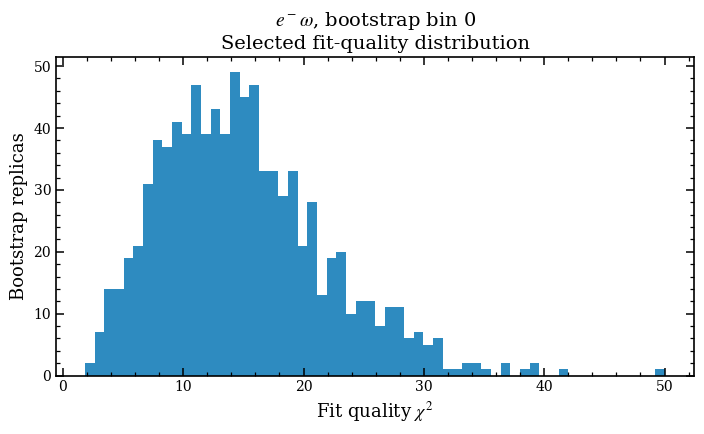

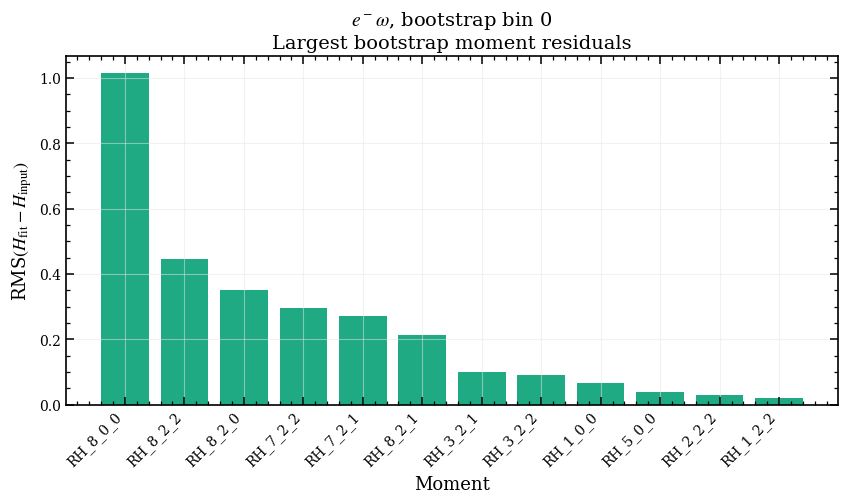

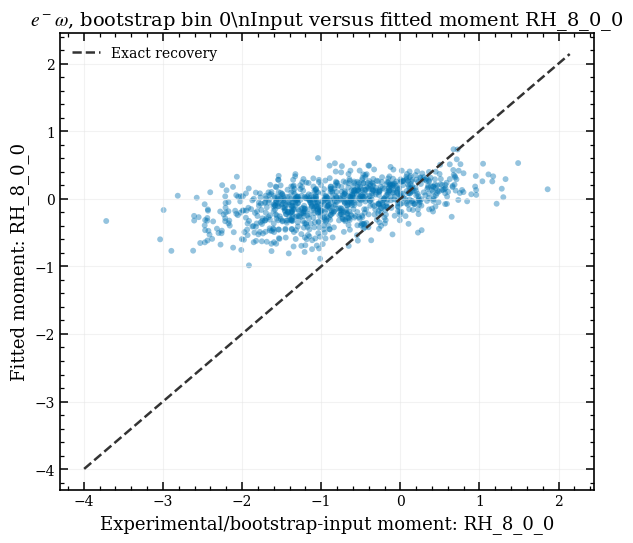

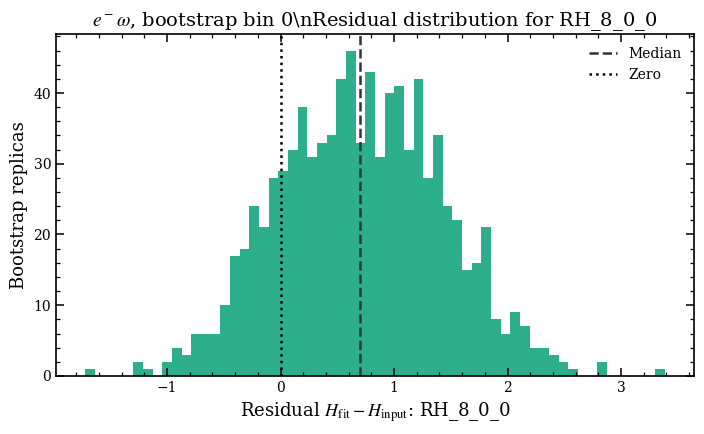

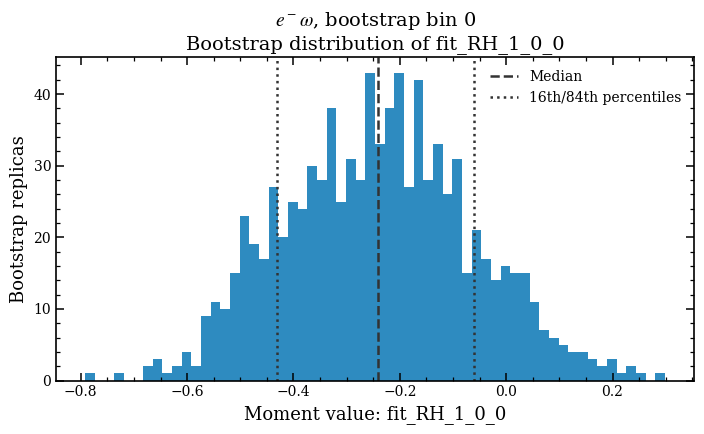

...

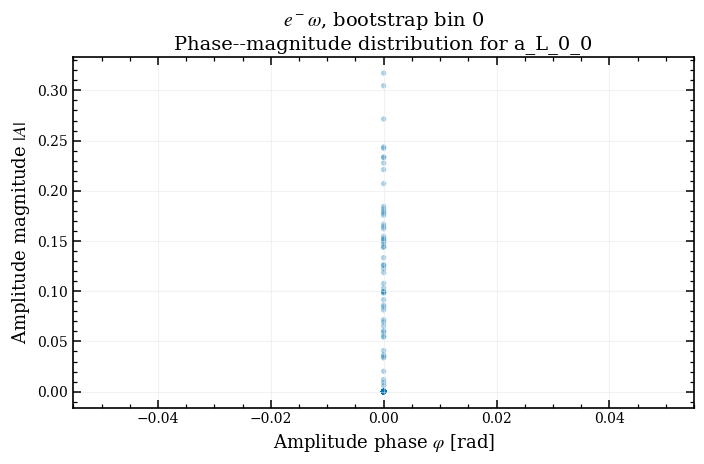

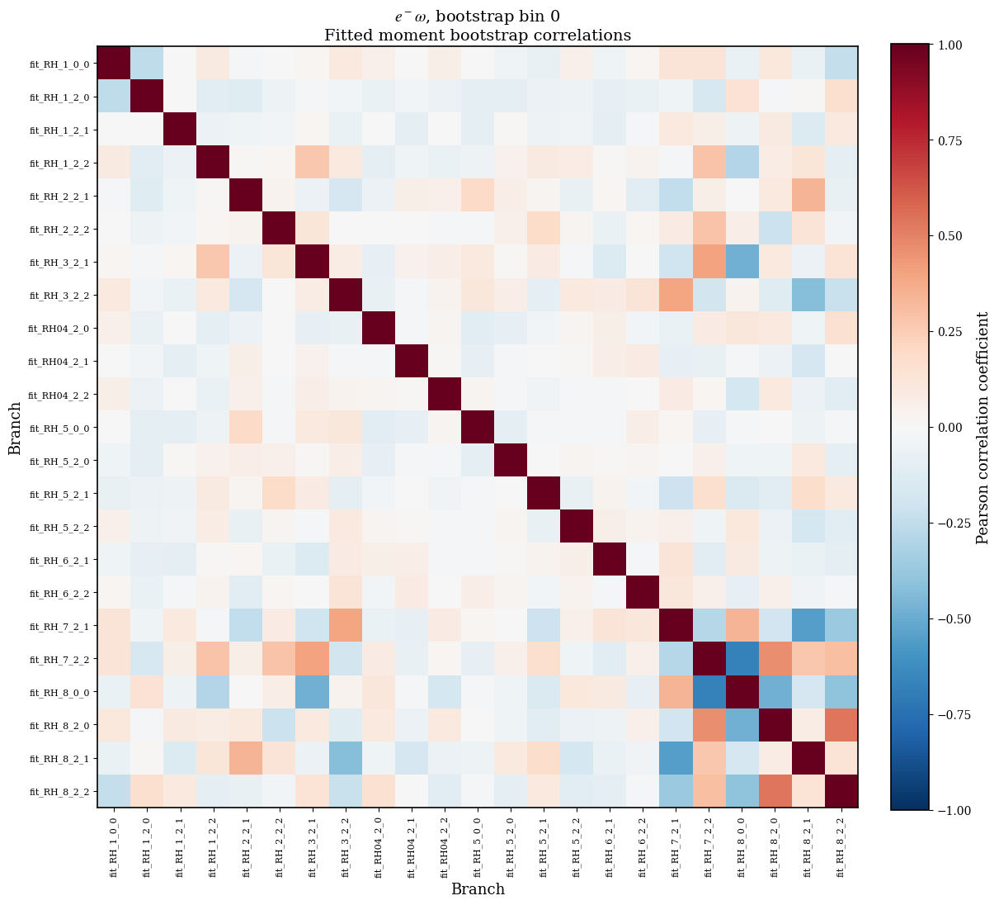

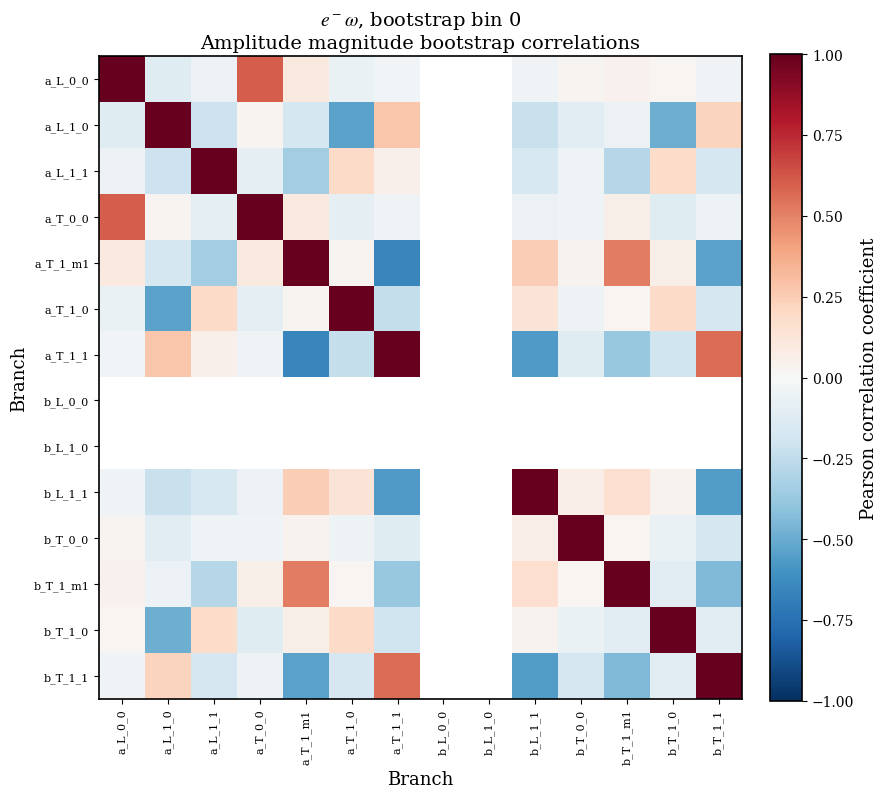

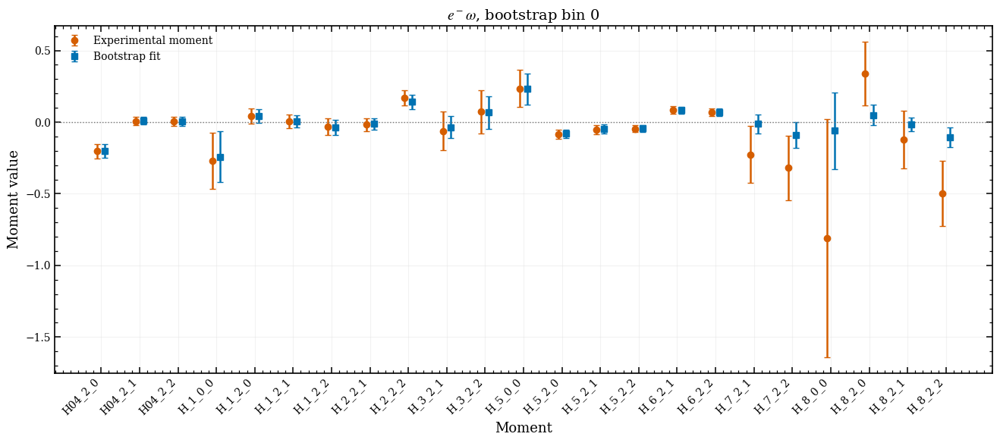

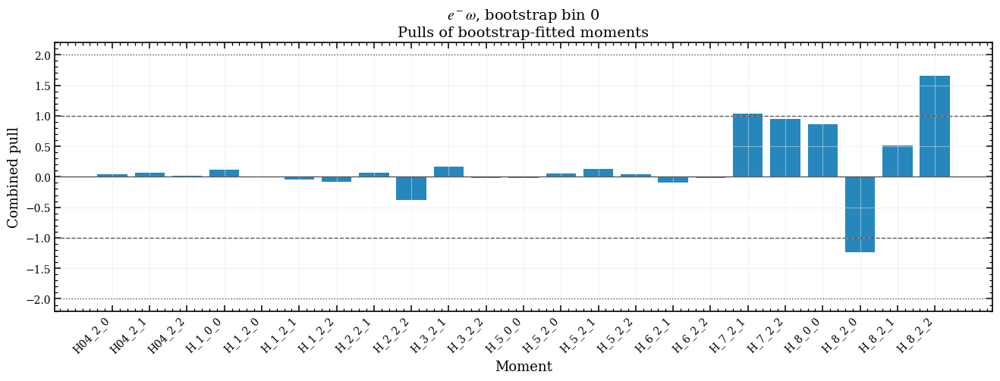


$e^-$$\omega$, bootstrap bin 1
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/ElOmega_bootstrap_1.root
Selected 876 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


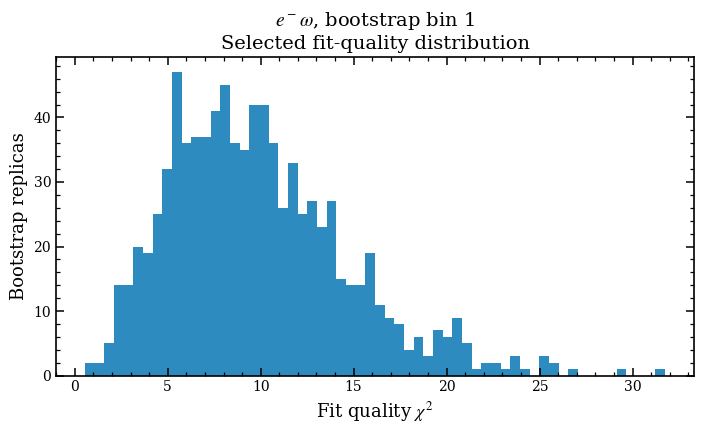

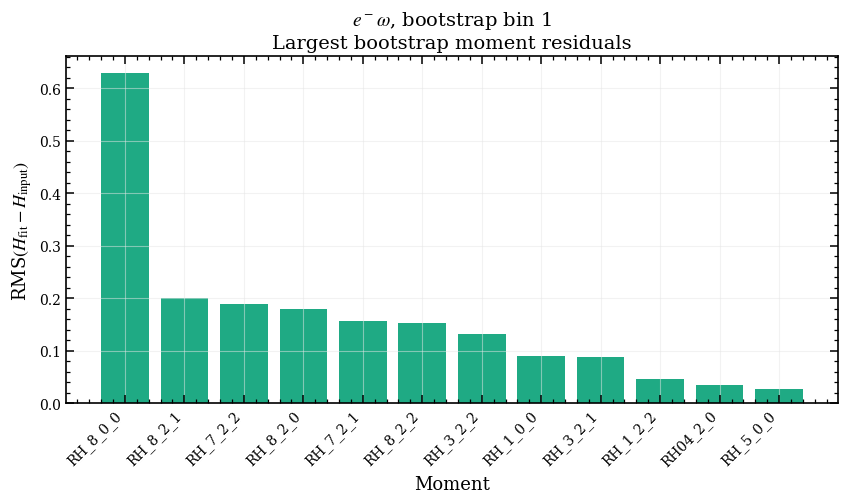

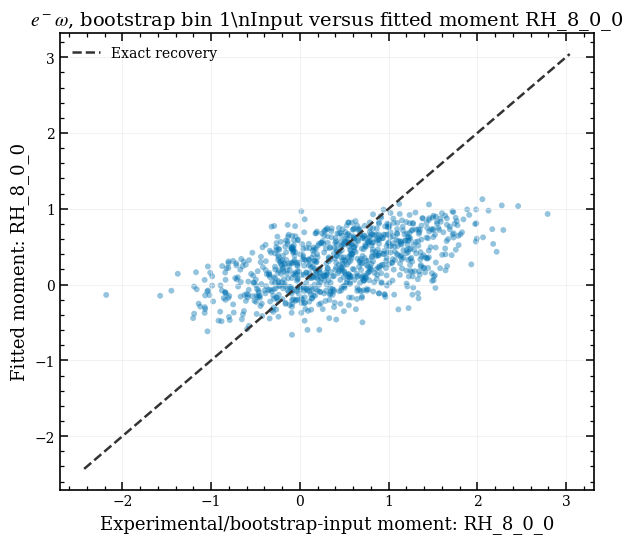

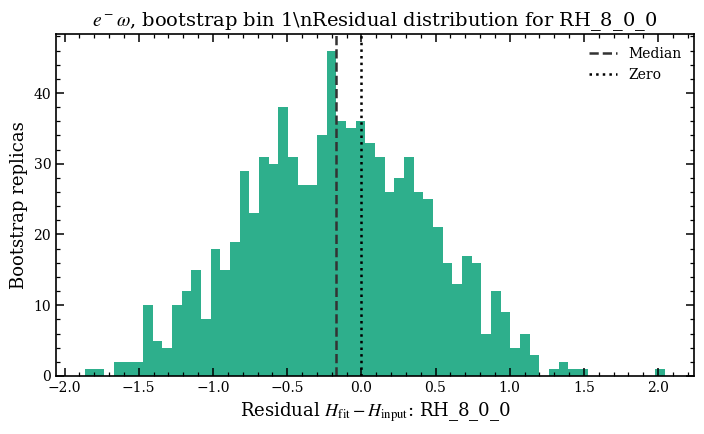

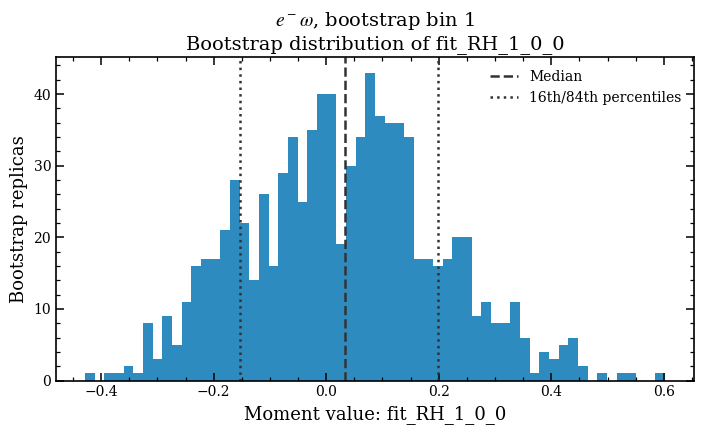

...

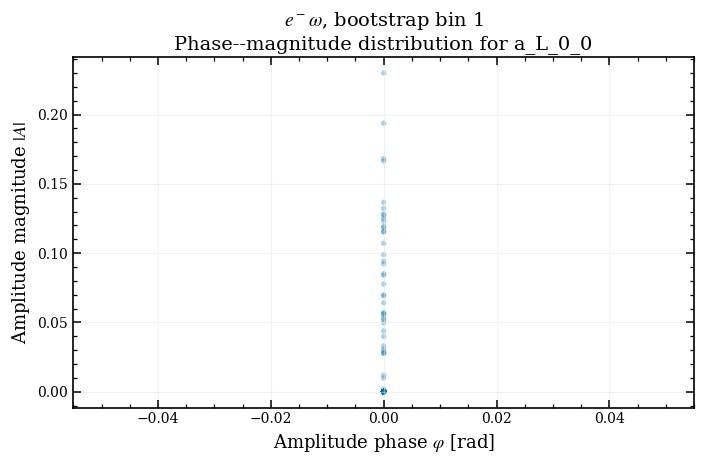

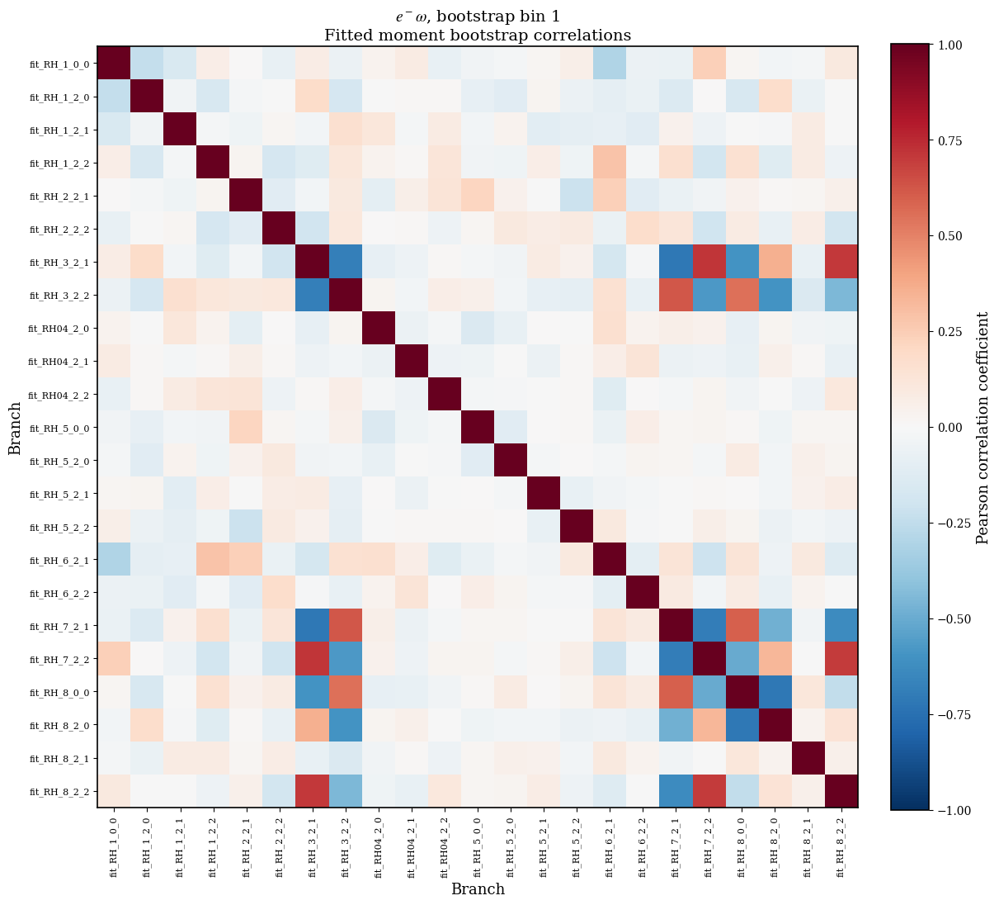

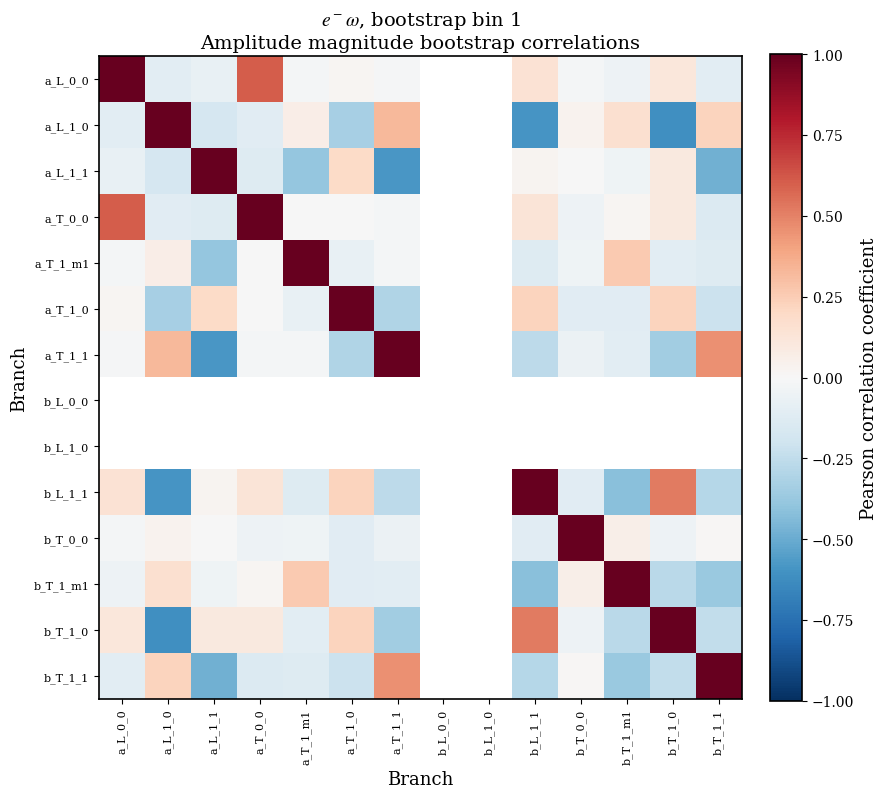

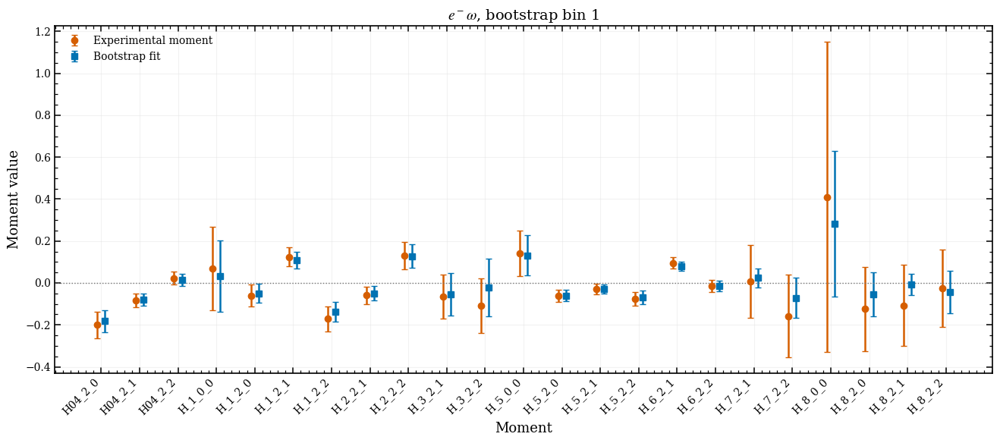

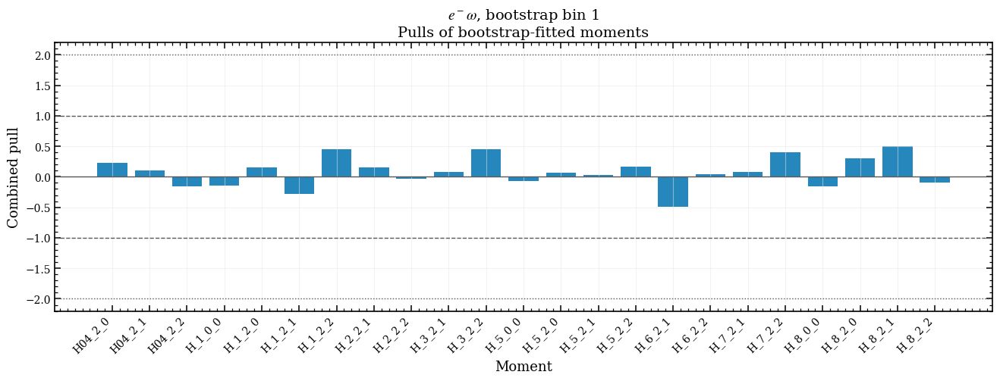


$e^-$$\omega$, bootstrap bin 2
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/ElOmega_bootstrap_2.root
Selected 847 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


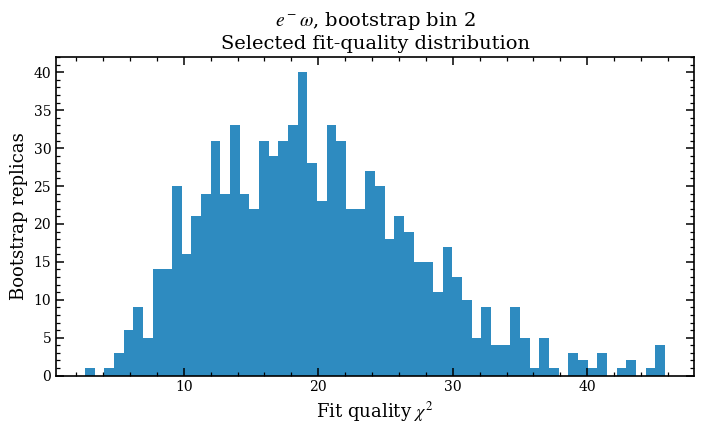

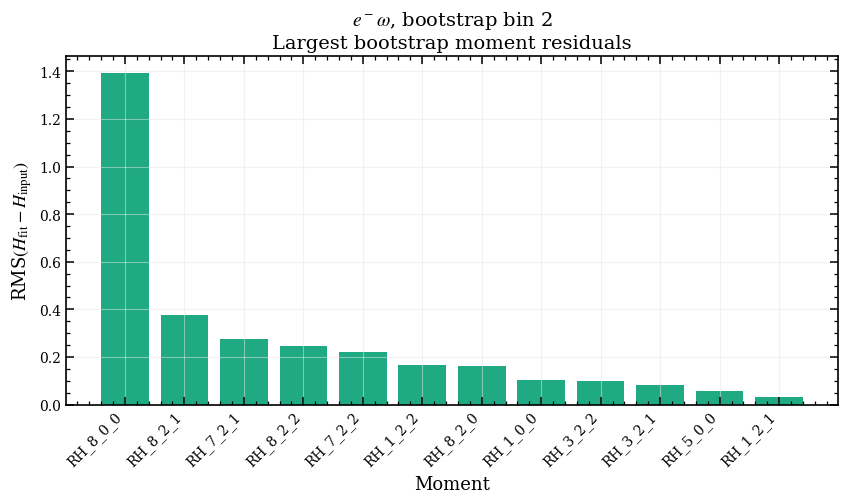

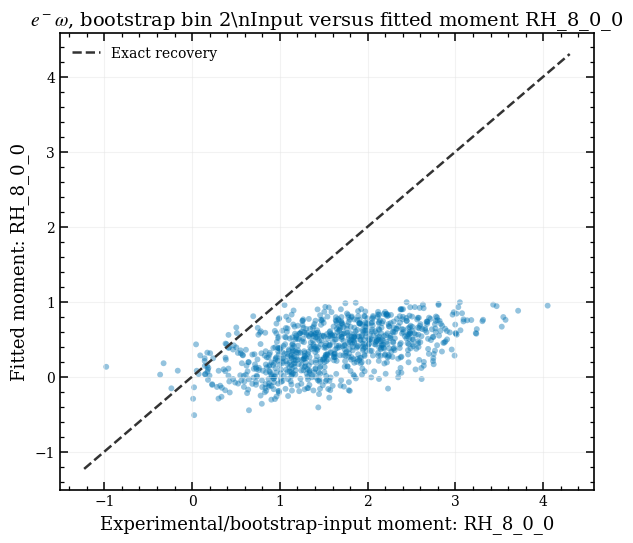

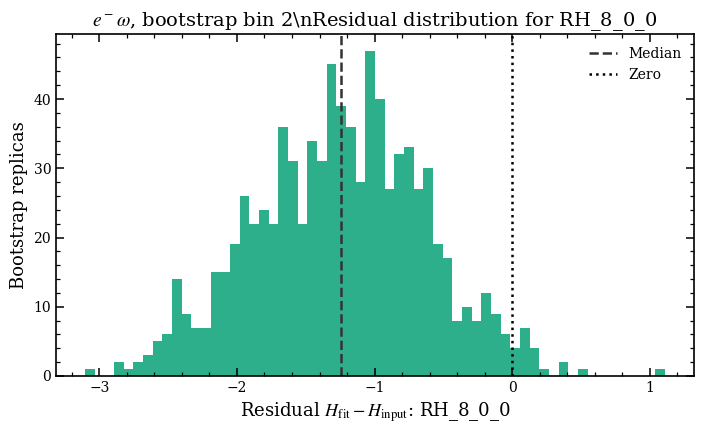

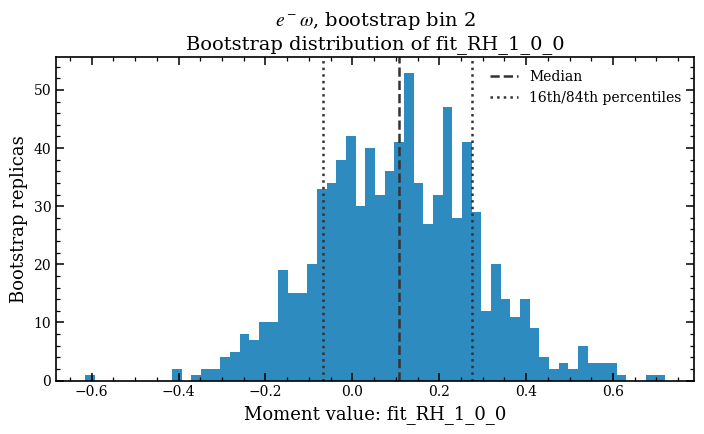

...

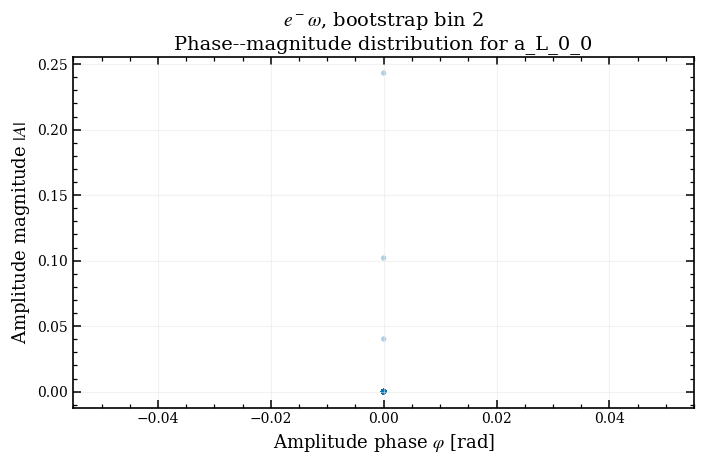

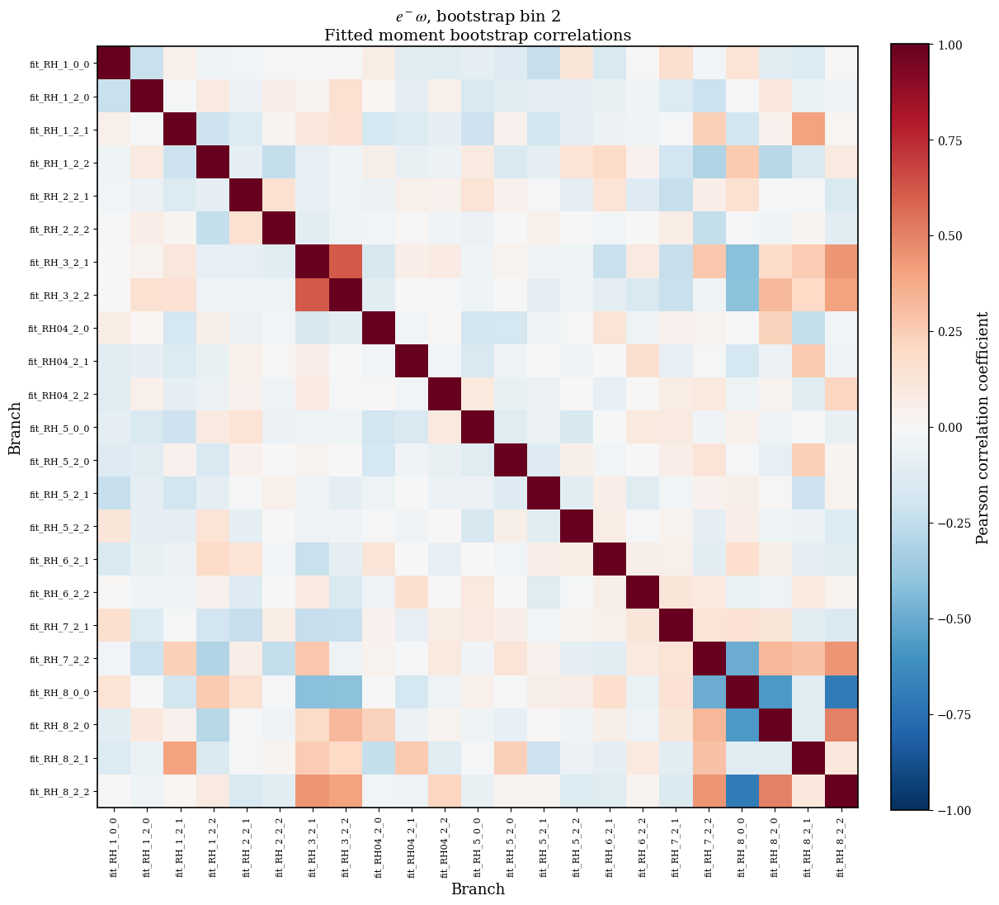

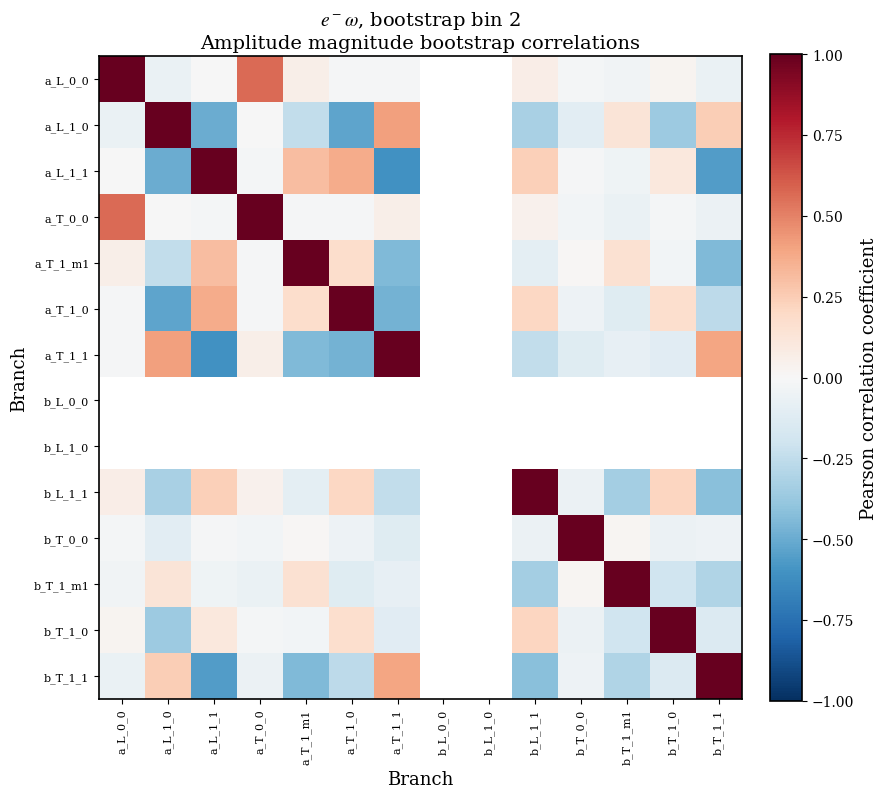

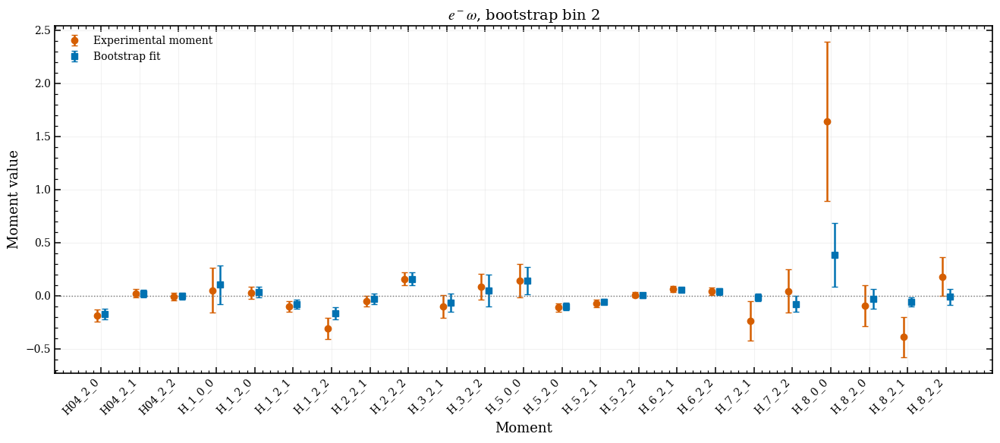

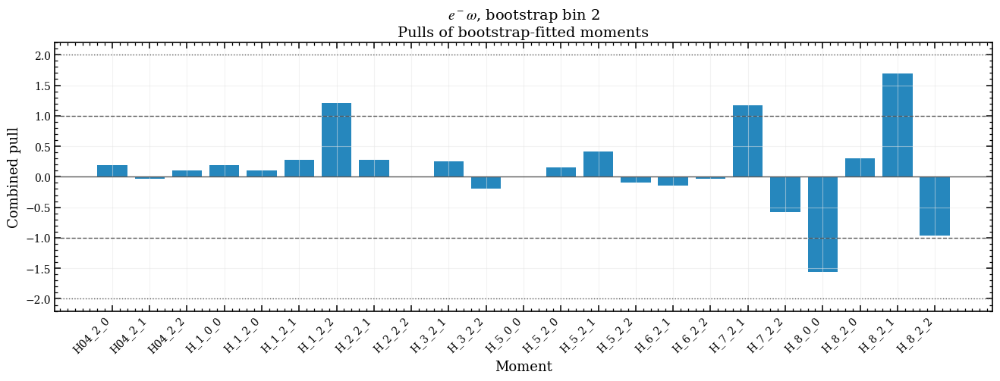


$e^-$$\phi$, bootstrap bin 0
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/ElPhi_bootstrap_0.root
Selected 990 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


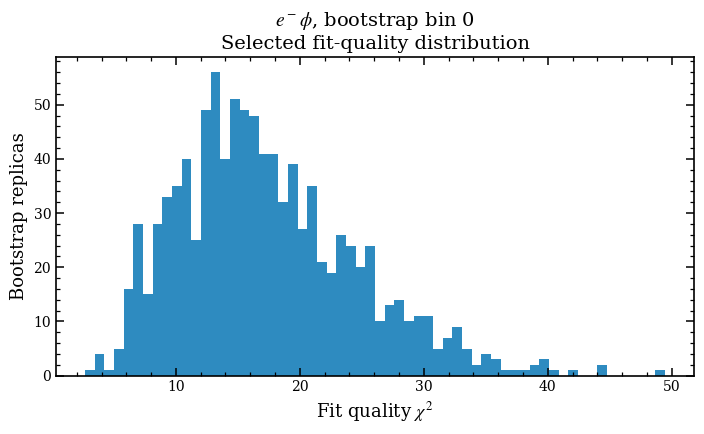

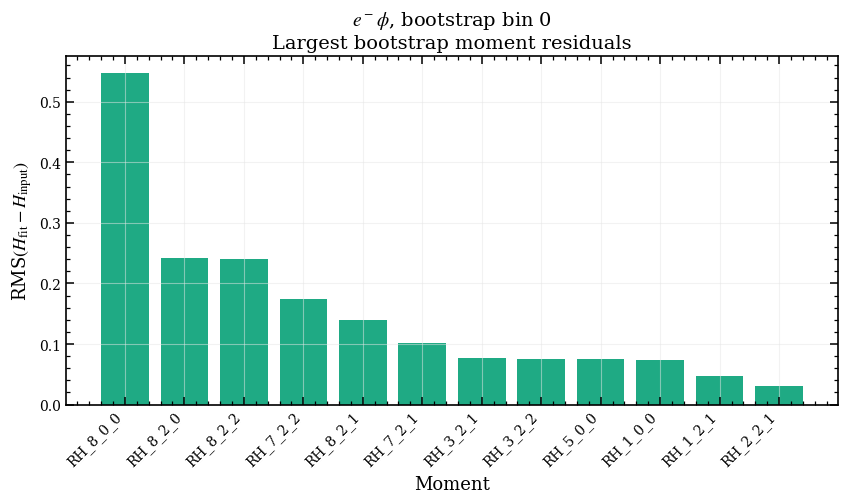

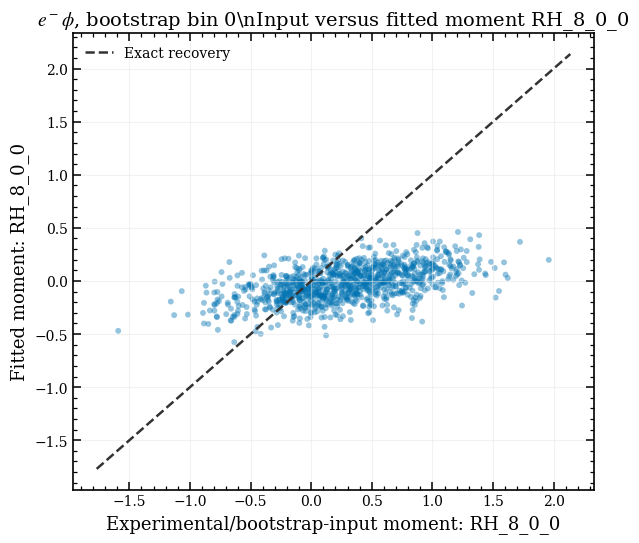

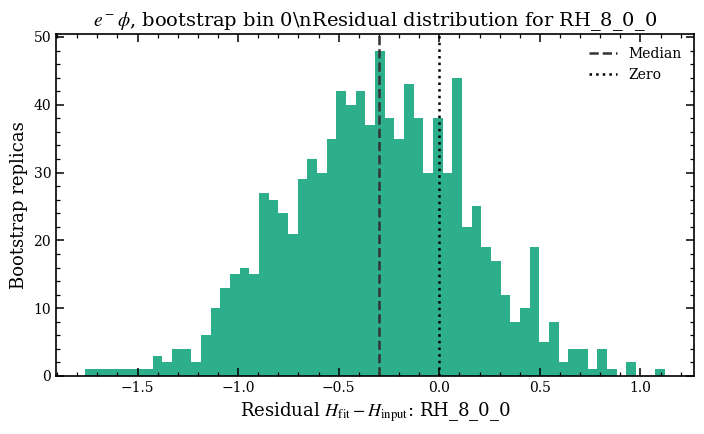

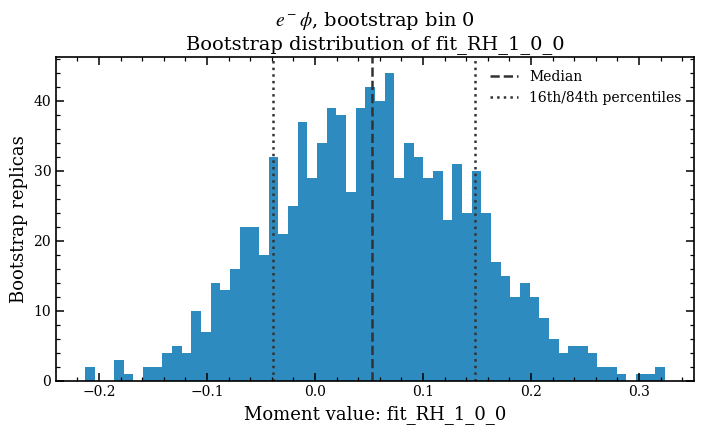

...

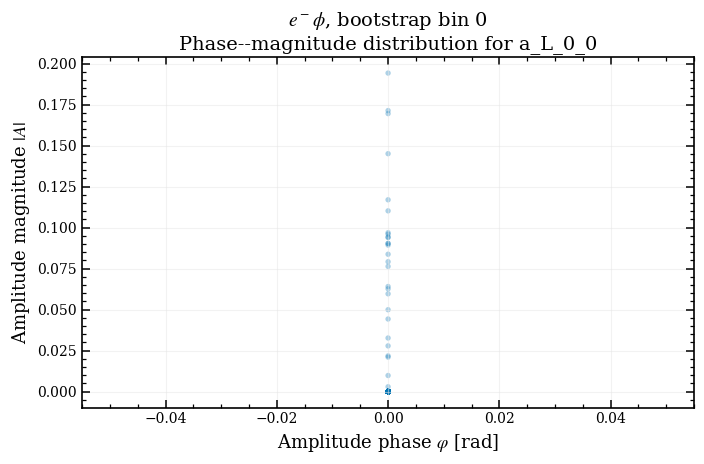

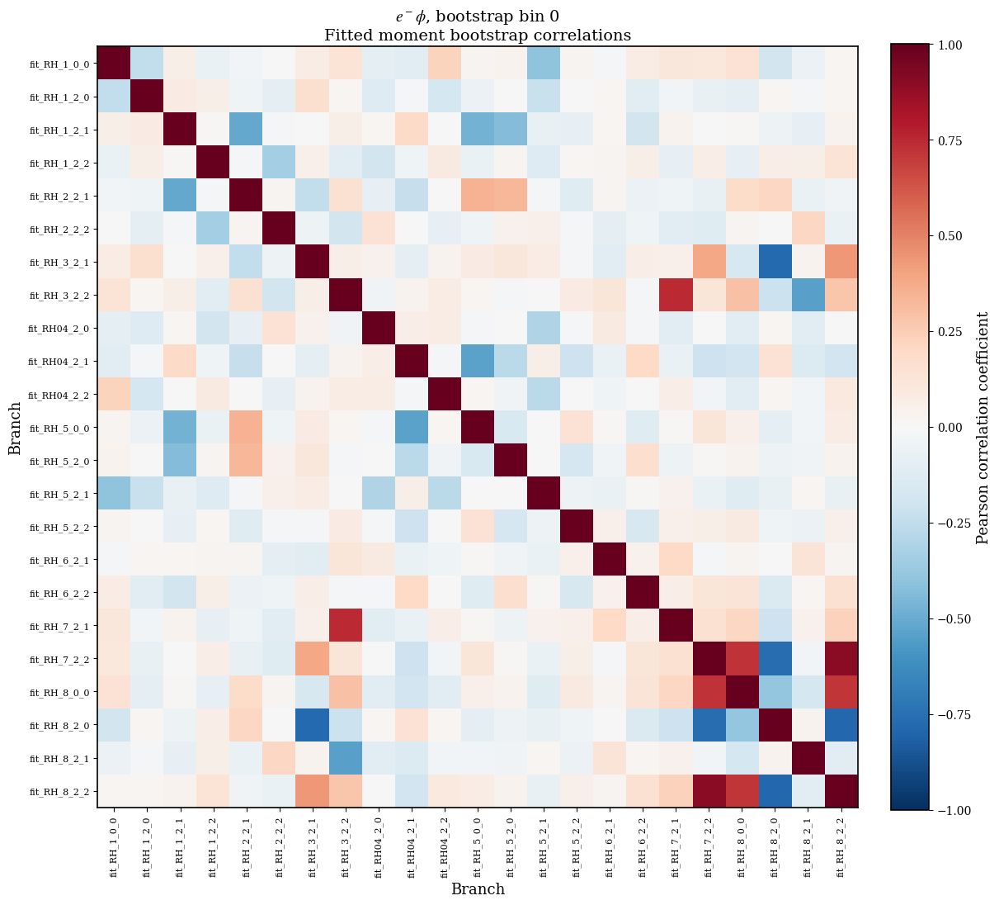

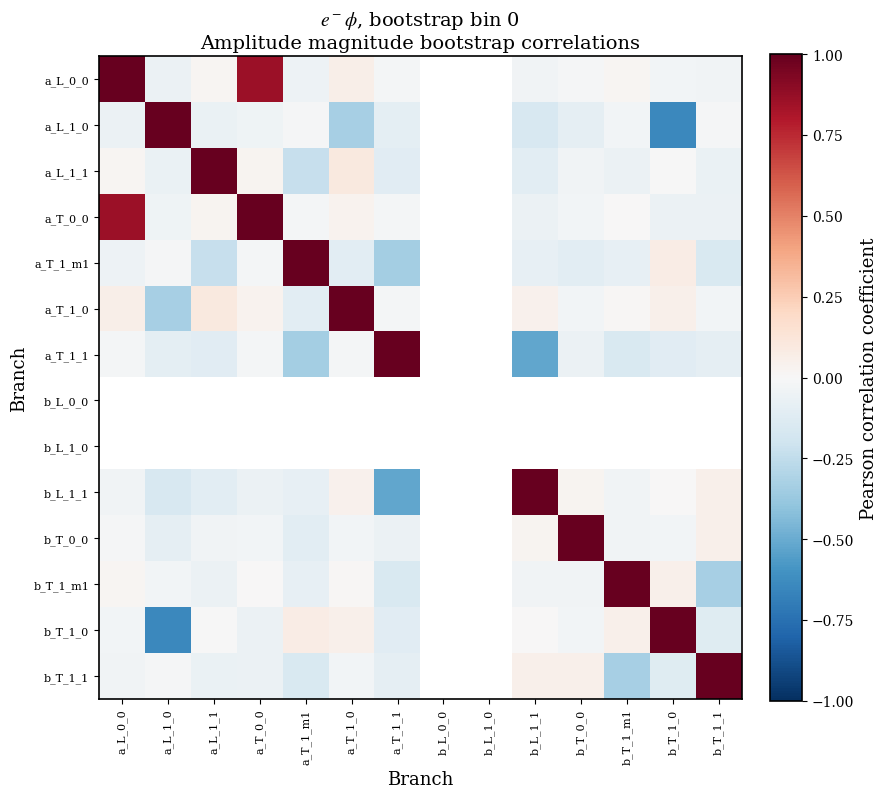

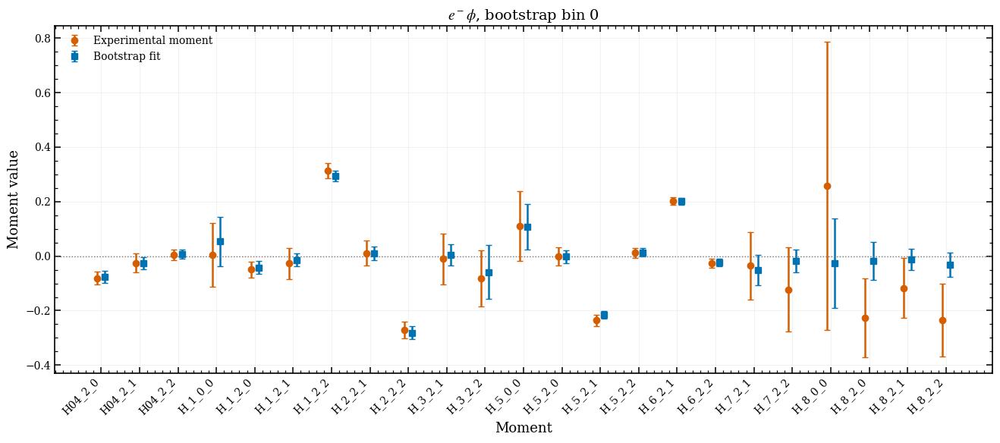

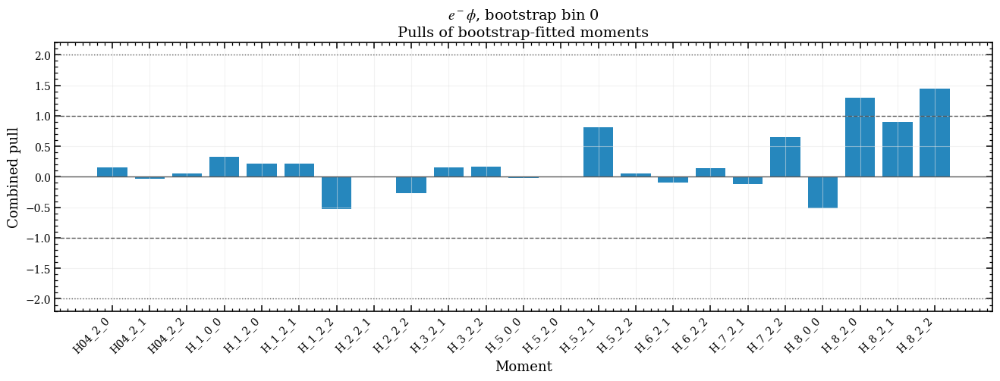


$e^-$$\phi$, bootstrap bin 1
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/ElPhi_bootstrap_1.root
Selected 979 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


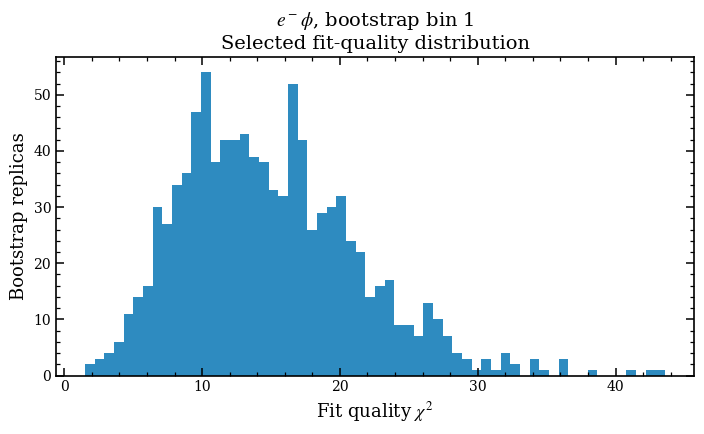

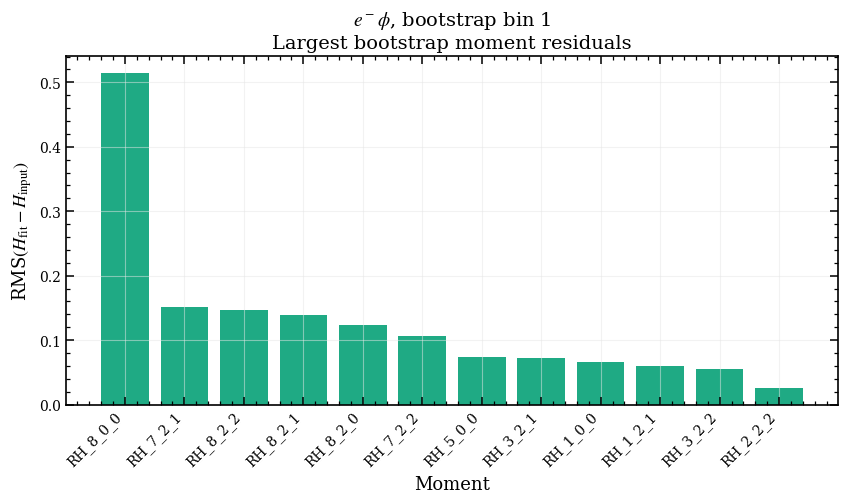

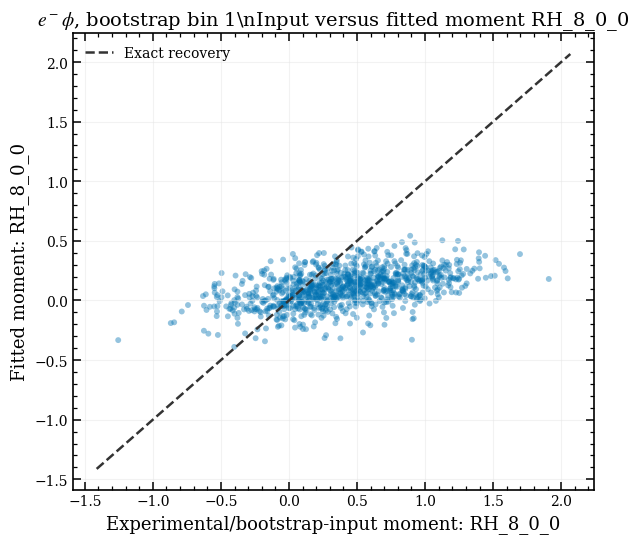

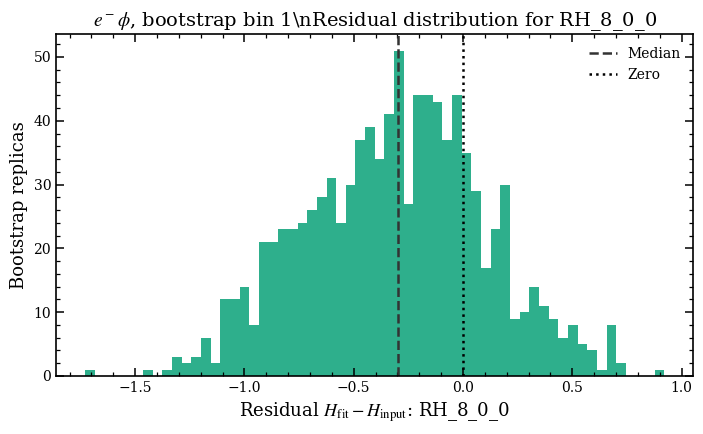

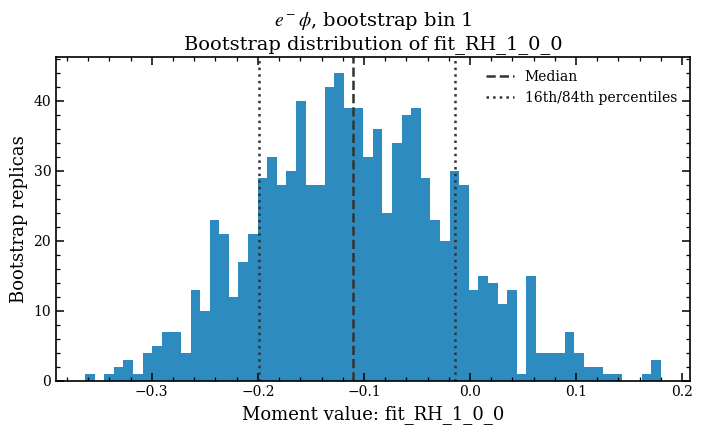

...

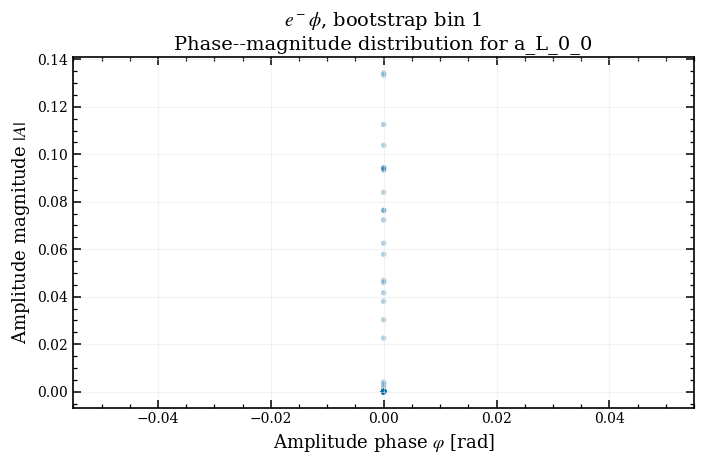

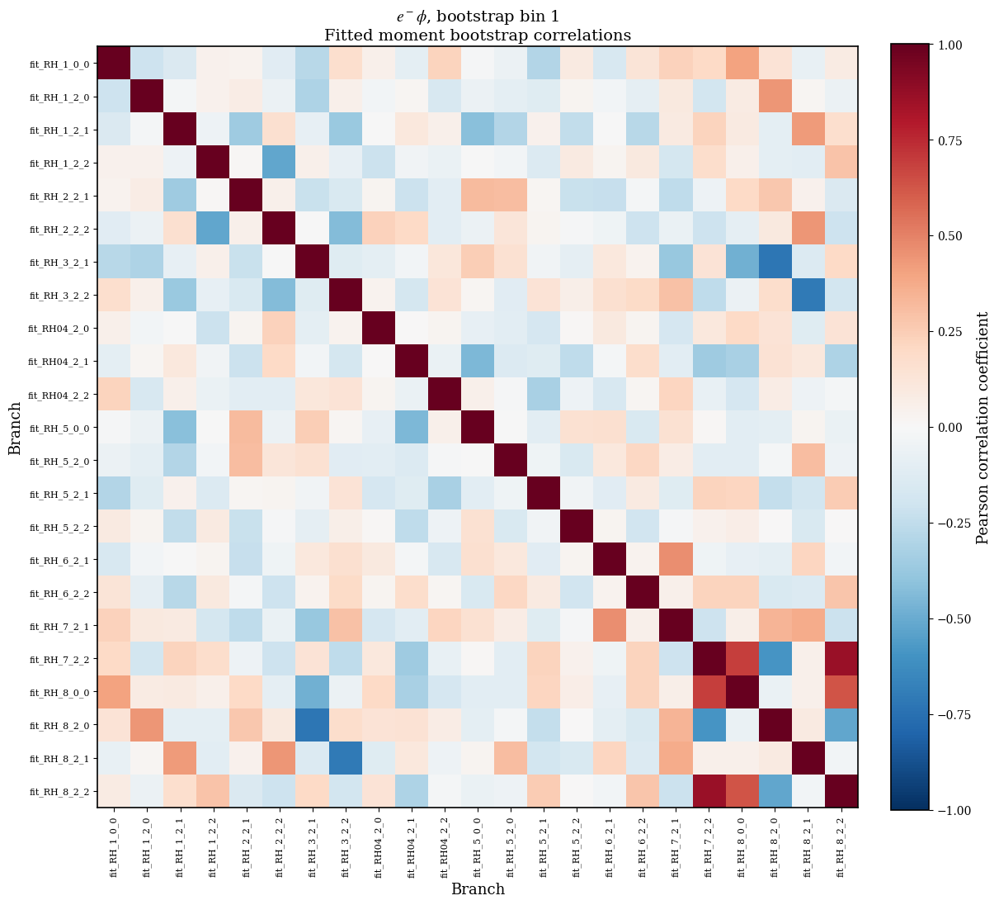

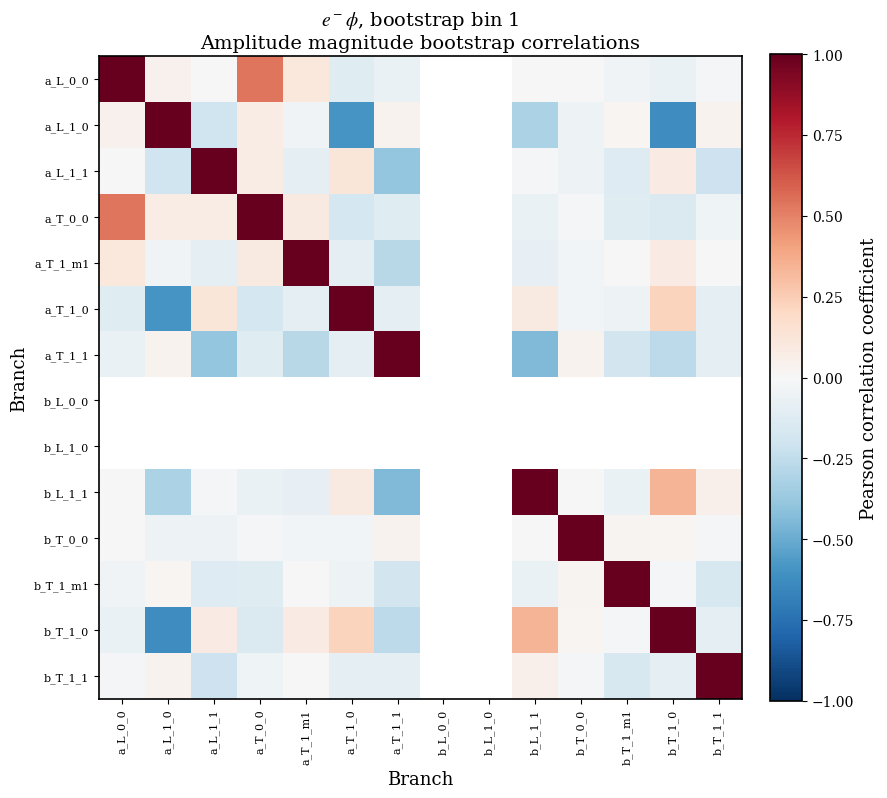

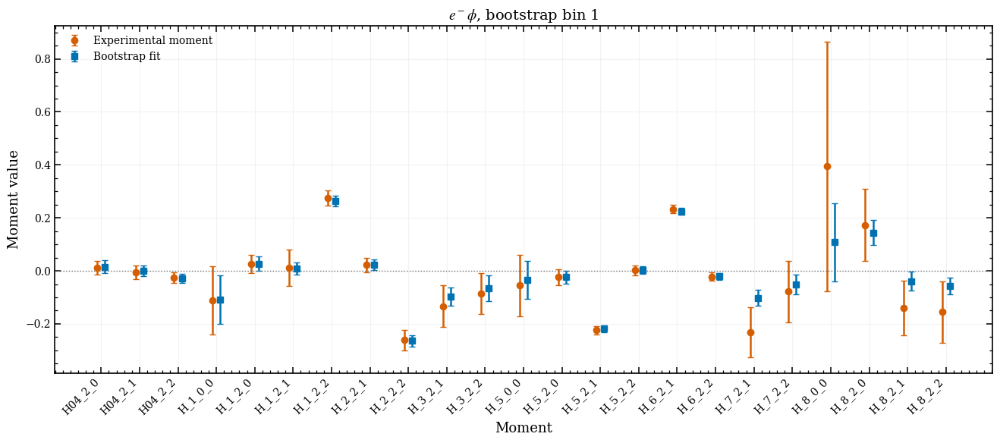

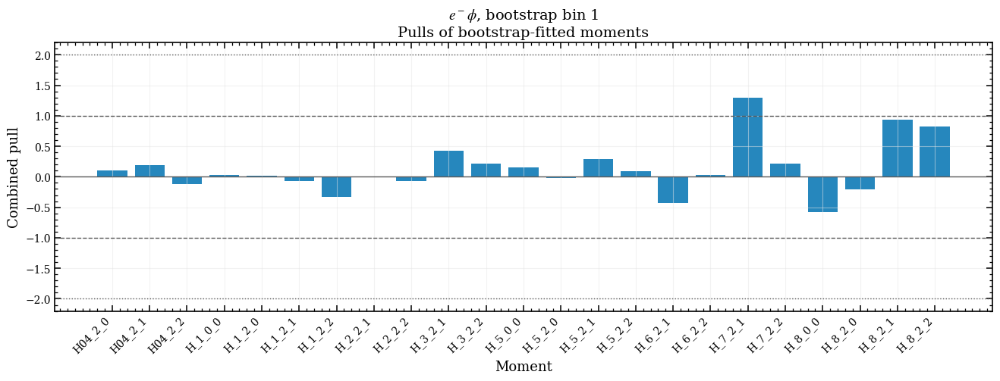


$e^-$$\phi$, bootstrap bin 2
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/ElPhi_bootstrap_2.root
Selected 976 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


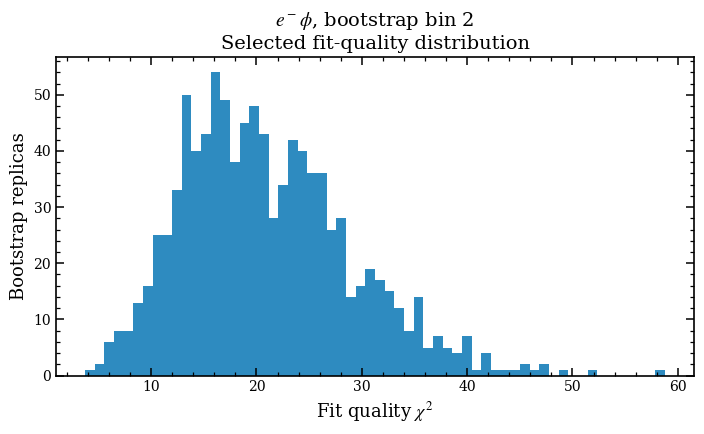

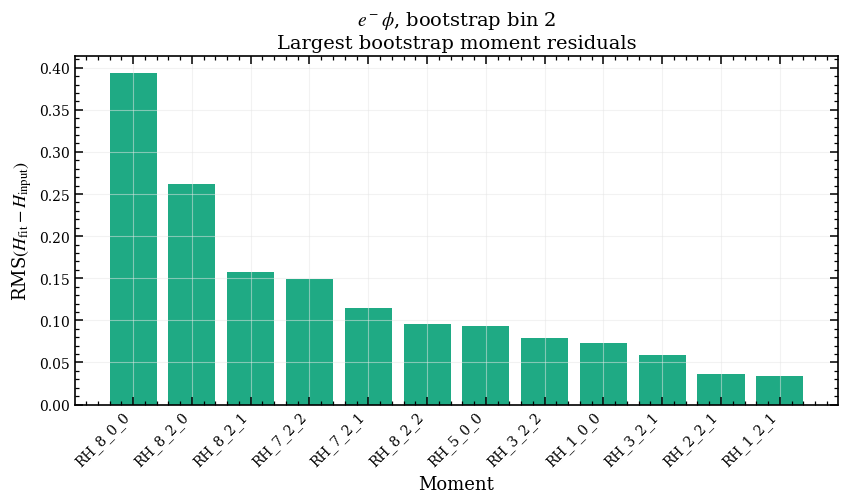

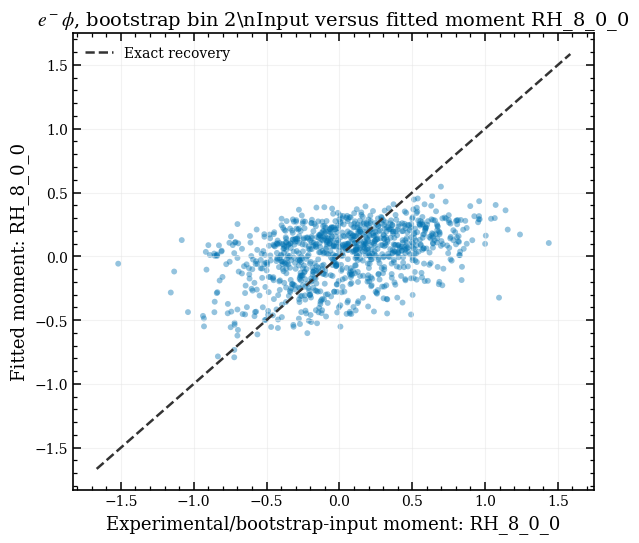

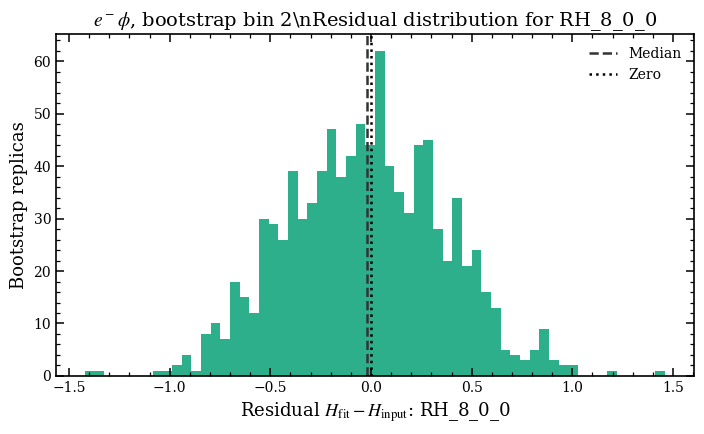

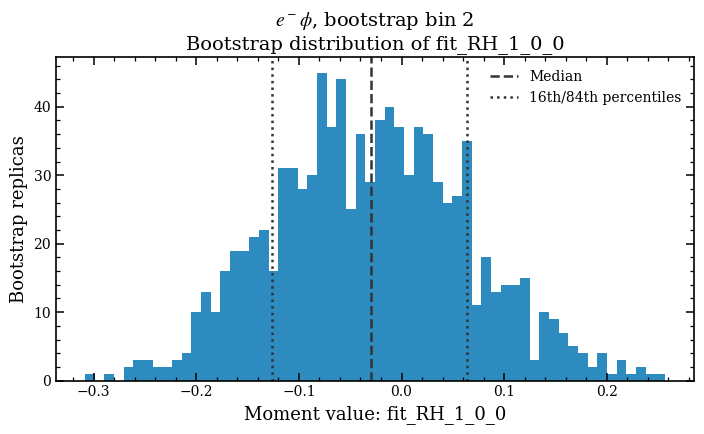

...

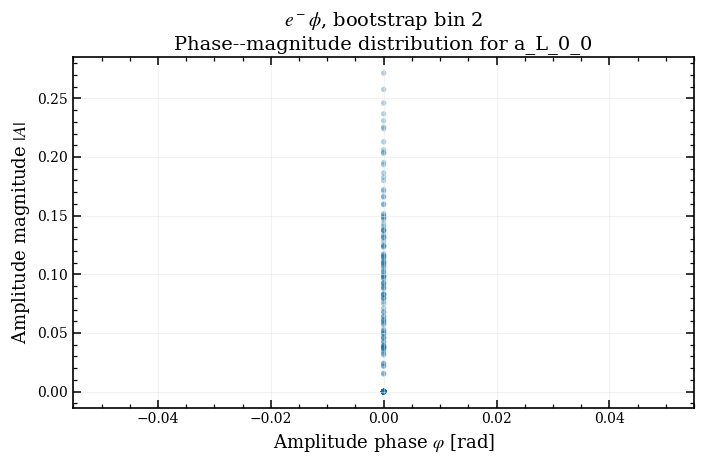

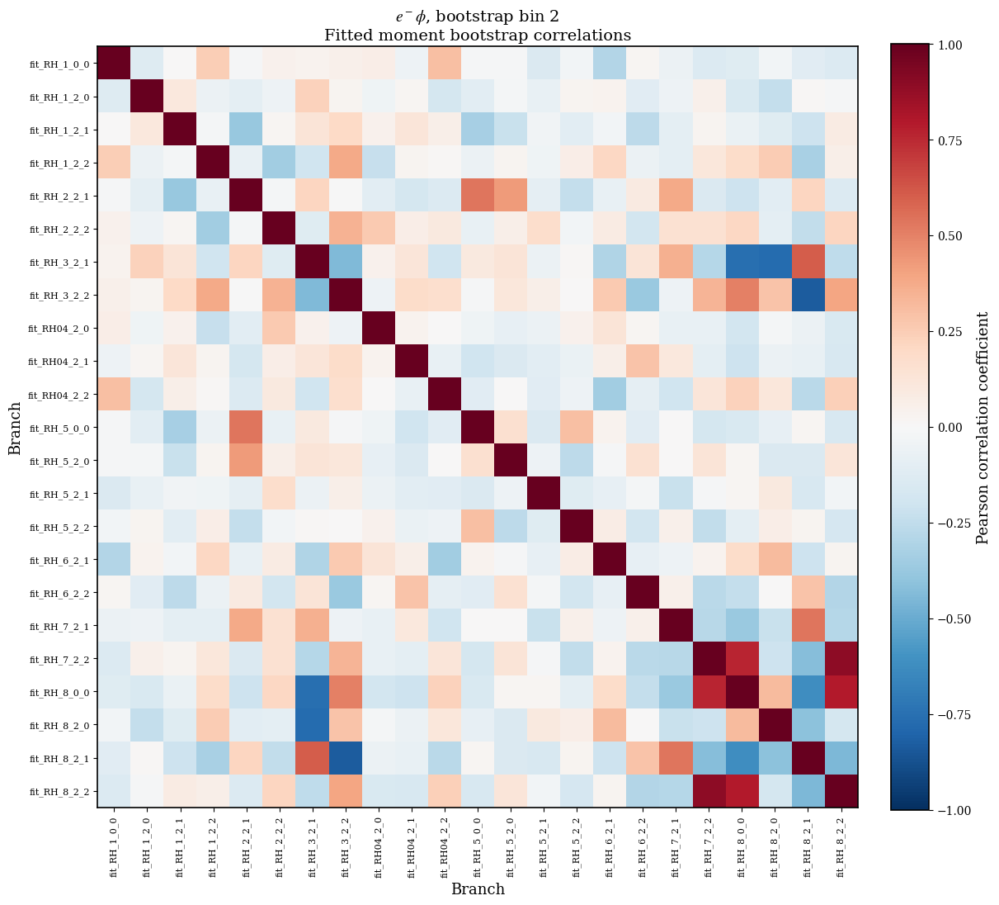

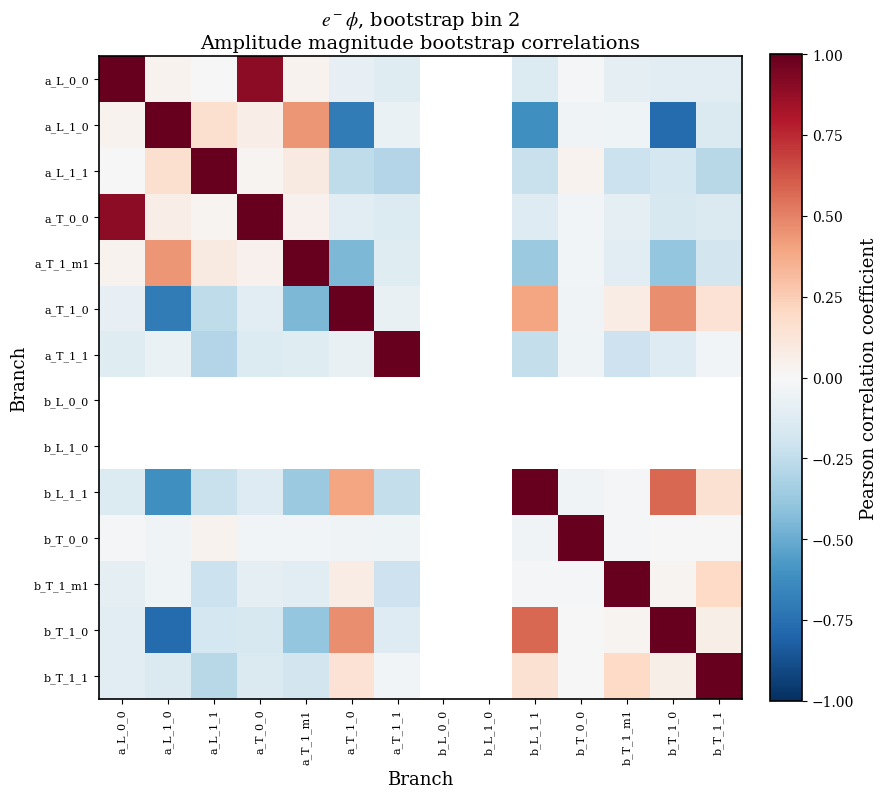

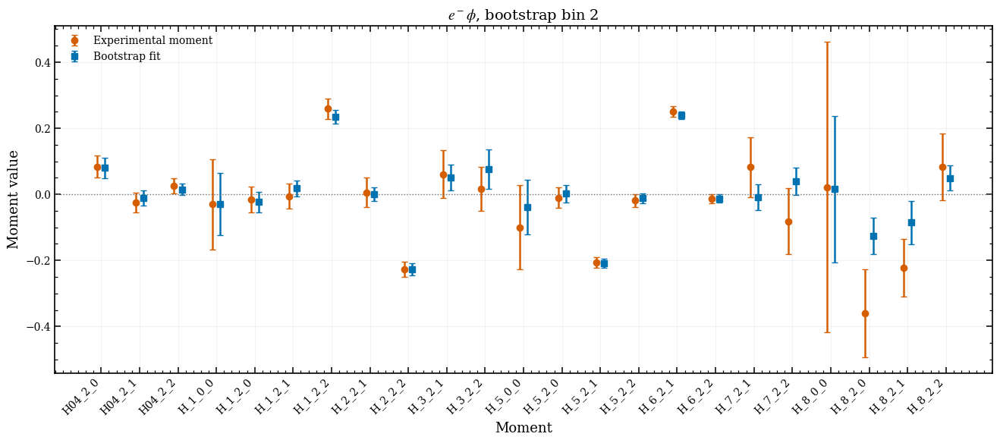

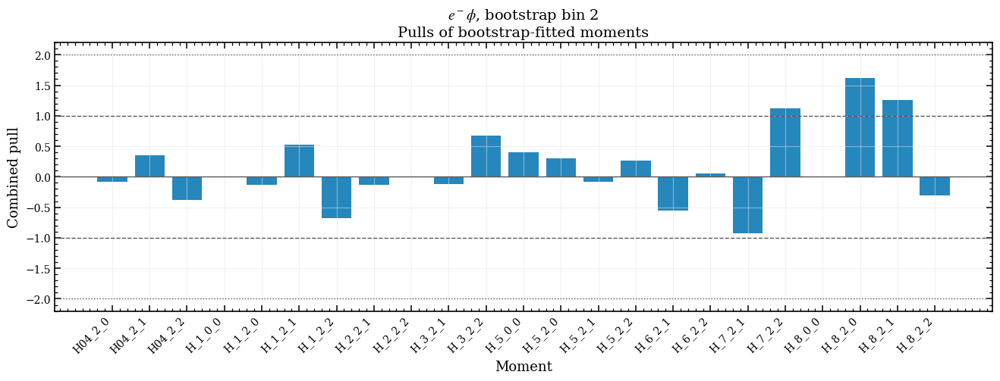


$e^-$$\rho^0$, bootstrap bin 0
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/ElRho_bootstrap_0.root
Selected 959 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


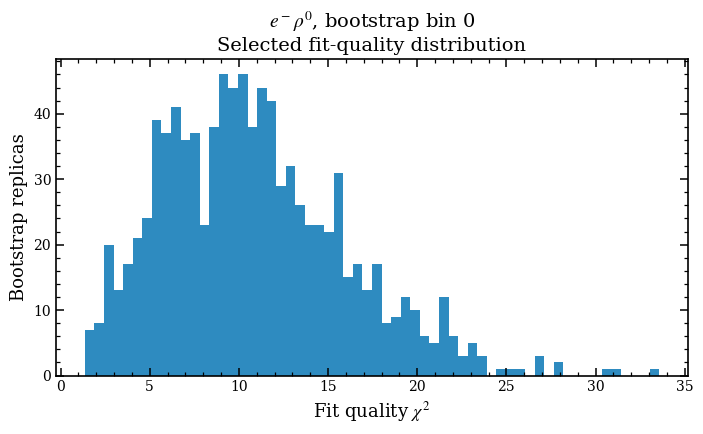

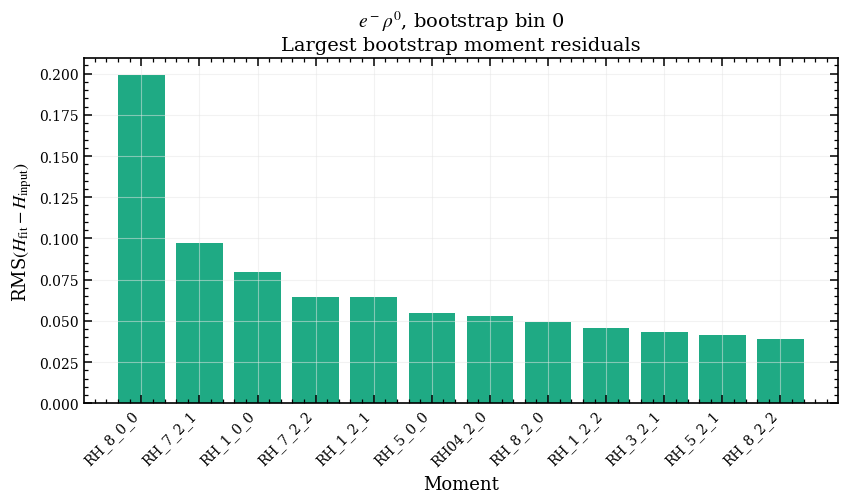

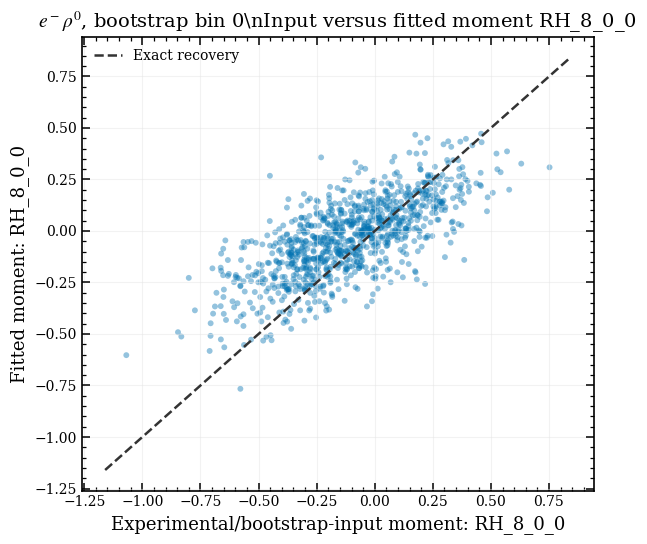

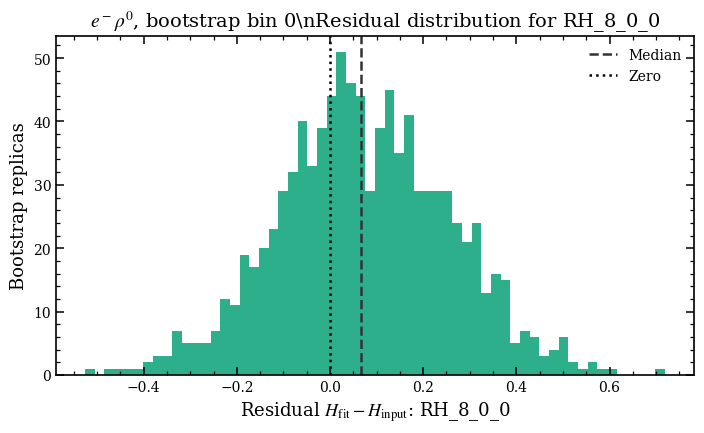

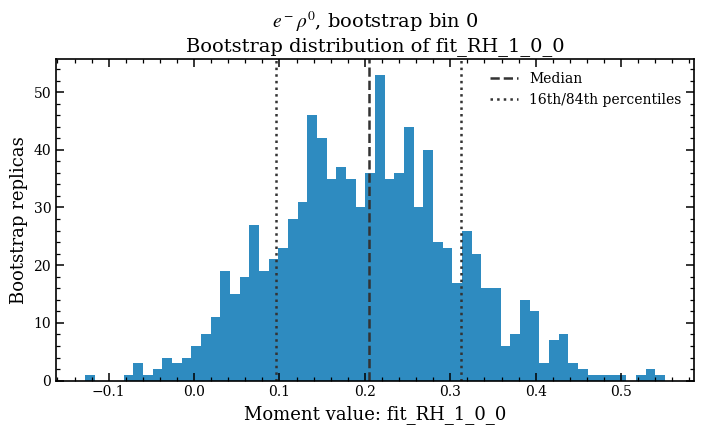

...

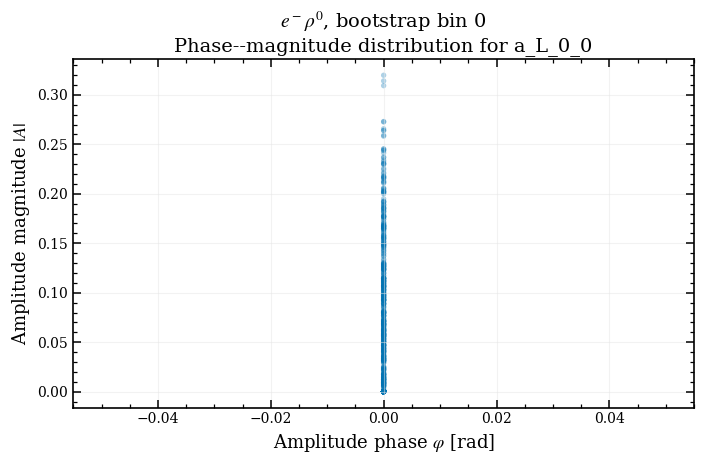

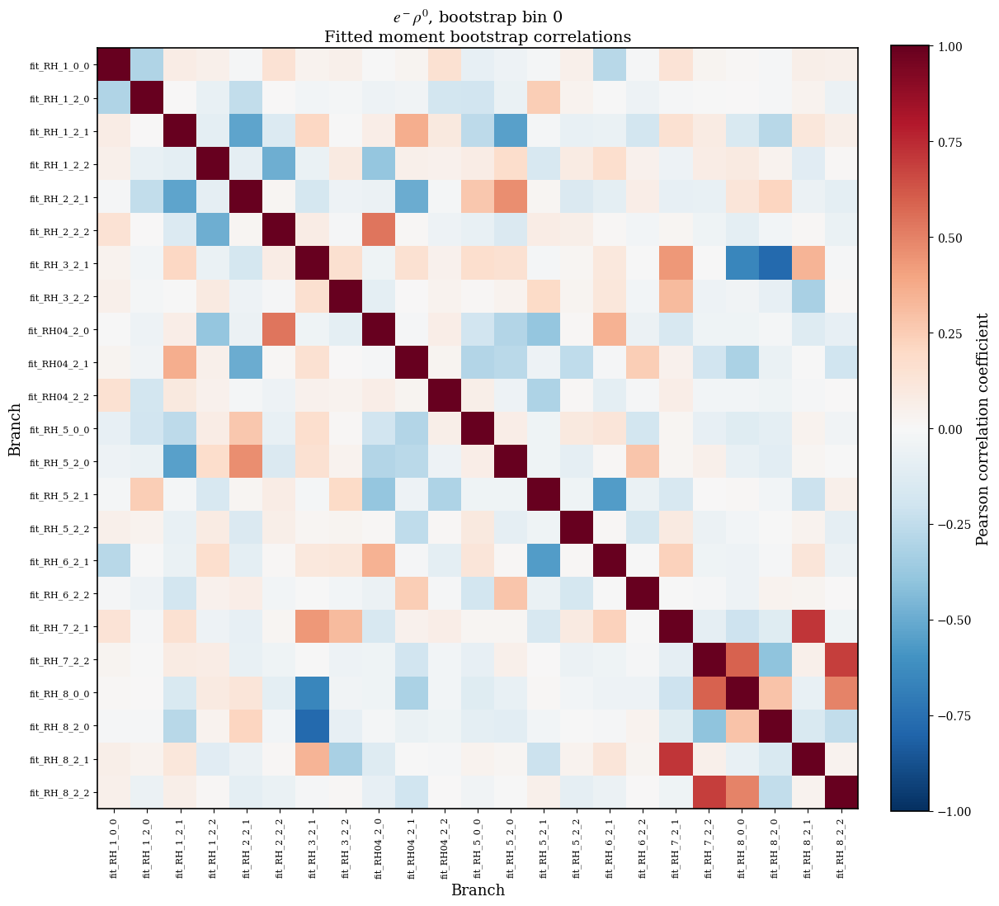

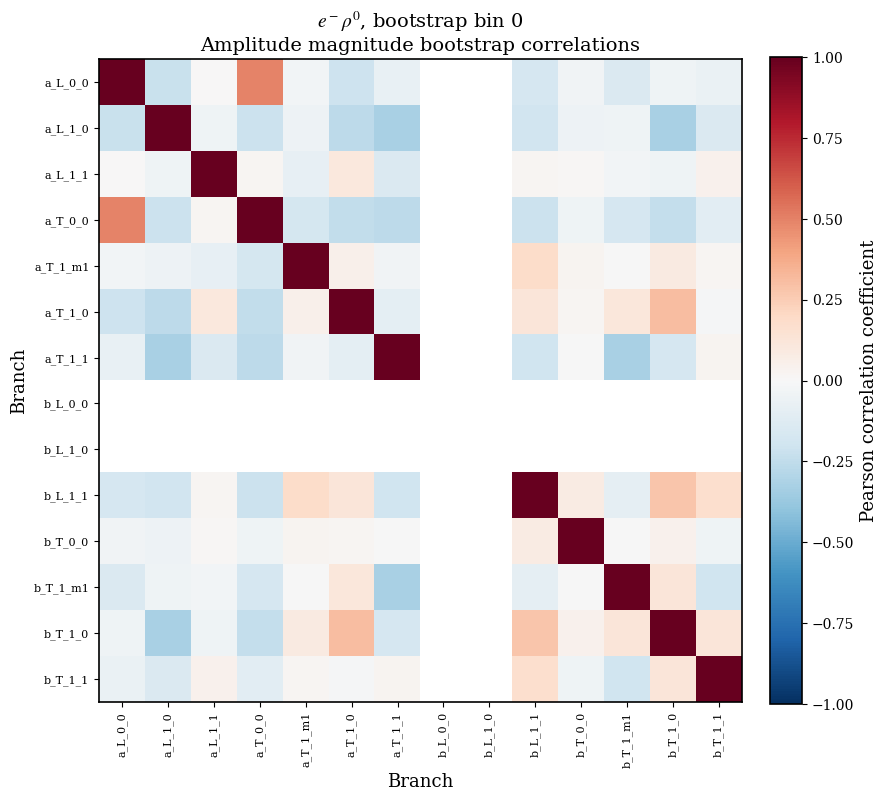

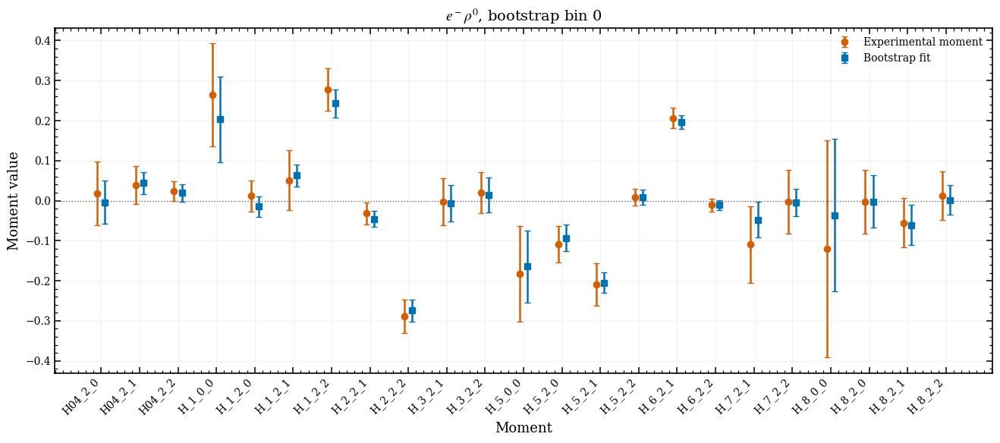

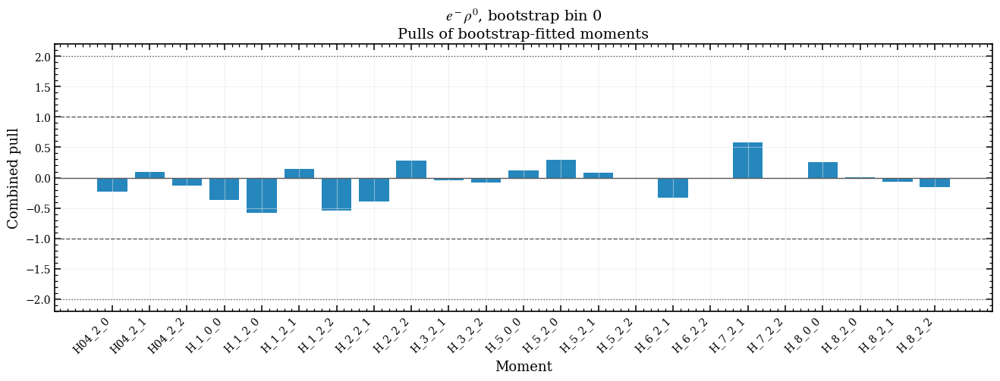


$e^-$$\rho^0$, bootstrap bin 1
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/ElRho_bootstrap_1.root
Selected 951 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


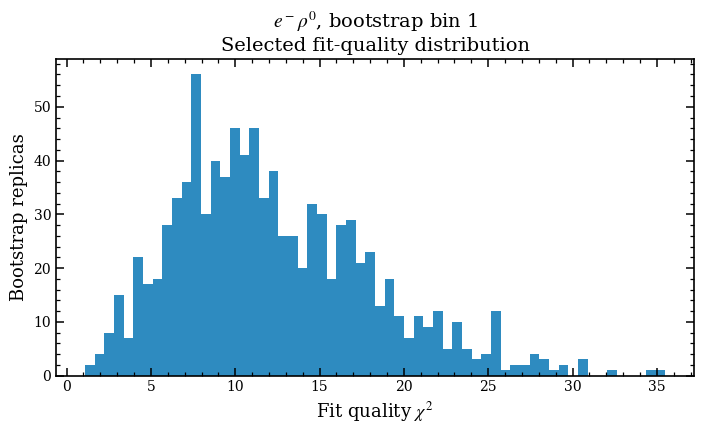

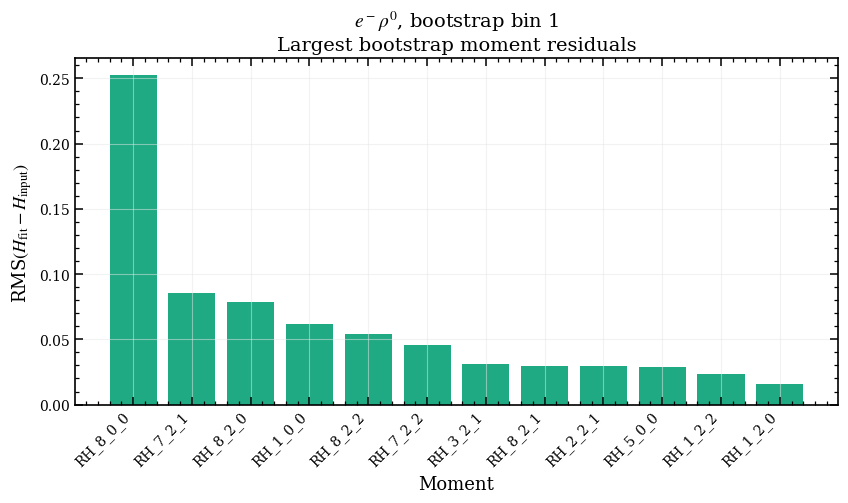

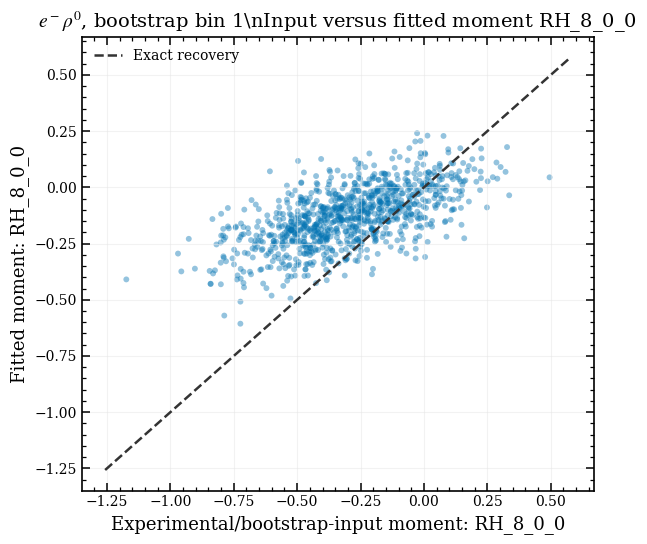

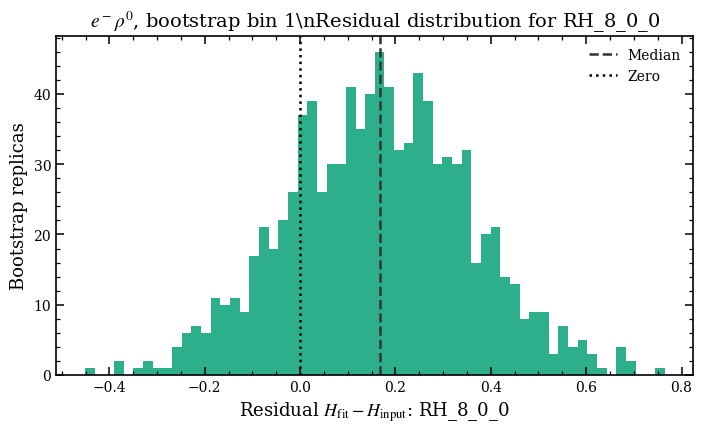

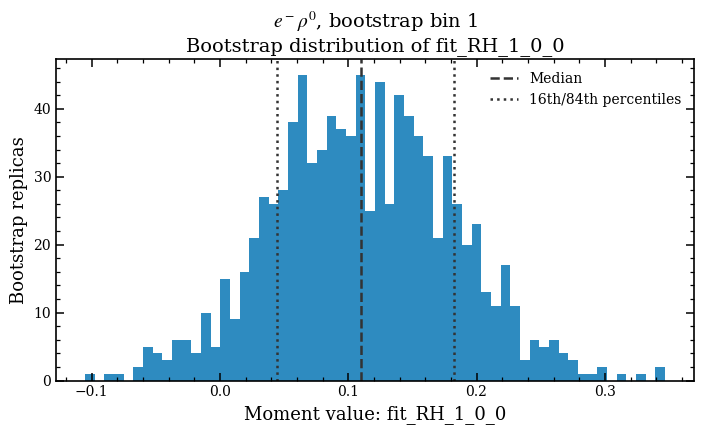

...

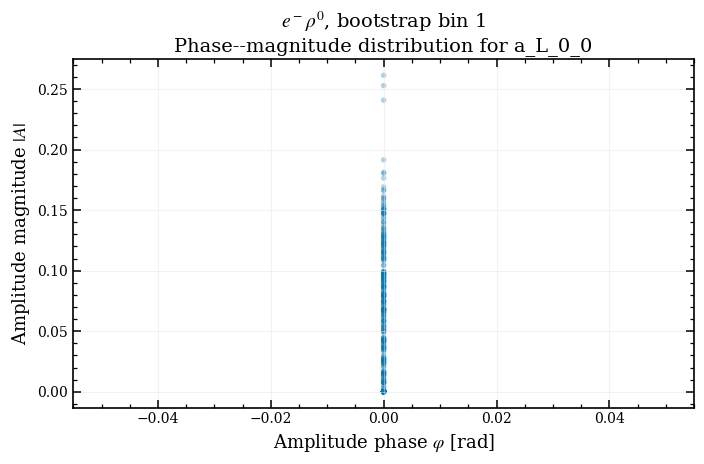

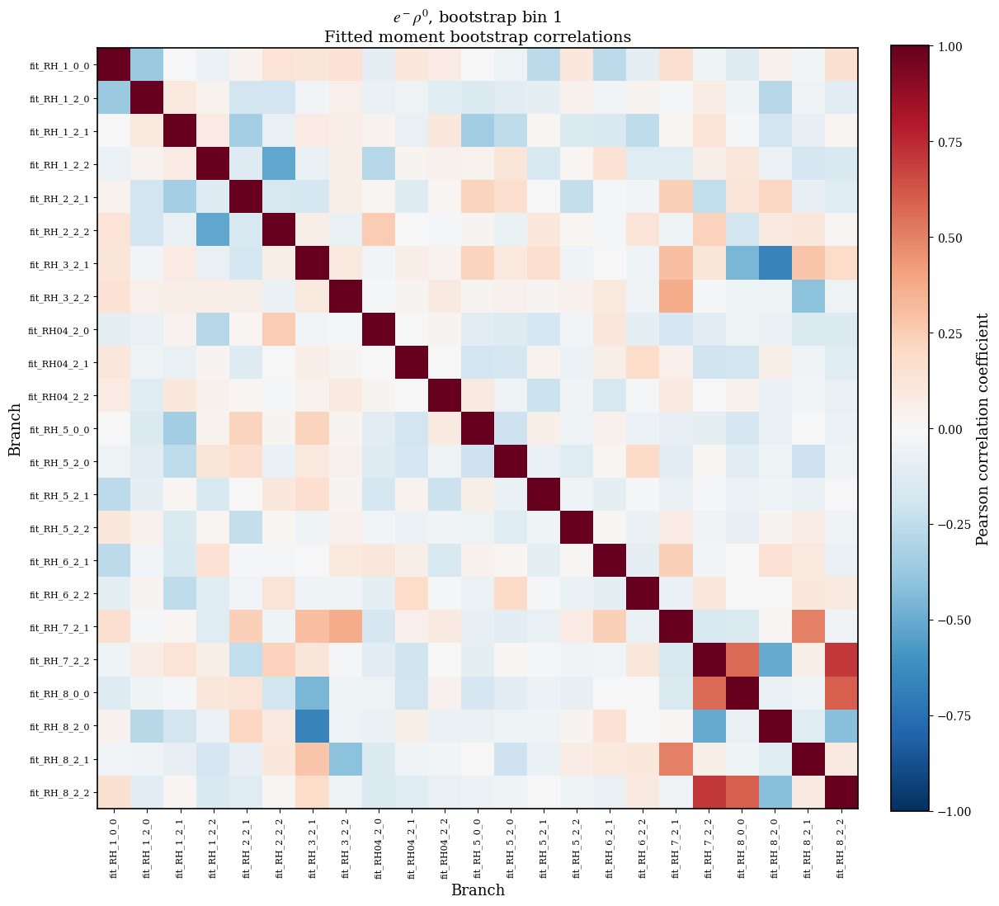

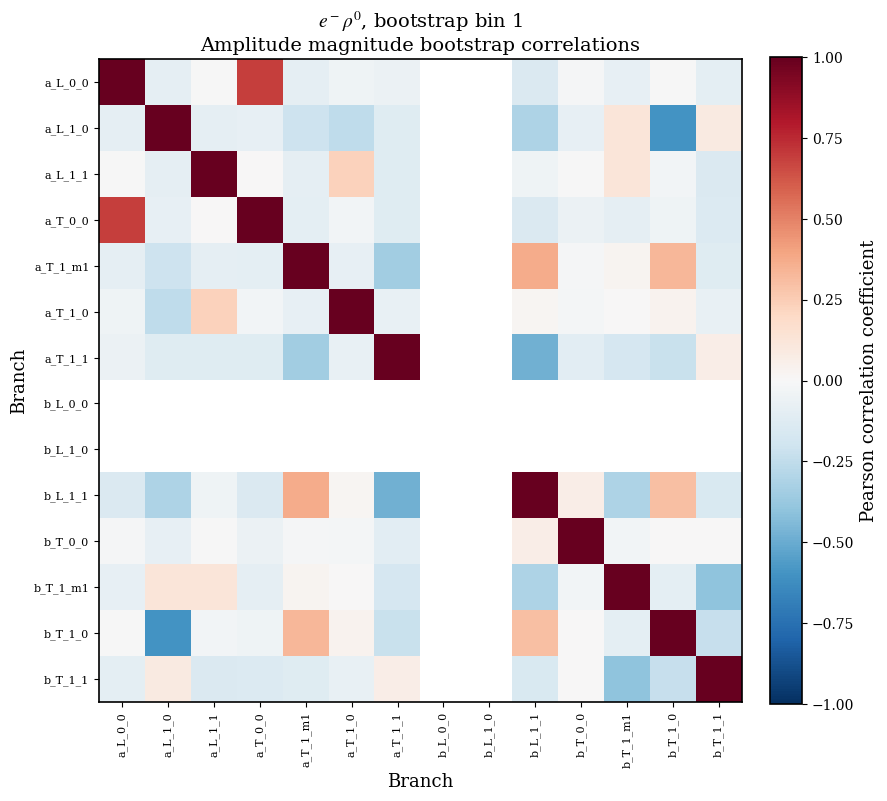

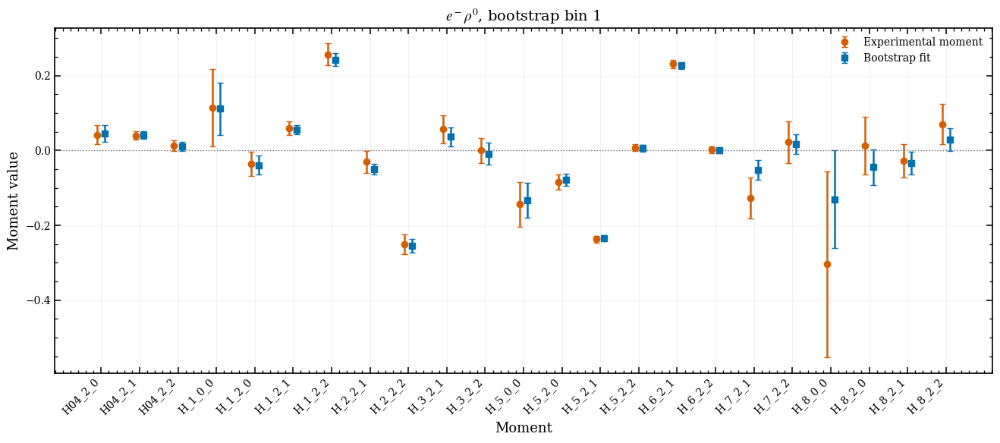

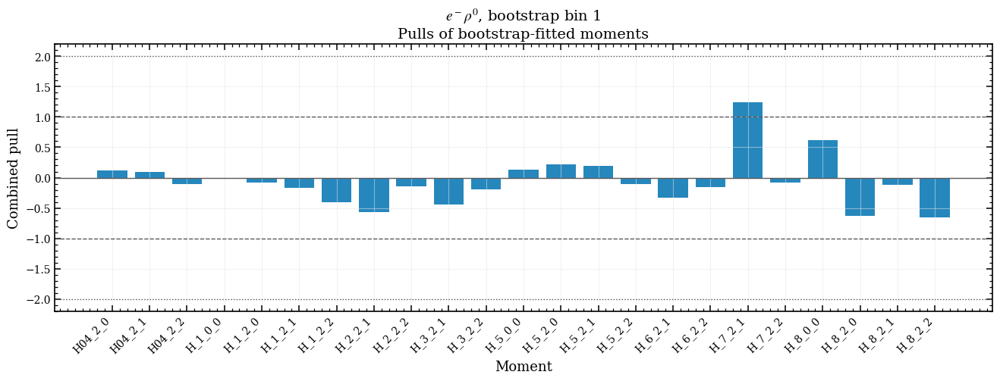


$e^-$$\rho^0$, bootstrap bin 2
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/ElRho_bootstrap_2.root
Selected 919 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


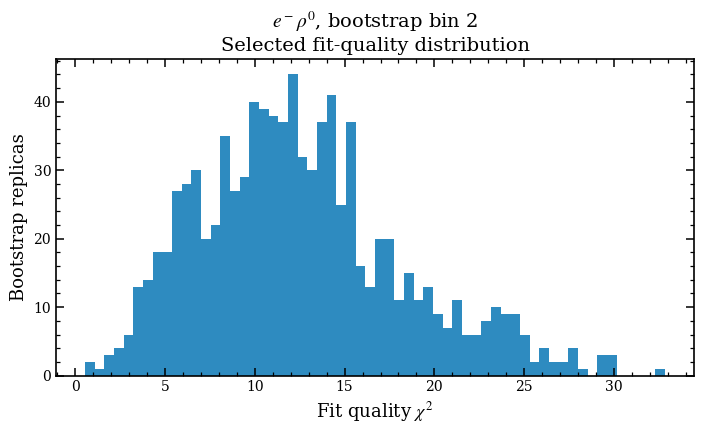

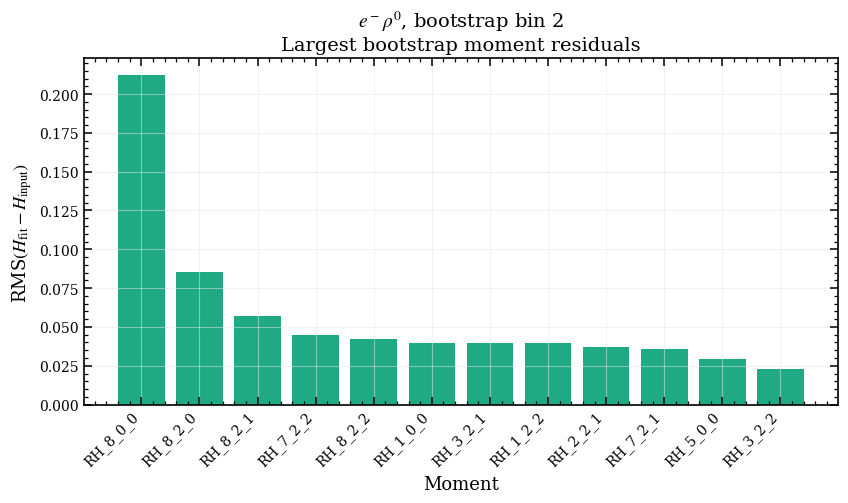

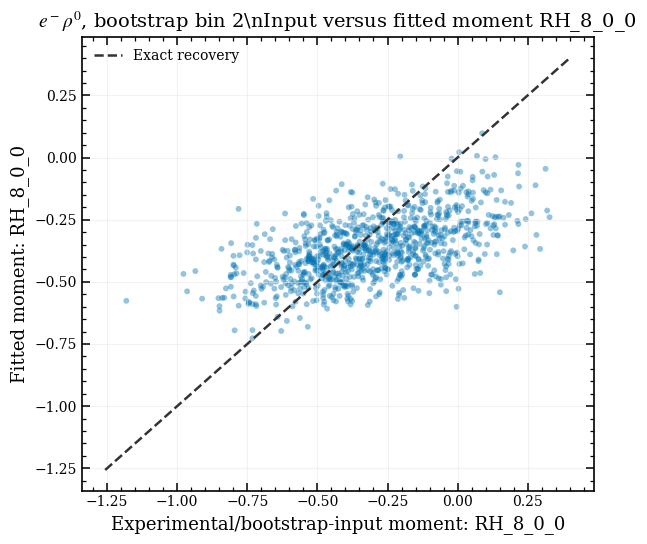

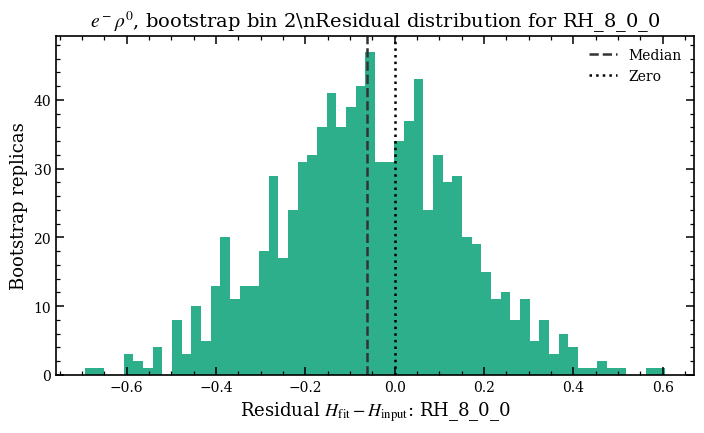

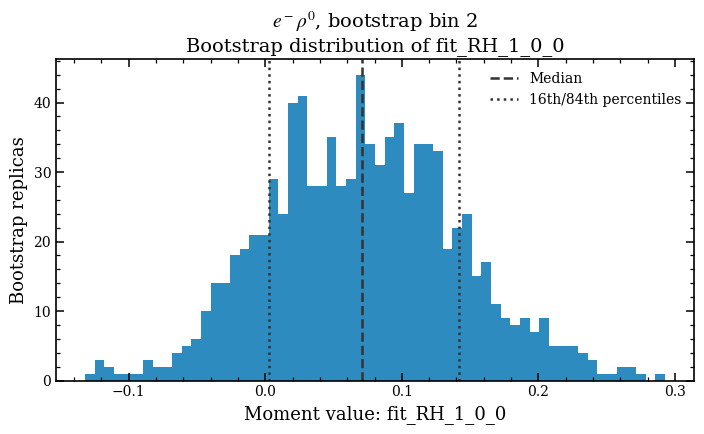

...

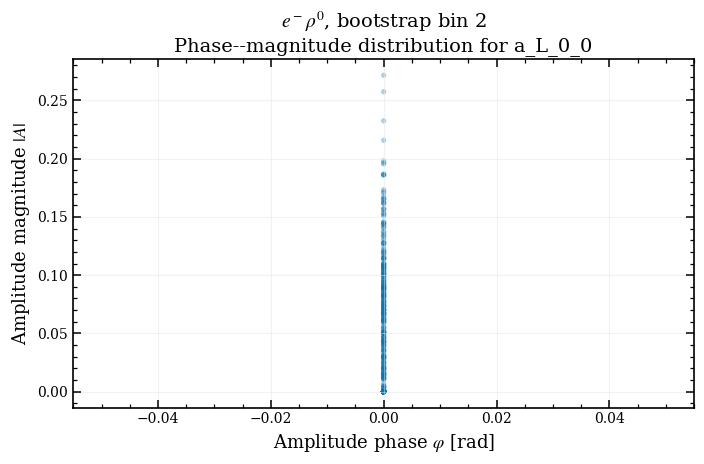

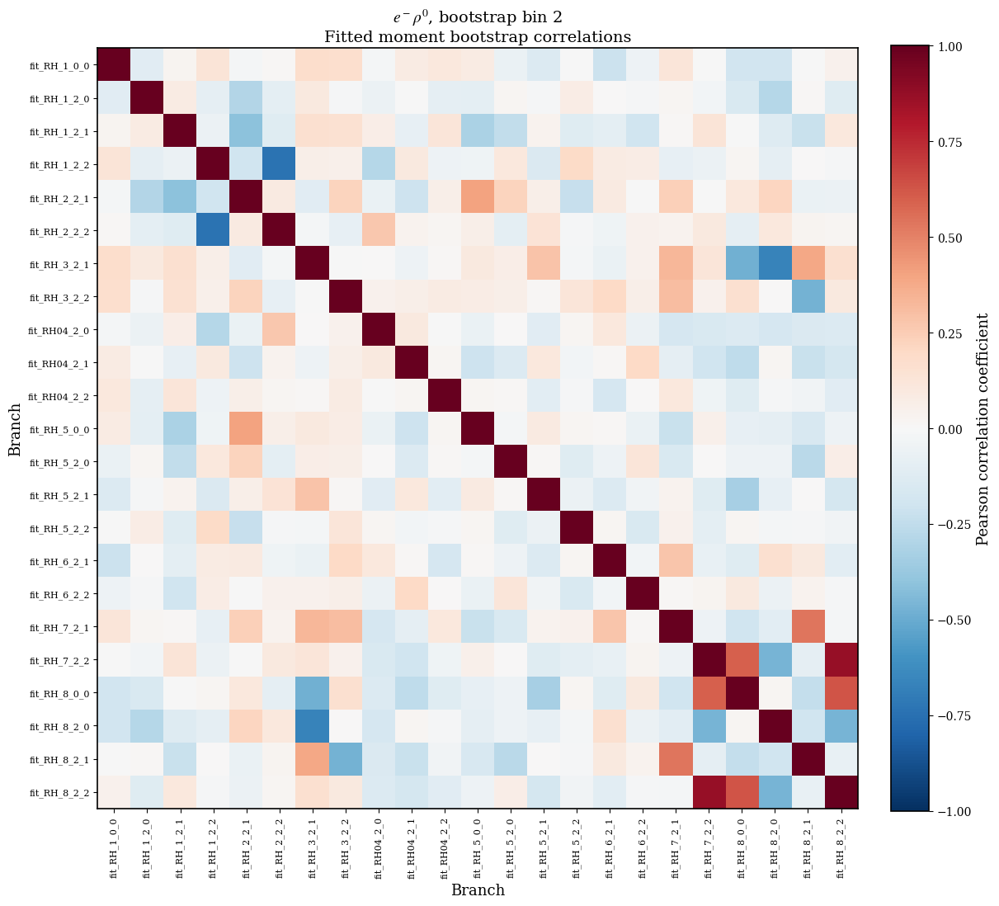

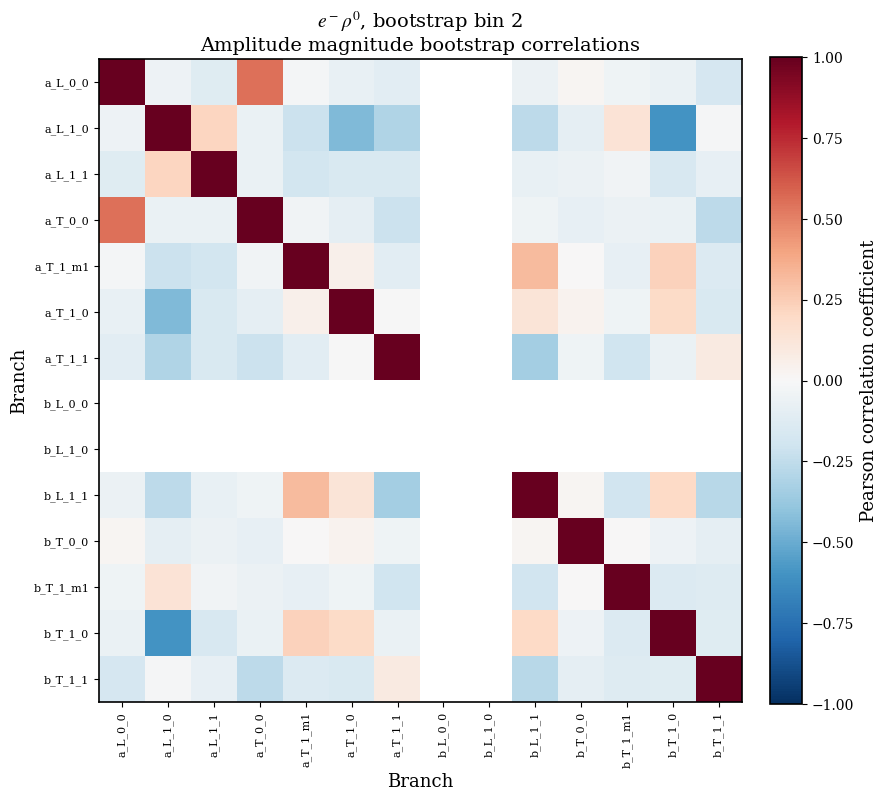

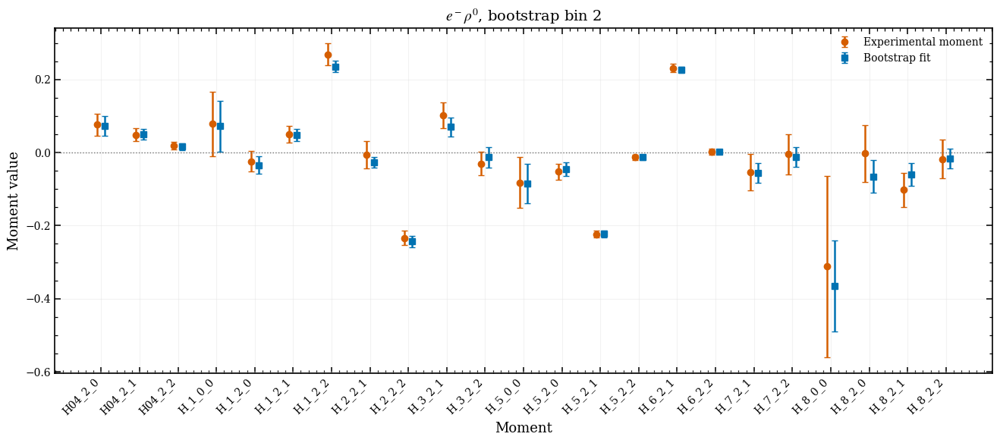

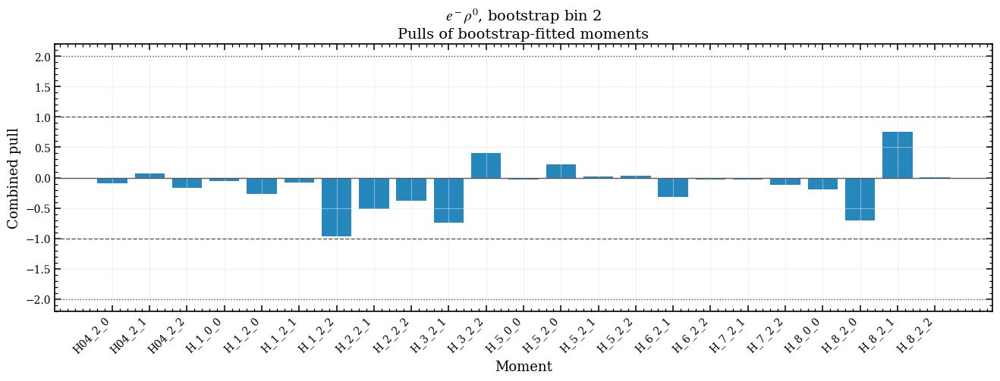


$e^-$$\rho^0$, bootstrap bin 3
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/ElRho_bootstrap_3.root
Selected 973 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


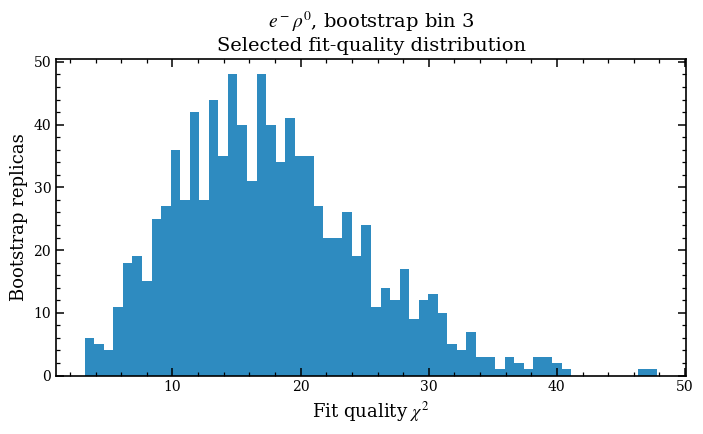

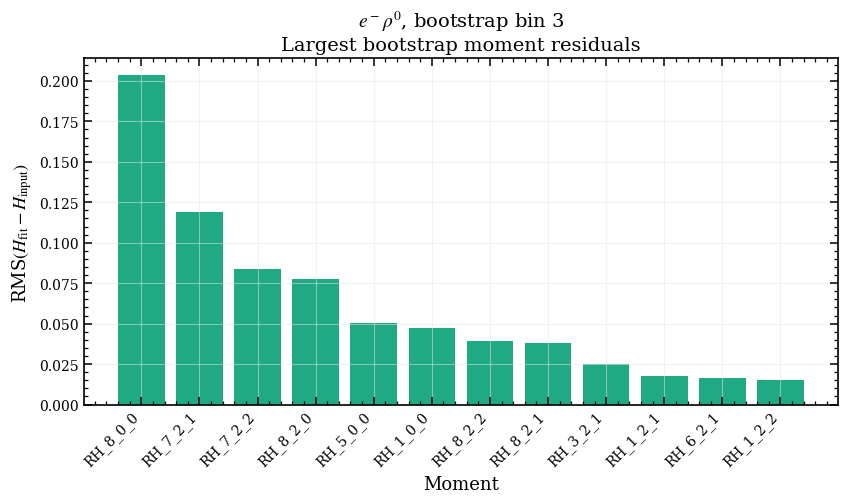

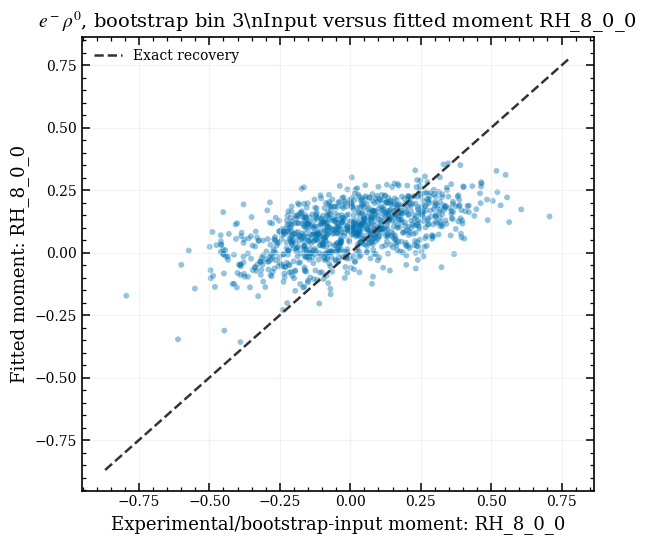

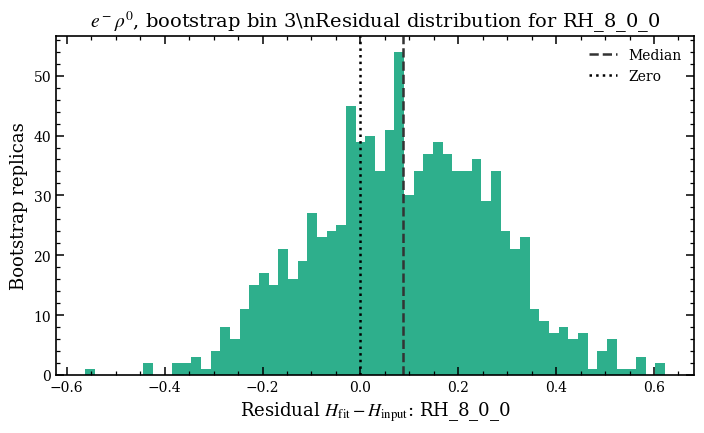

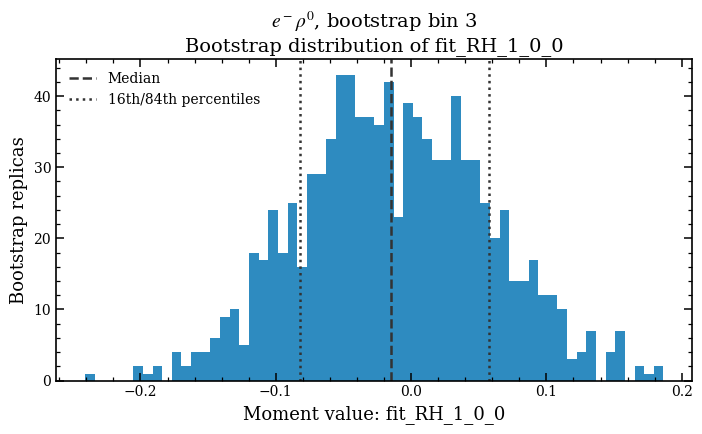

...

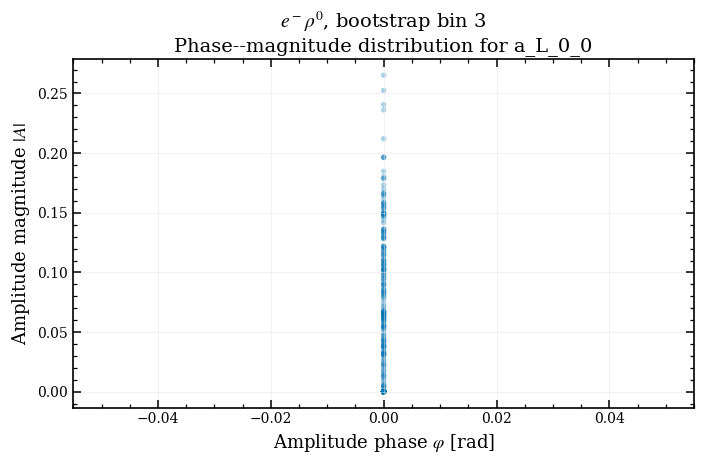

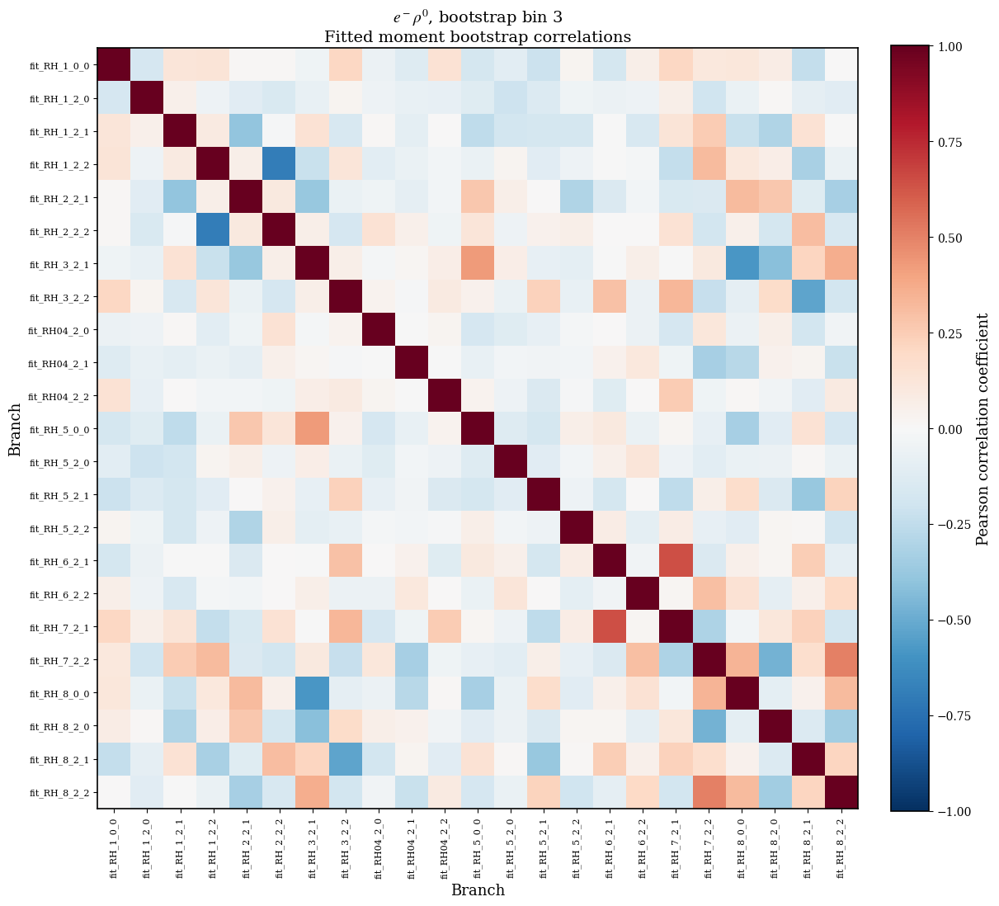

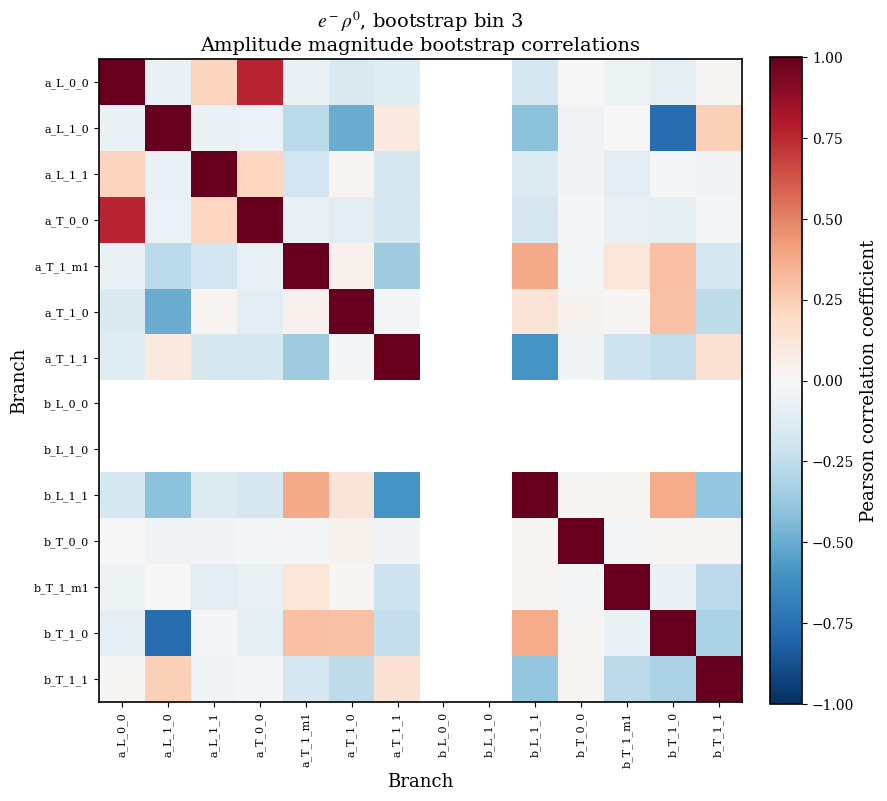

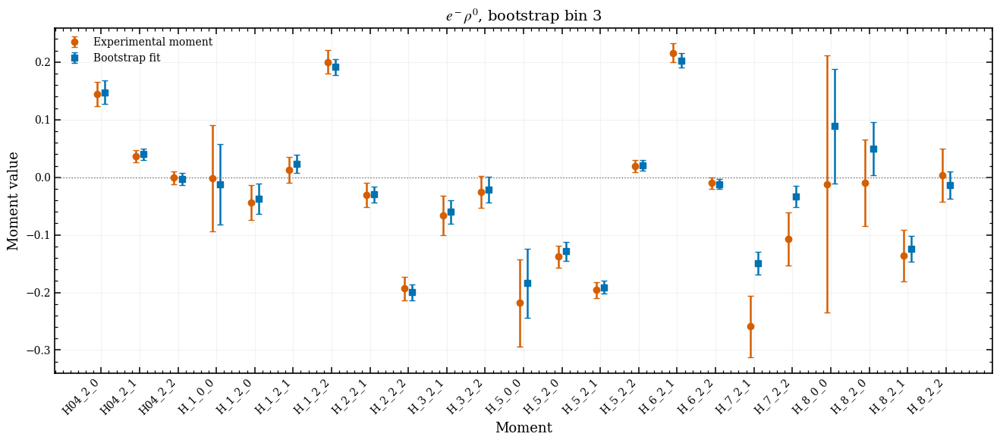

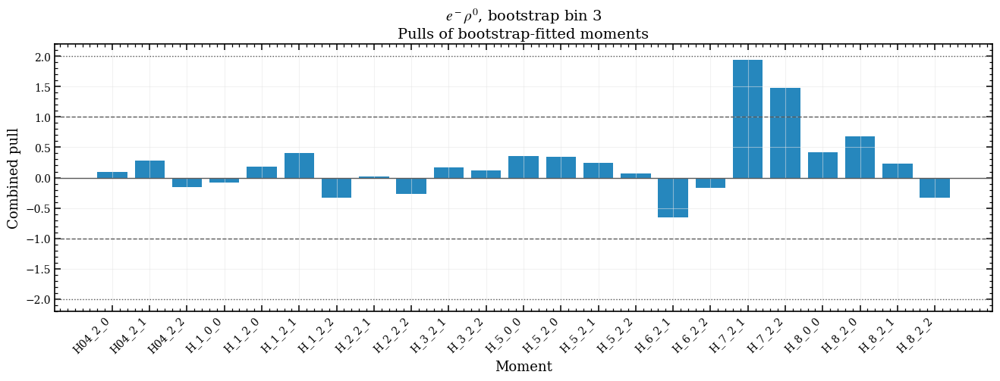


$\mu^-$$\omega$, bootstrap bin 0
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/MuOmega_bootstrap_0.root
Selected 957 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


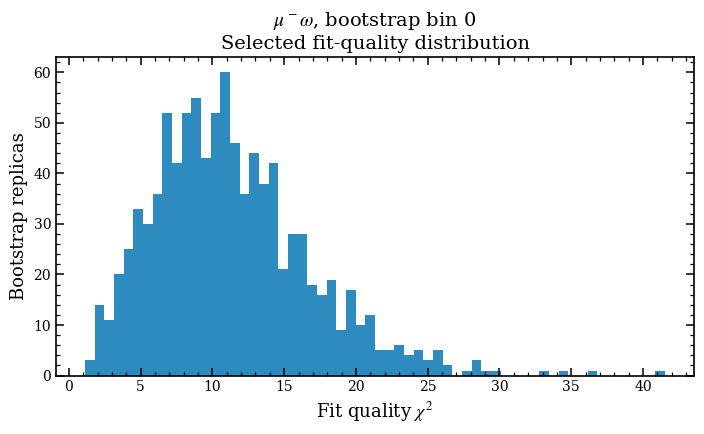

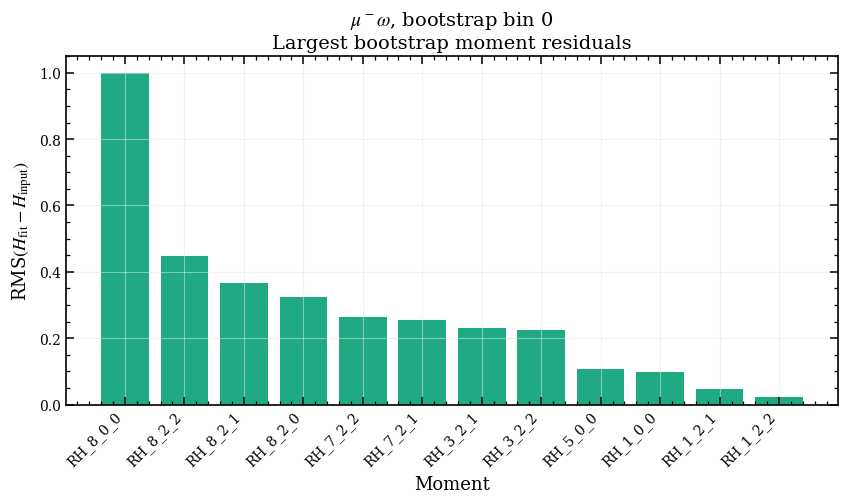

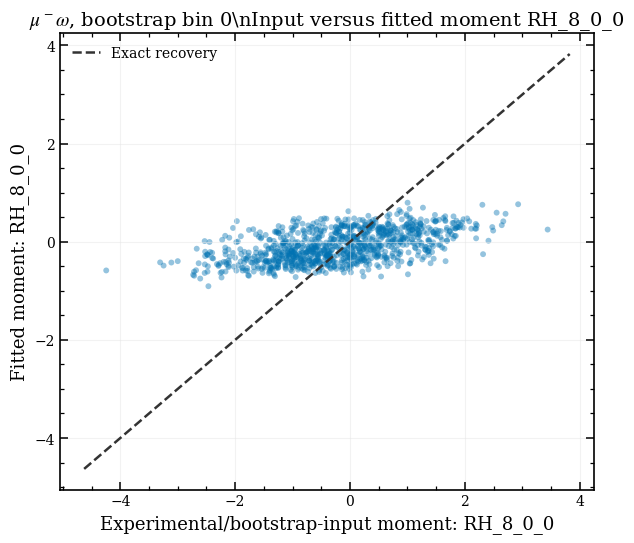

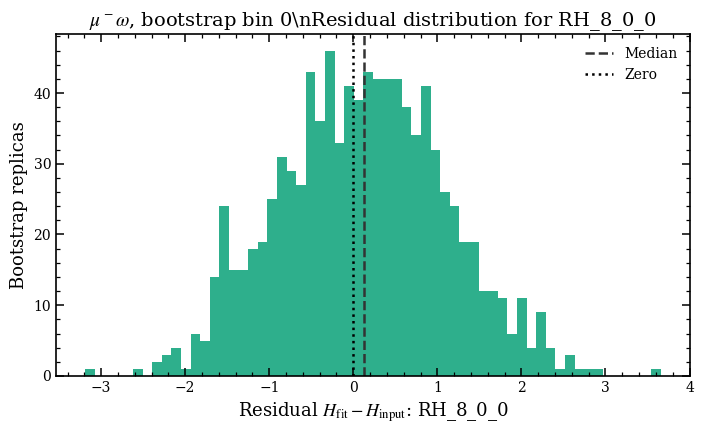

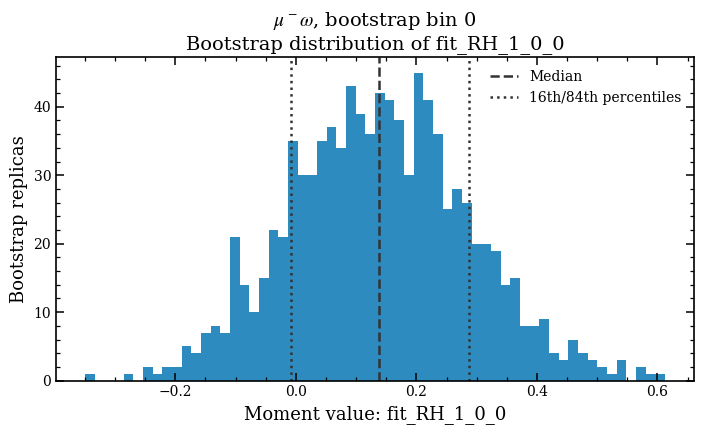

...

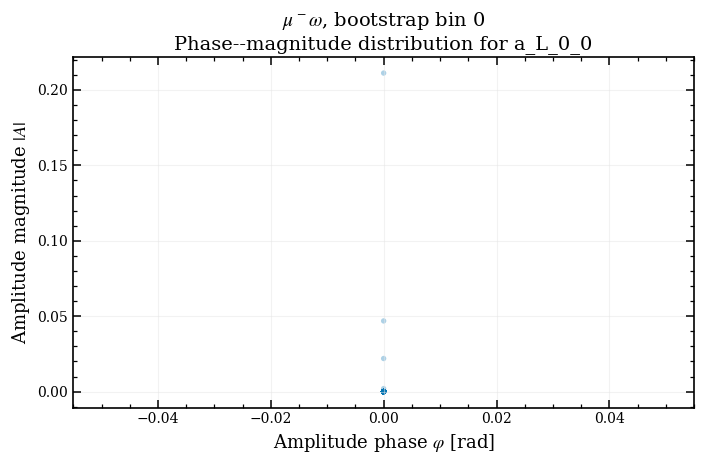

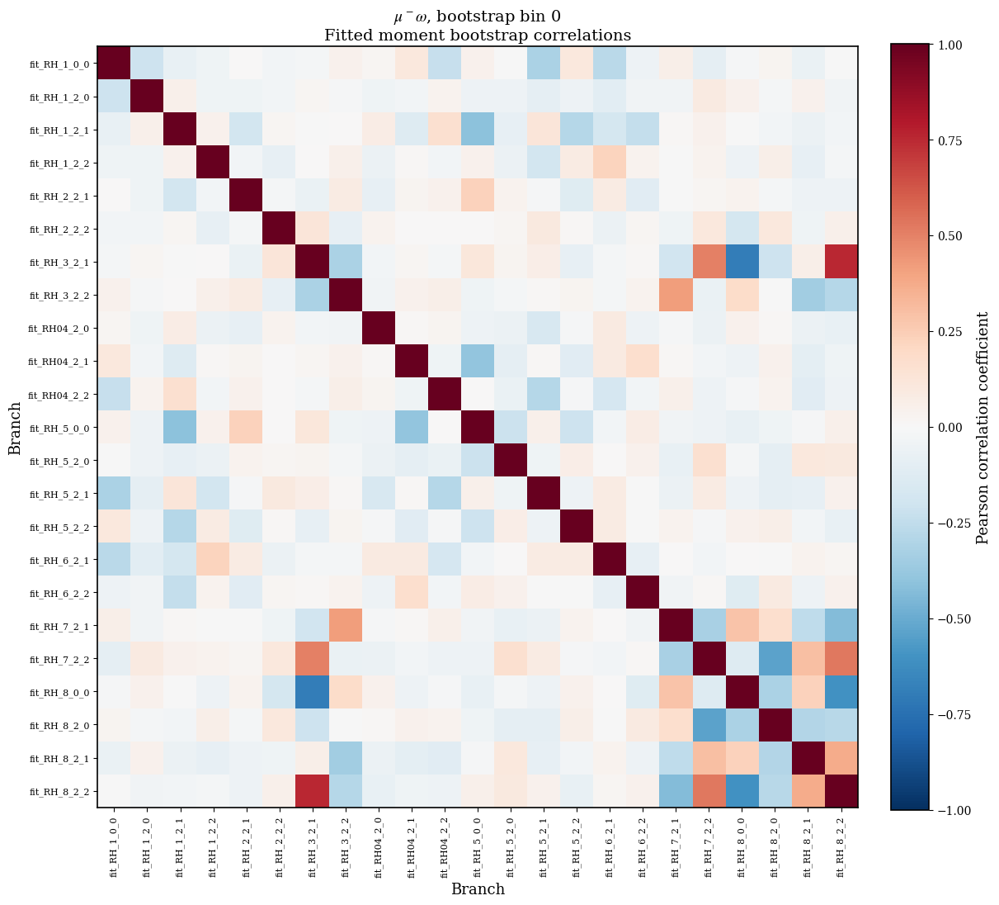

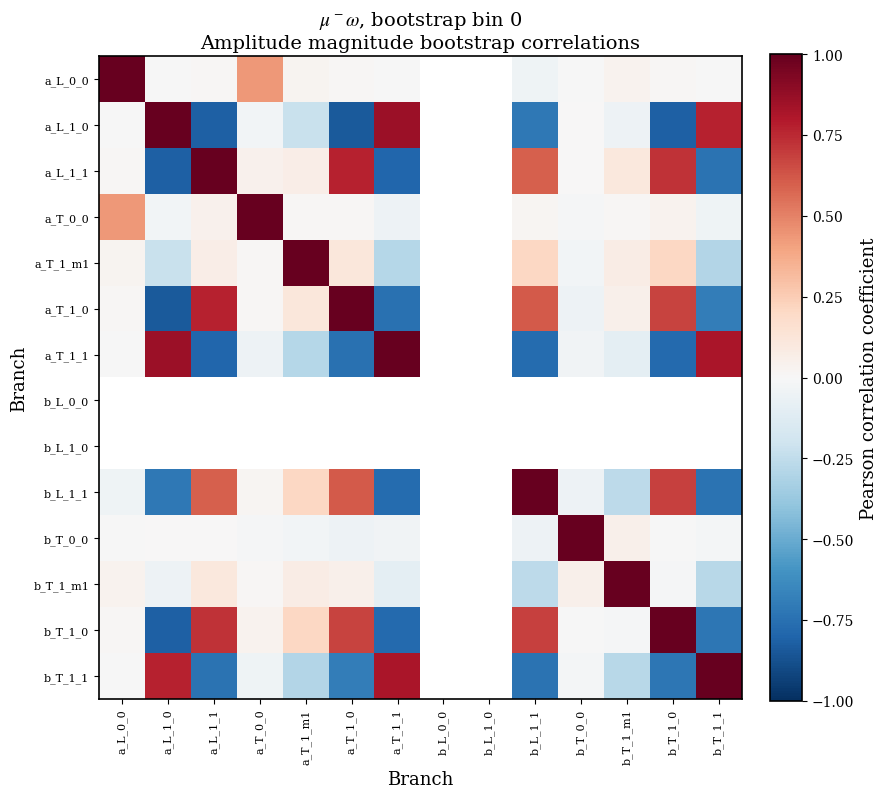

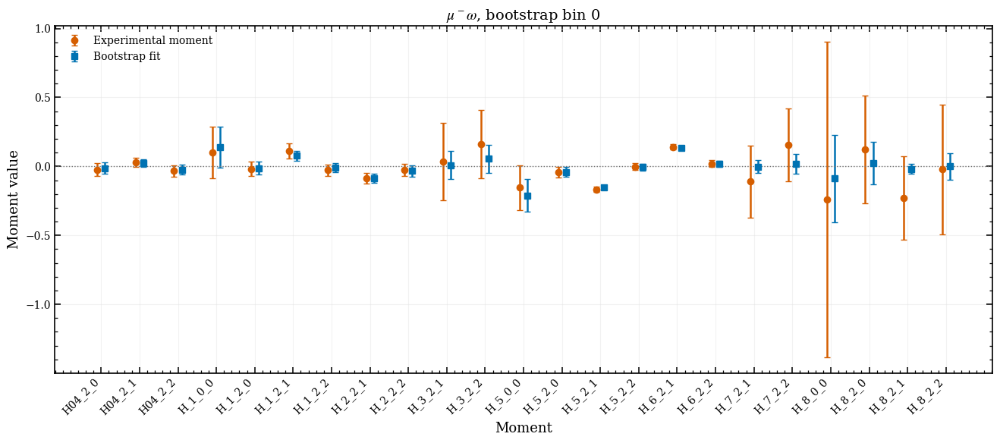

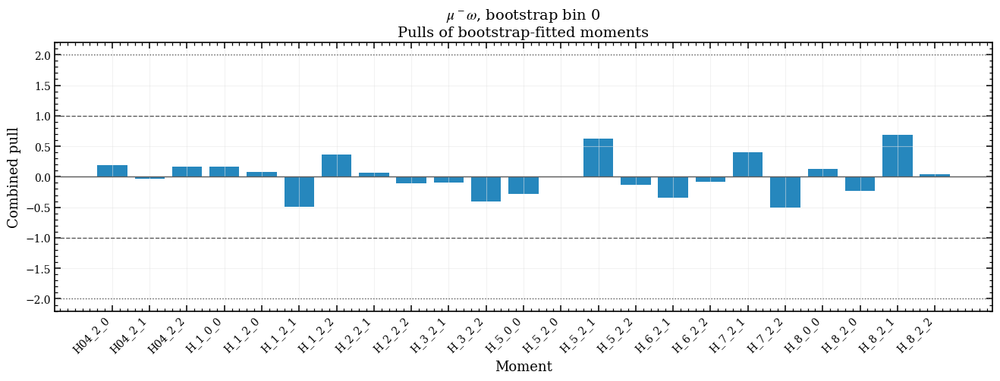


$\mu^-$$\omega$, bootstrap bin 1
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/MuOmega_bootstrap_1.root
Selected 959 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


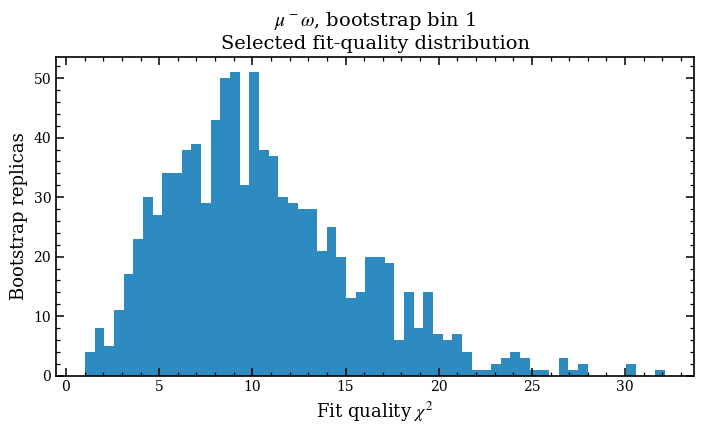

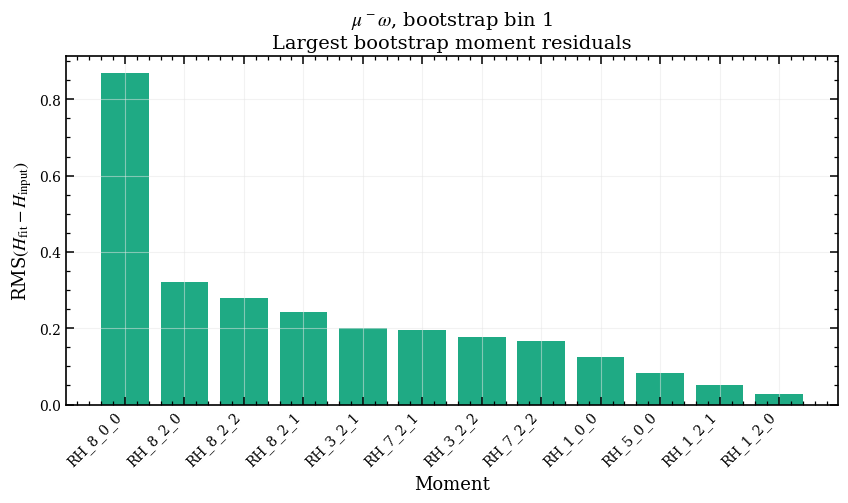

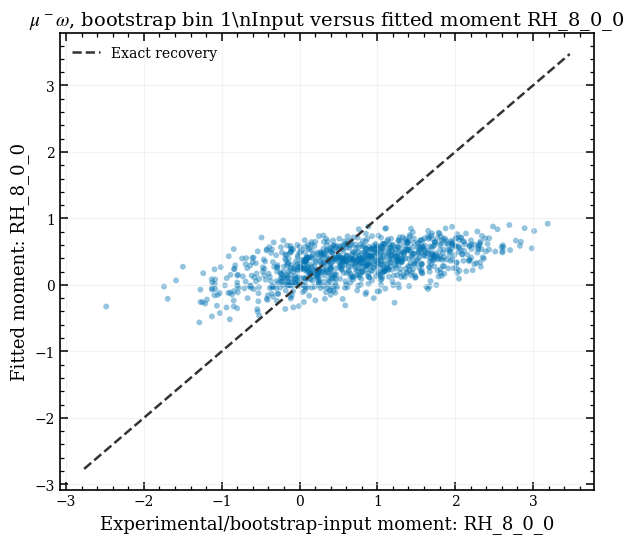

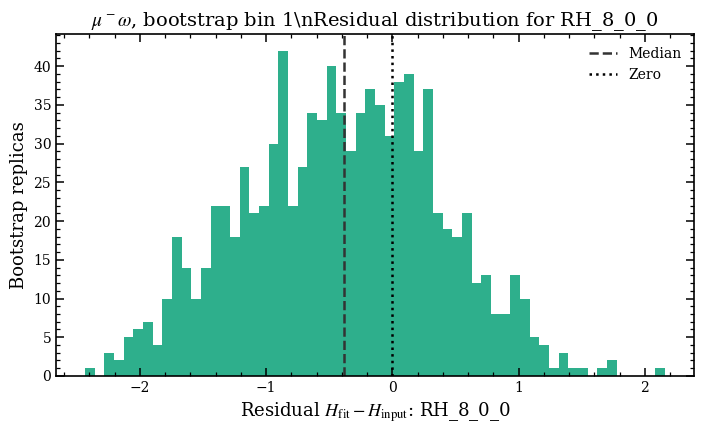

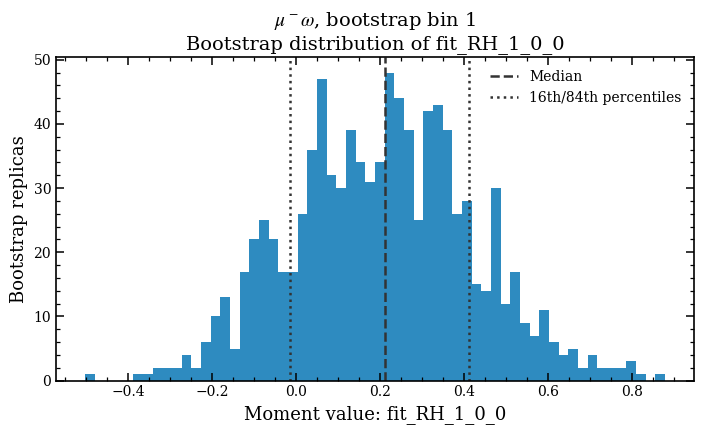

...

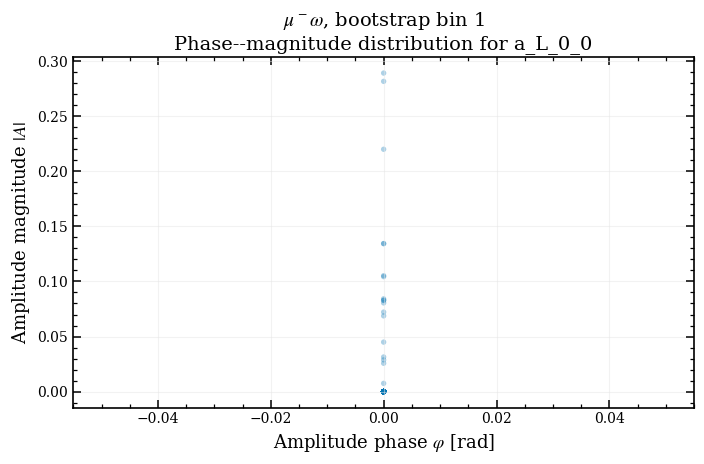

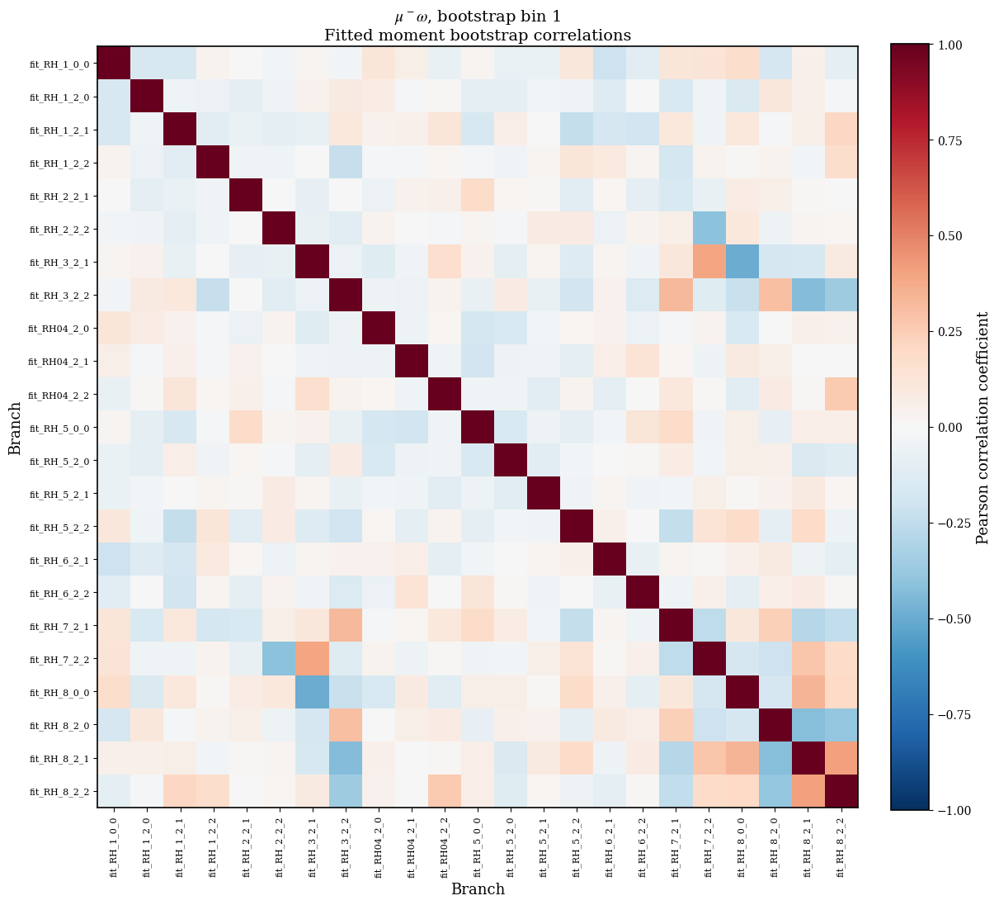

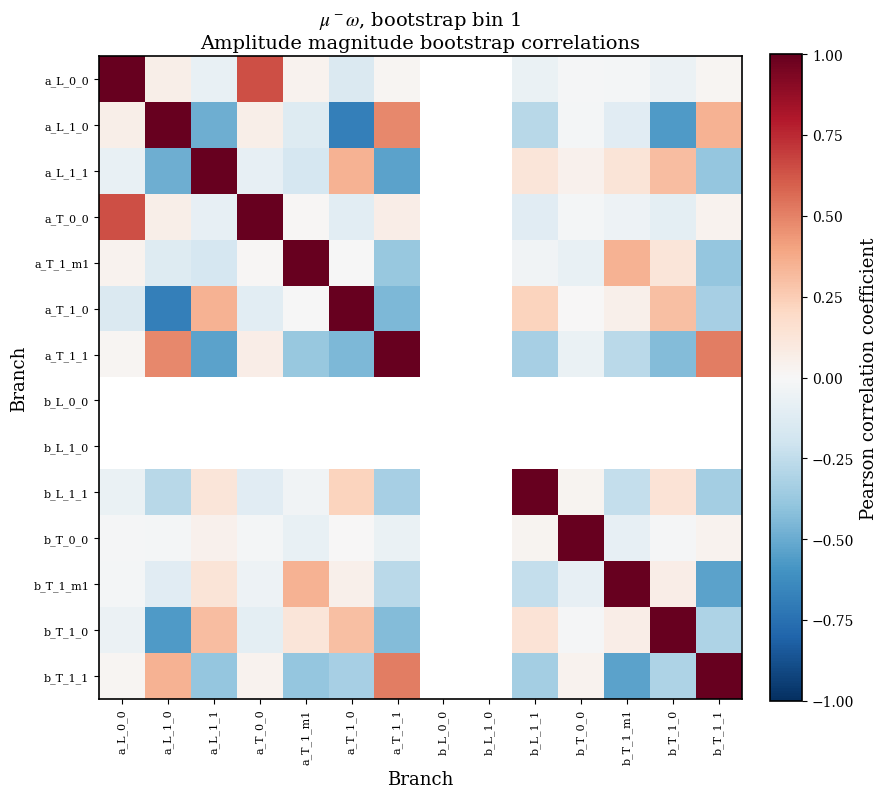

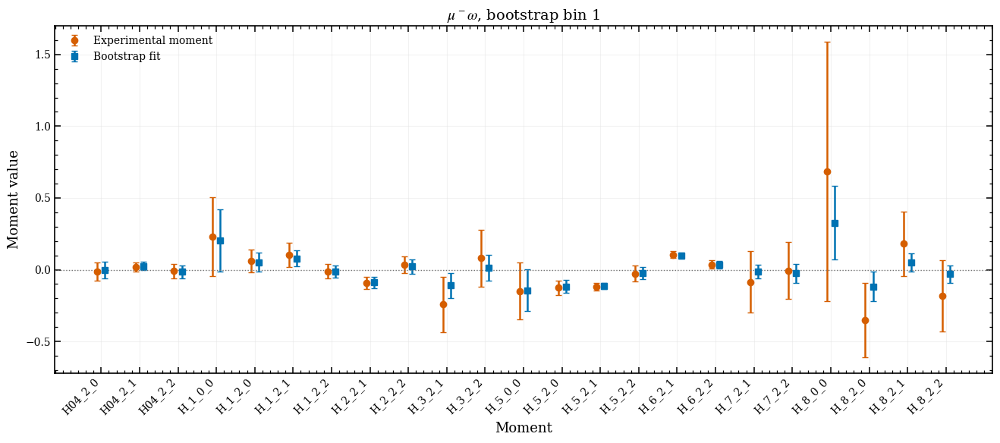

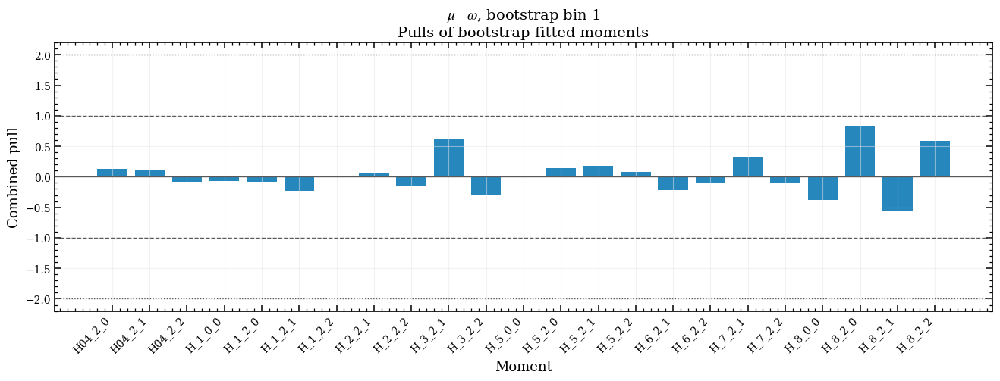


$\mu^-$$\omega$, bootstrap bin 2
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/MuOmega_bootstrap_2.root
Selected 940 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


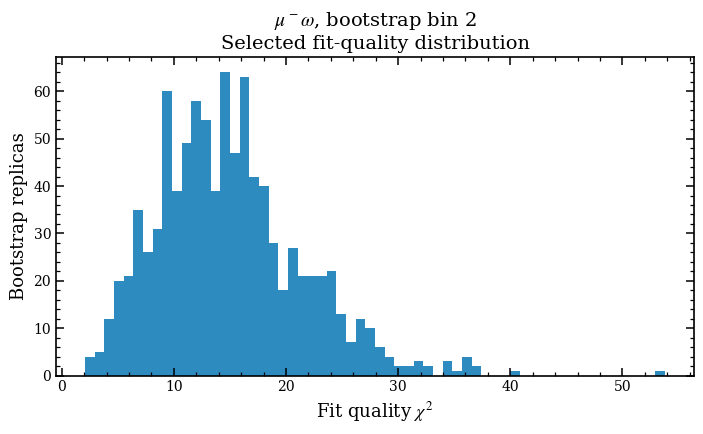

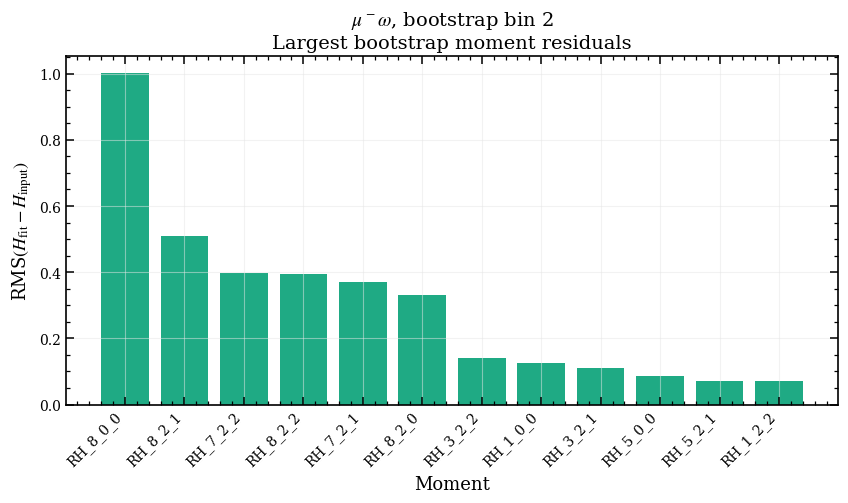

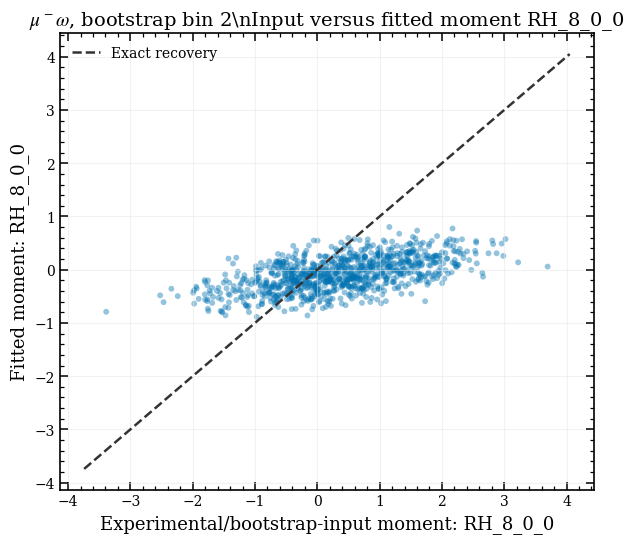

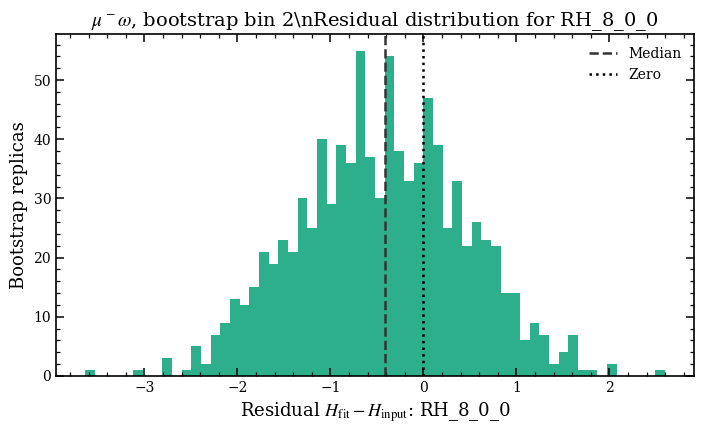

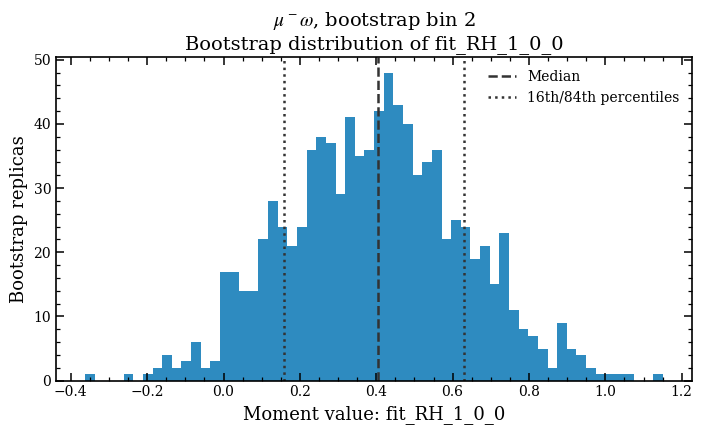

...

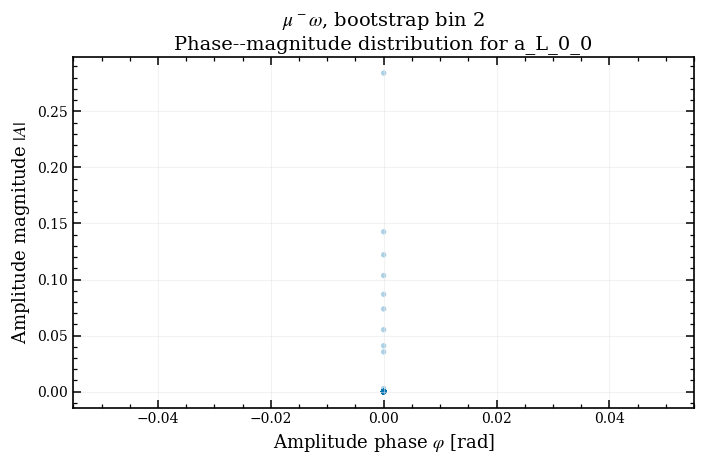

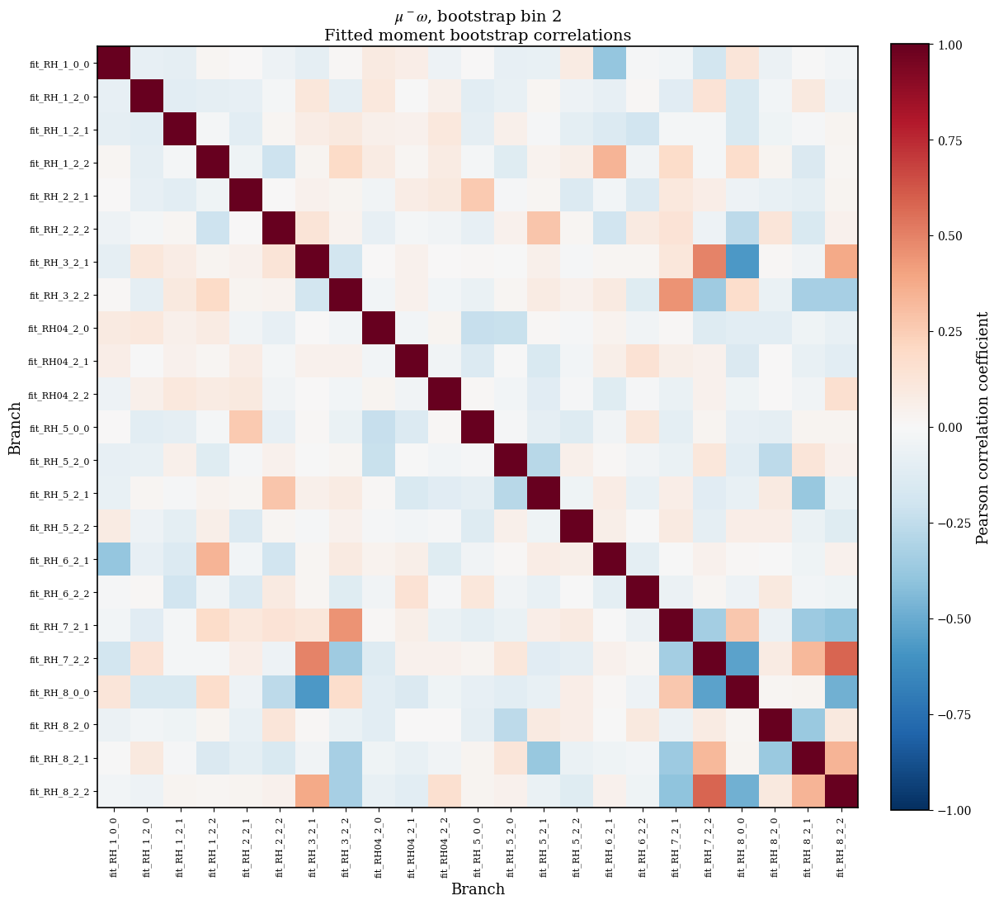

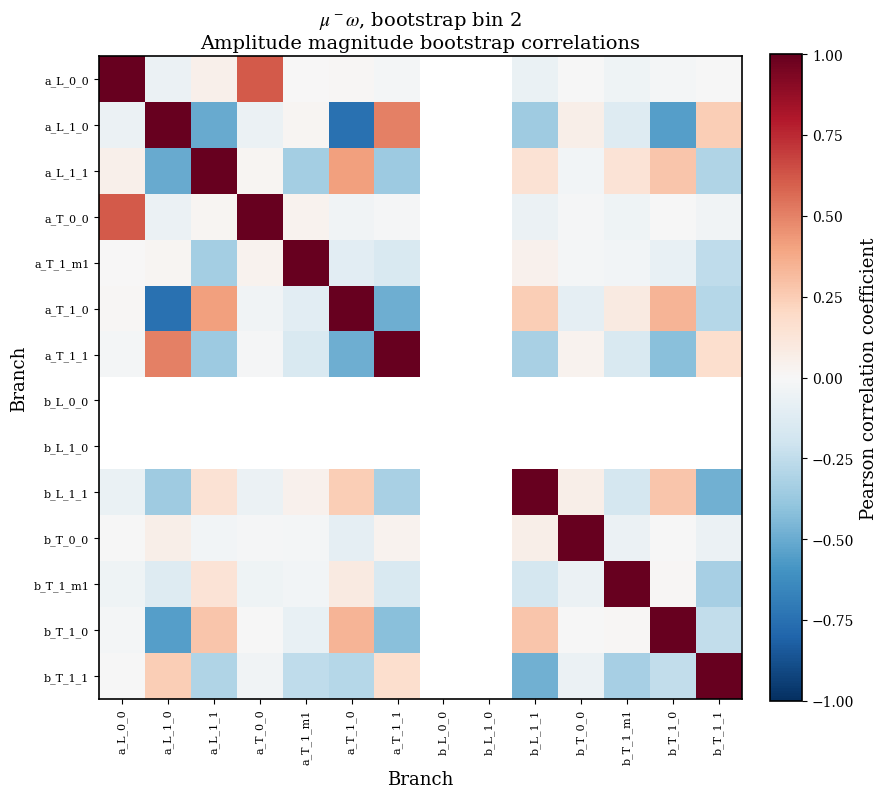

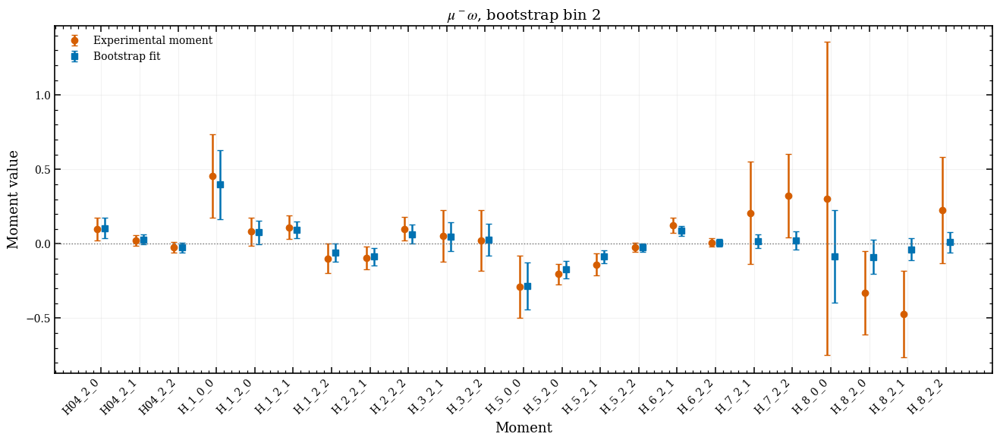

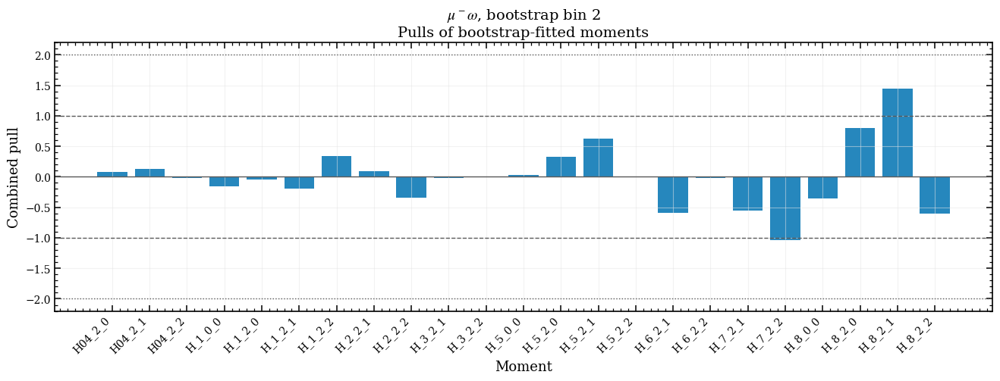


$\mu^-$$\rho^0$, bootstrap bin 0
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/MuRho_bootstrap_0.root
Selected 876 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


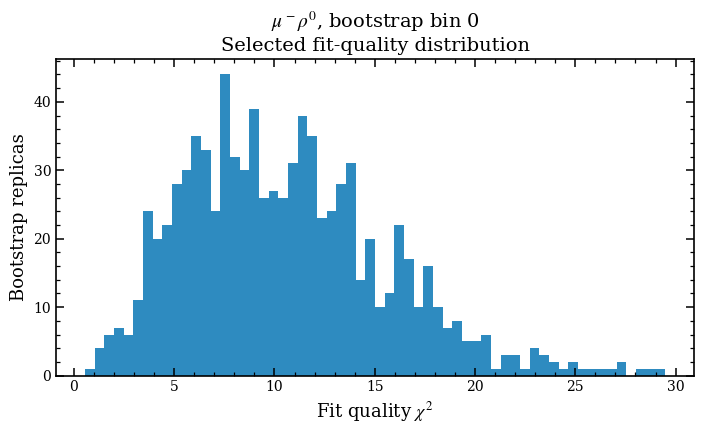

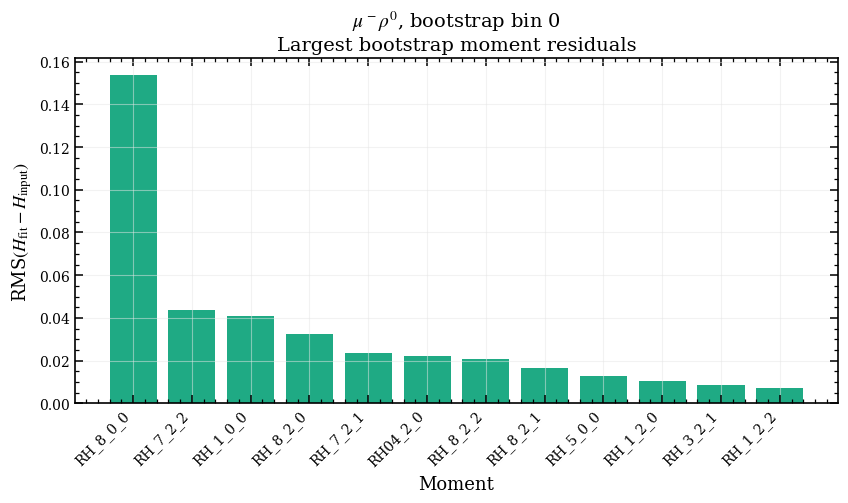

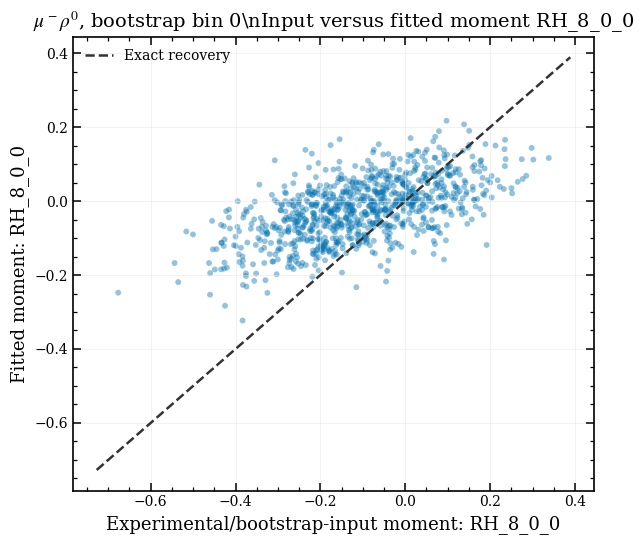

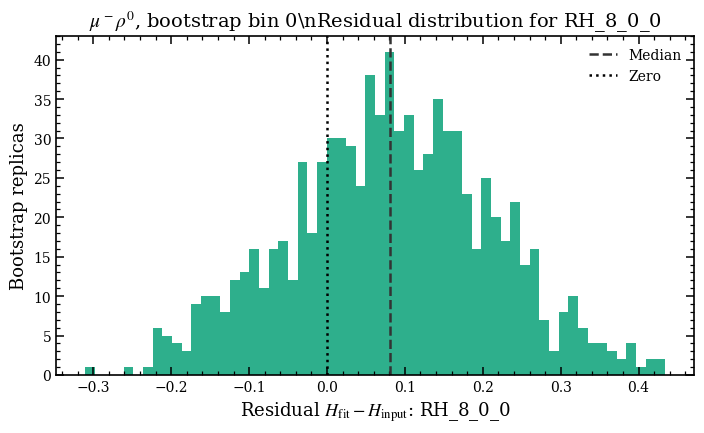

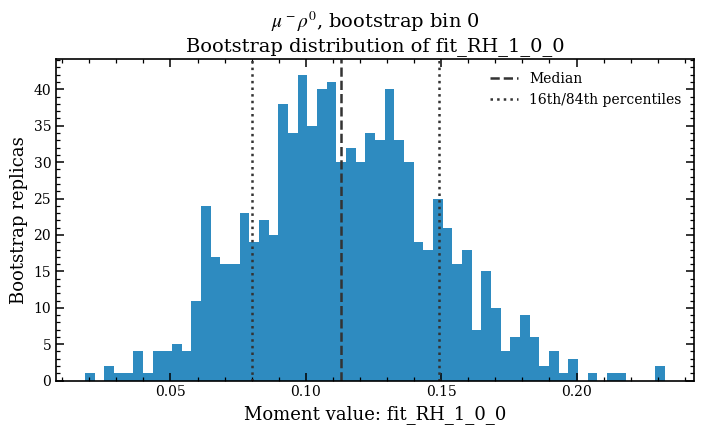

...

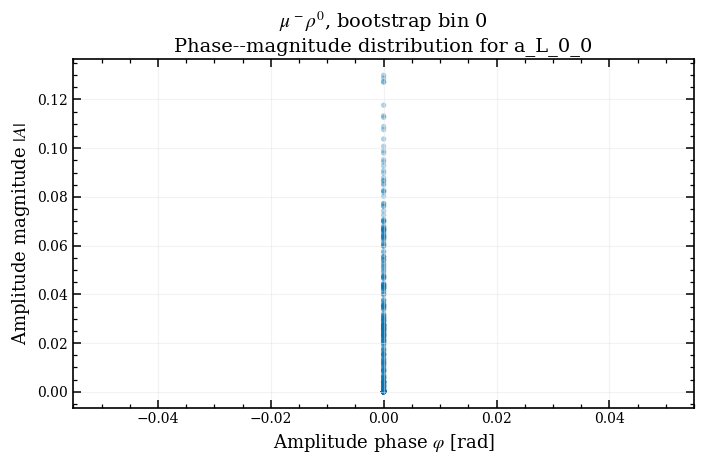

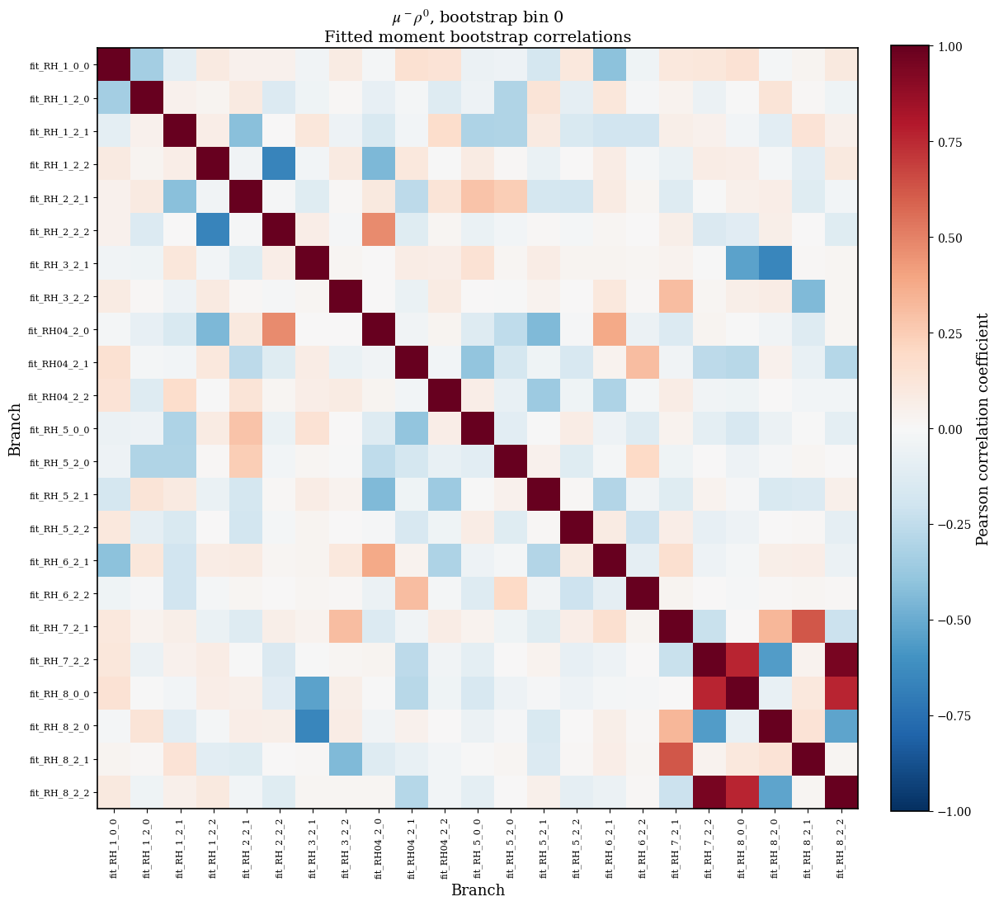

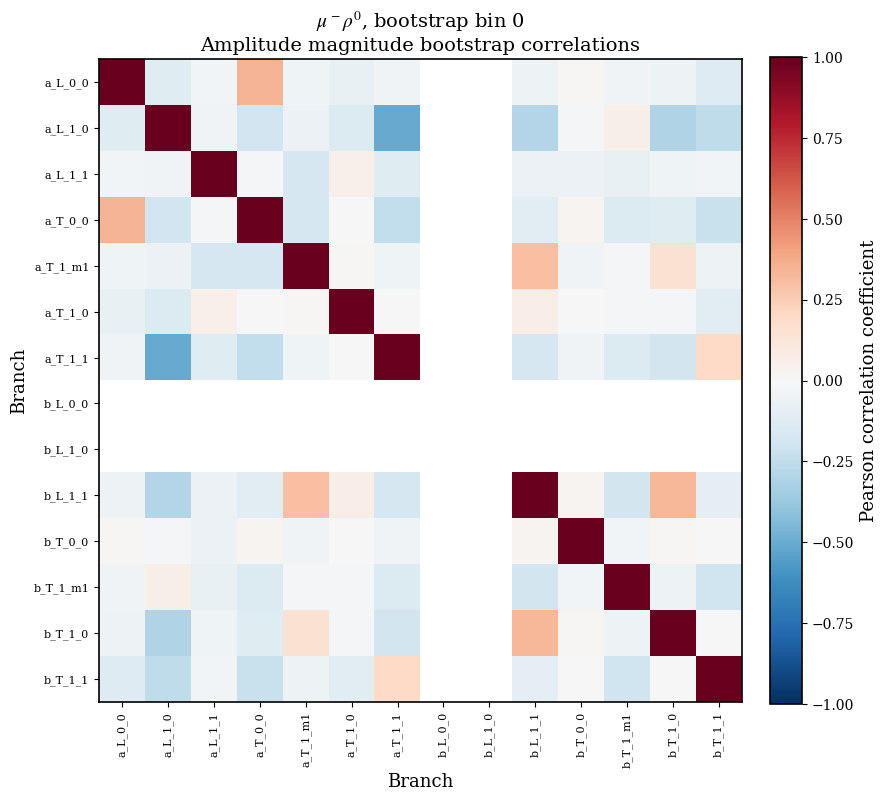

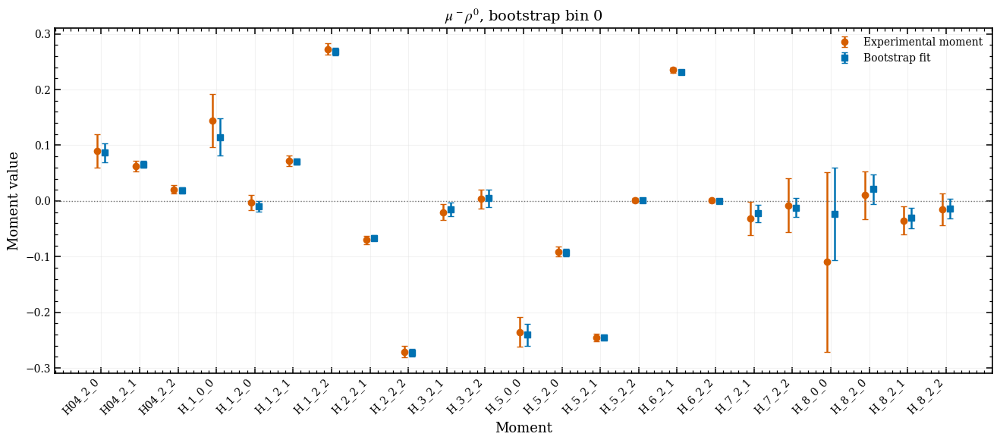

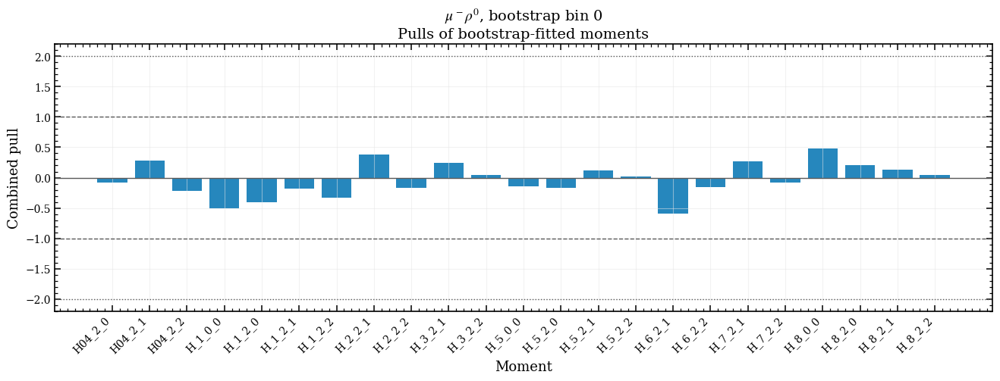


$\mu^-$$\rho^0$, bootstrap bin 1
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/MuRho_bootstrap_1.root
Selected 977 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


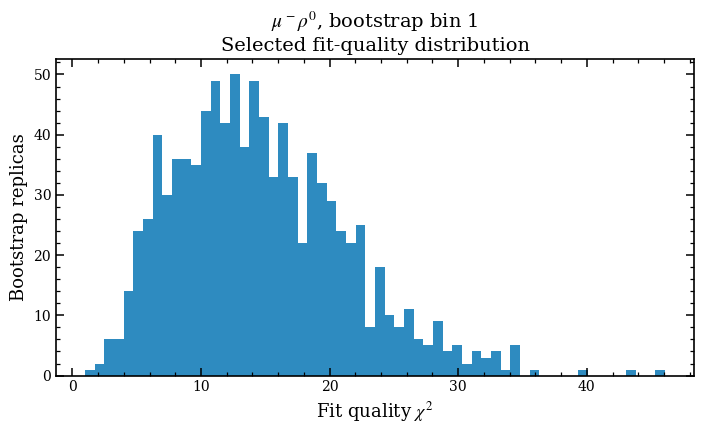

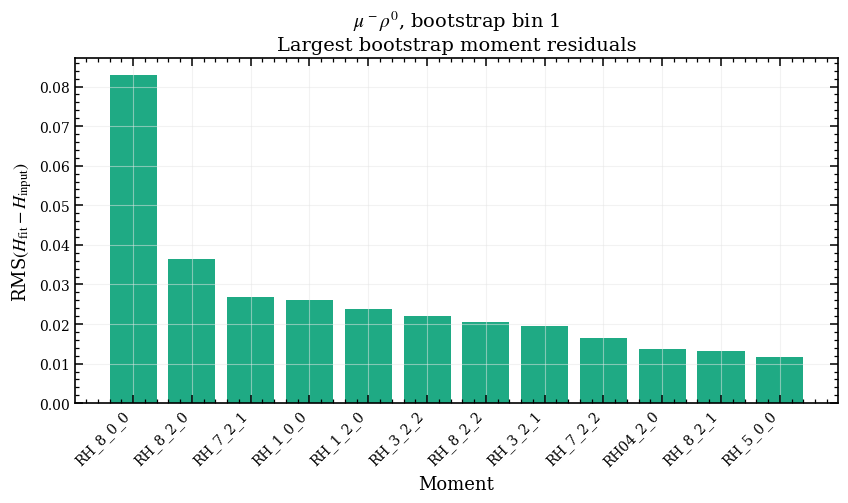

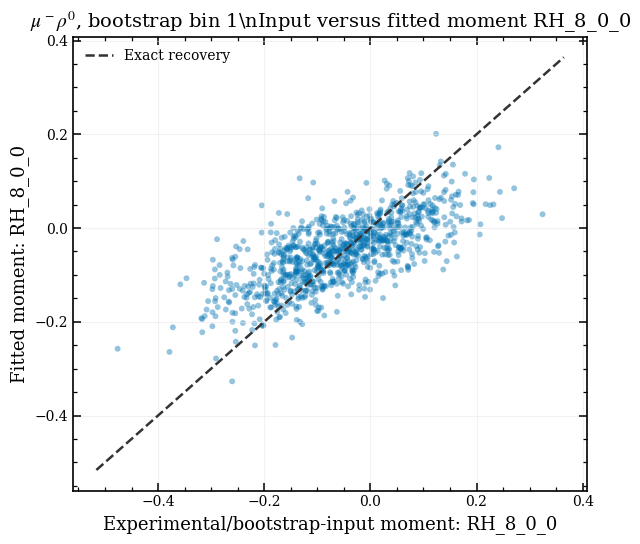

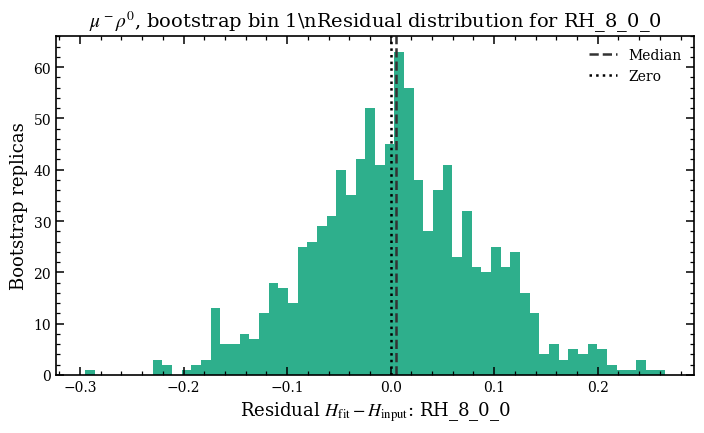

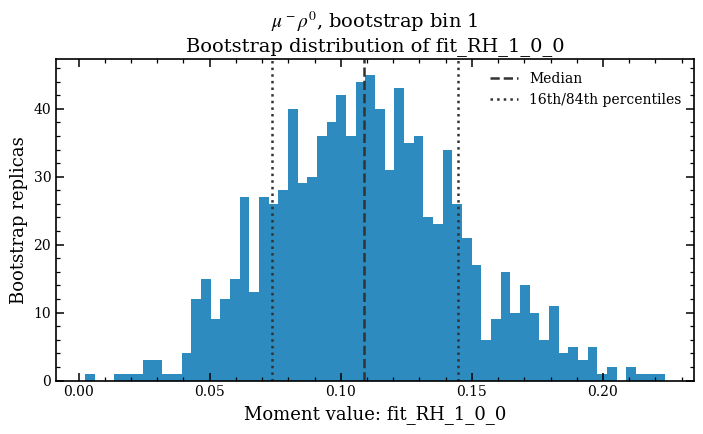

...

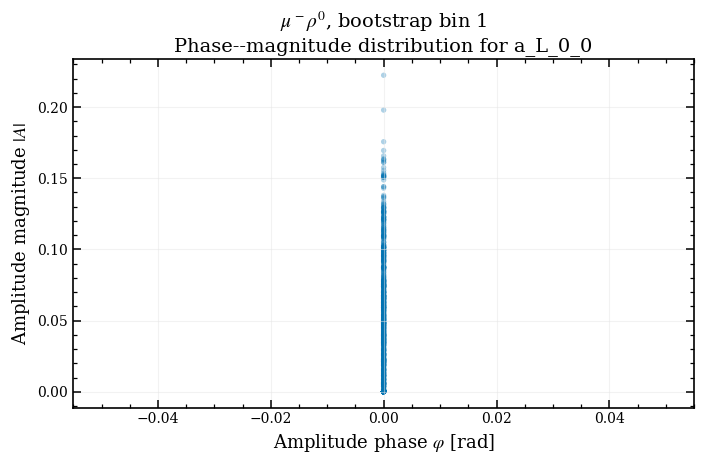

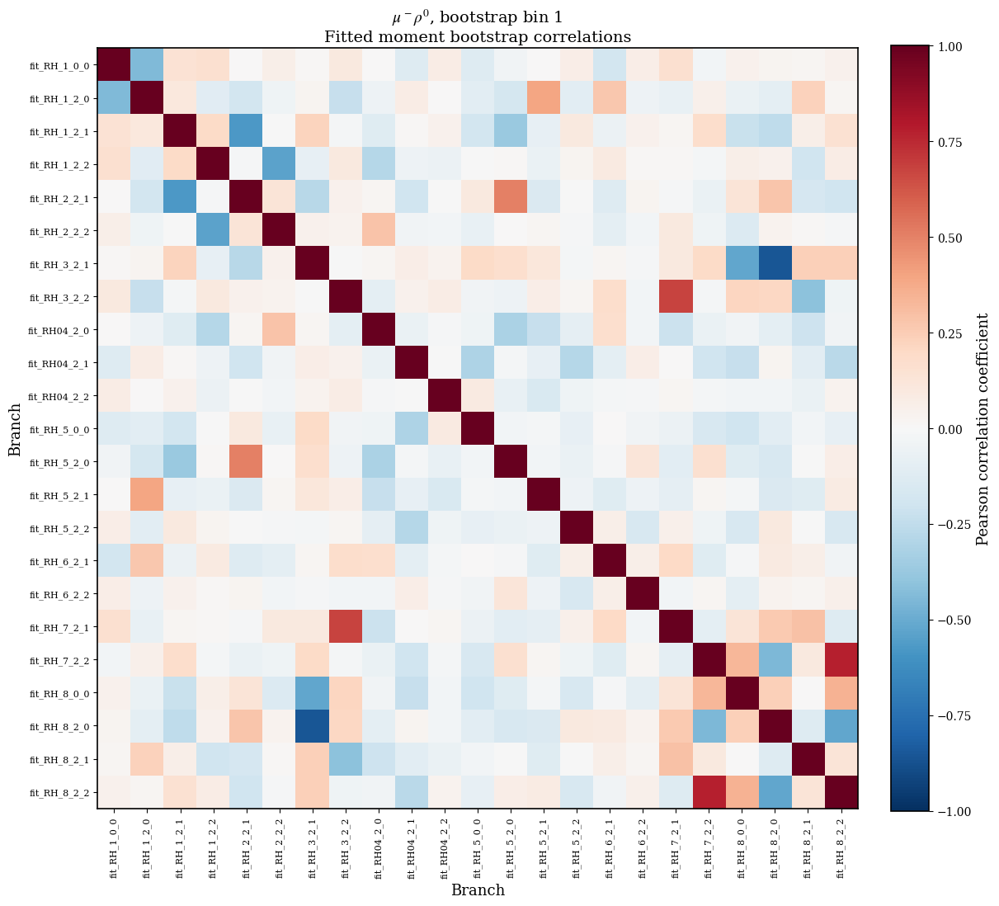

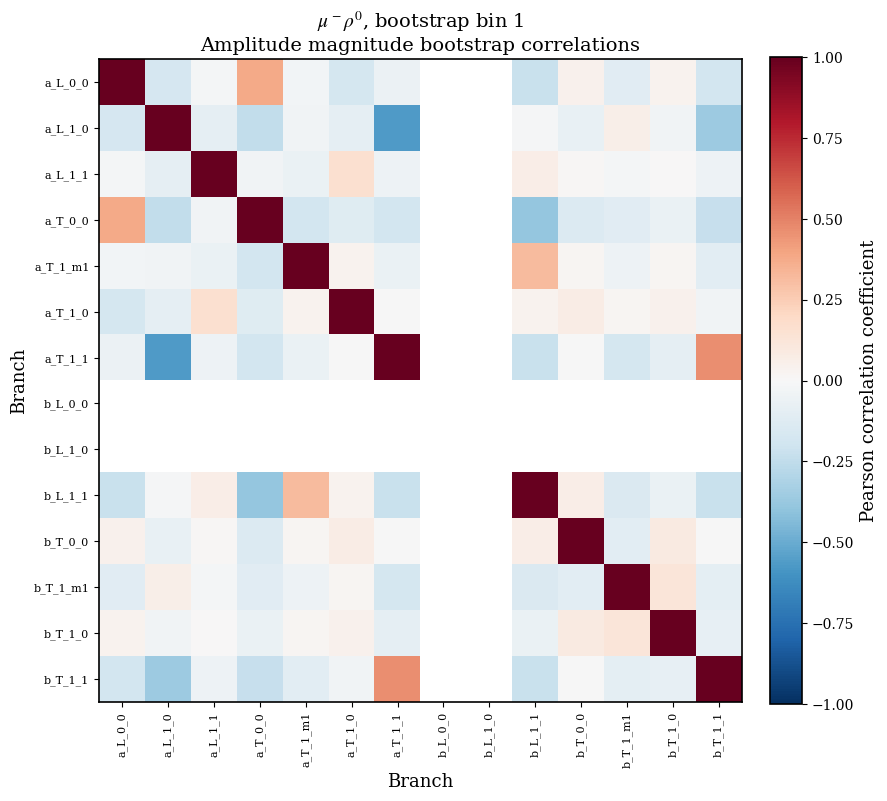

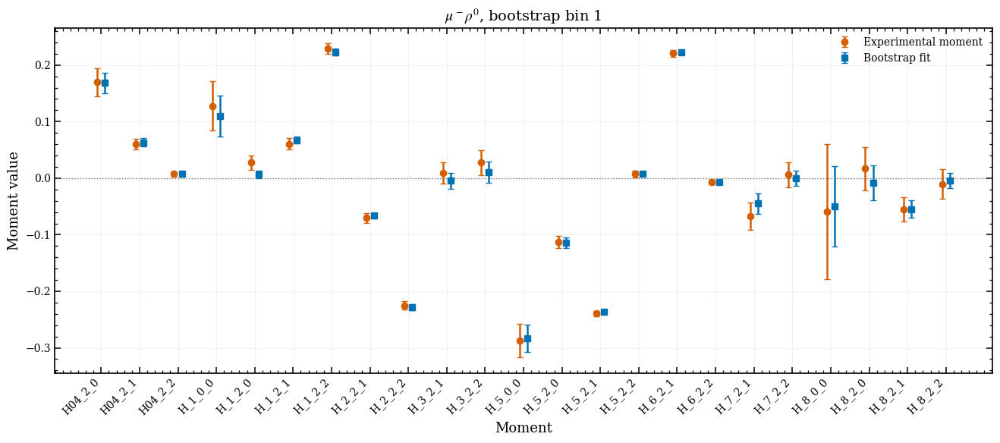

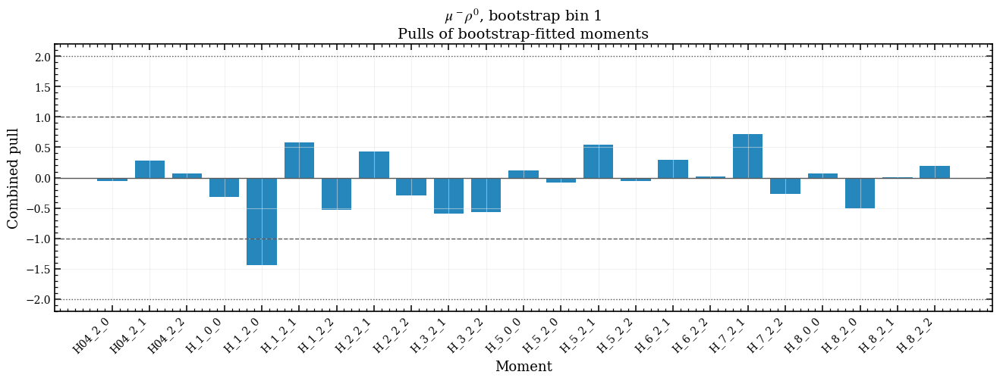


$\mu^-$$\rho^0$, bootstrap bin 2
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/MuRho_bootstrap_2.root
Selected 899 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


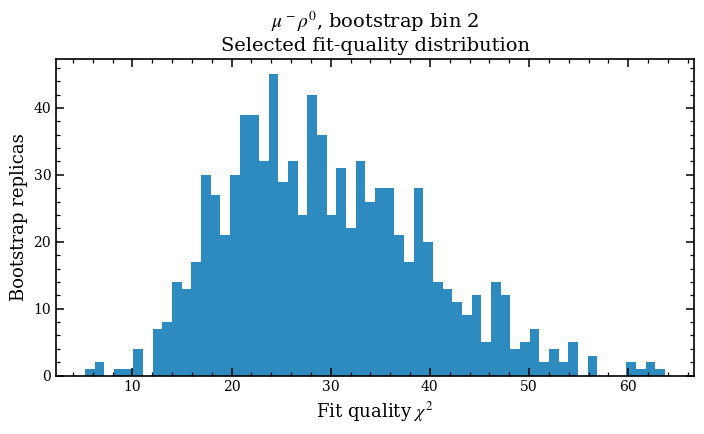

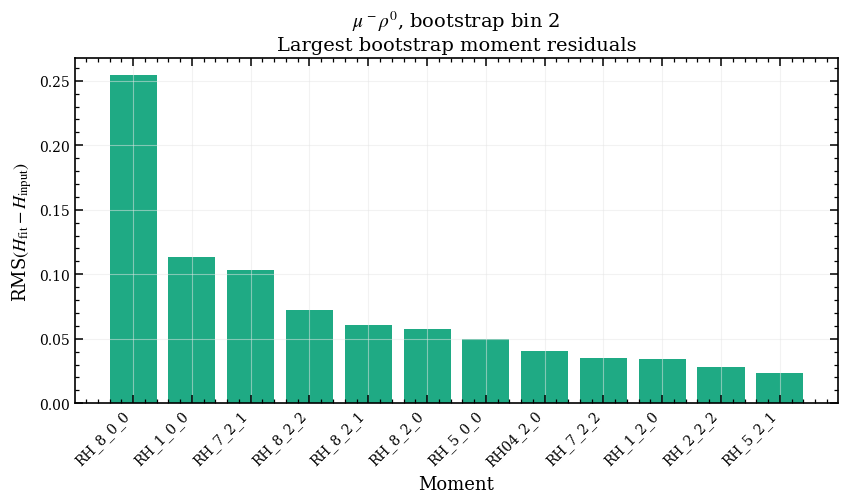

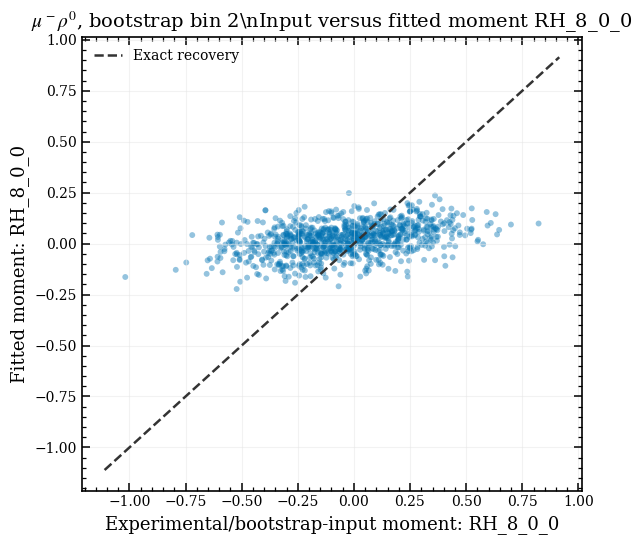

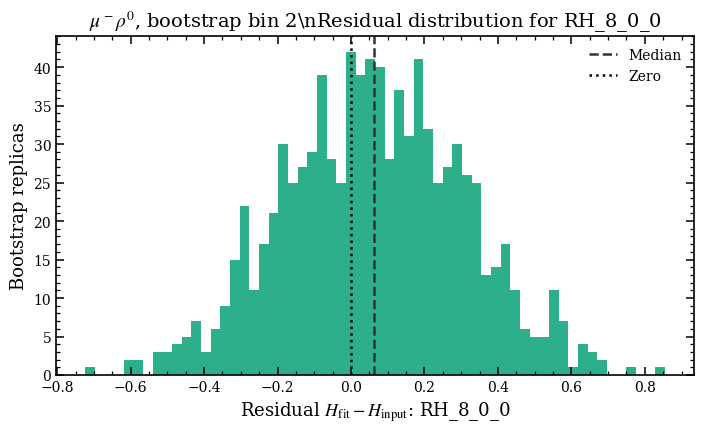

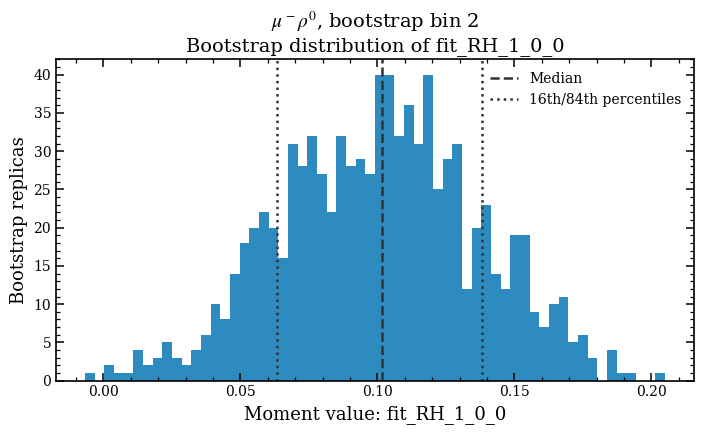

...

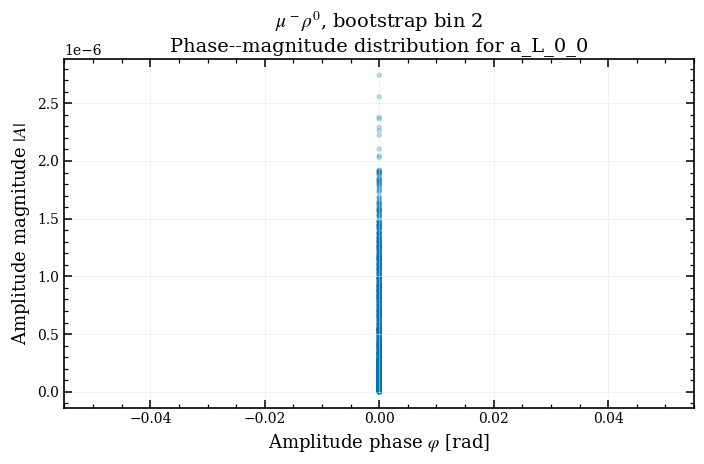

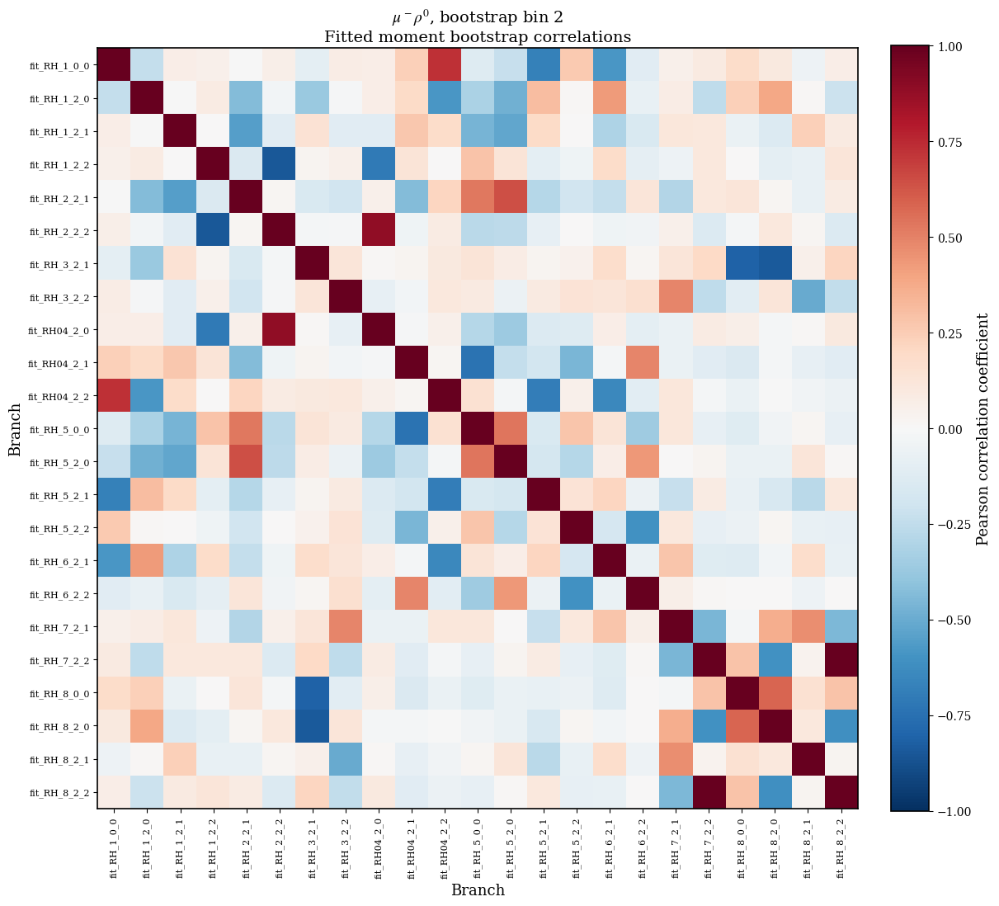

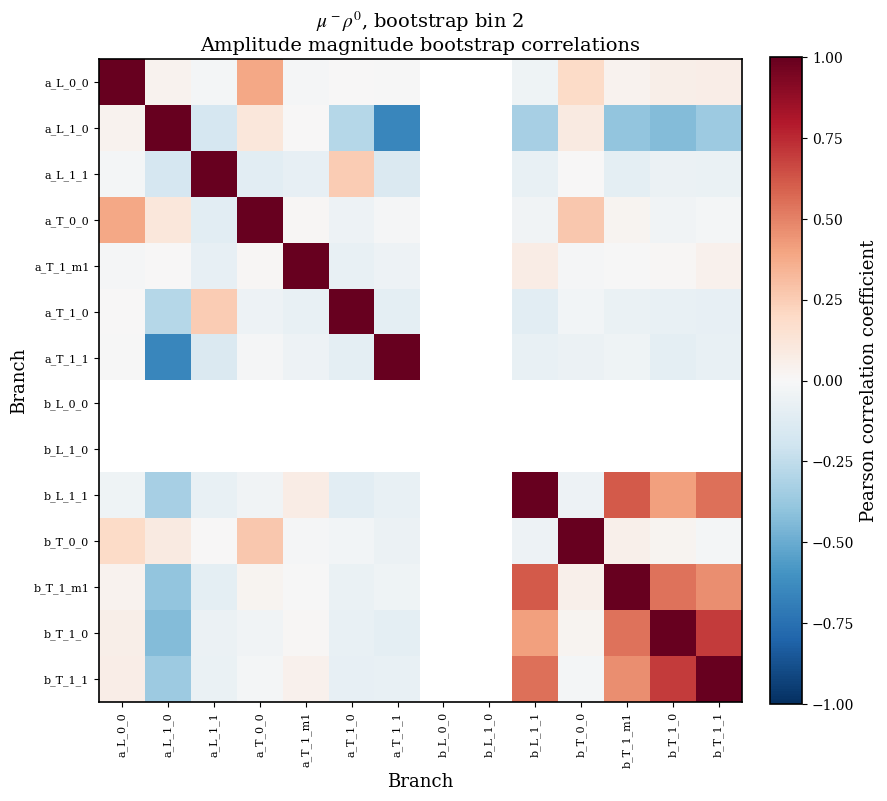

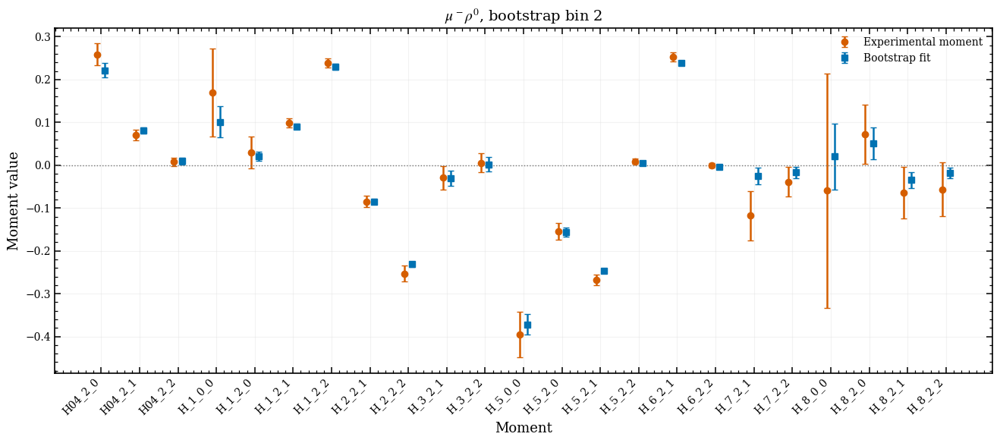

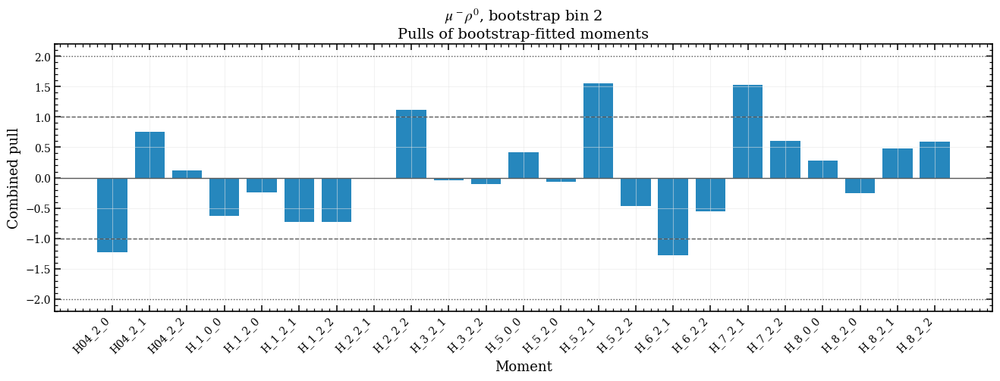


$\mu^-$$\rho^0$, bootstrap bin 3
/home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/OutputFiles/MuRho_bootstrap_3.root
Selected 970 / 1000 bootstrap replicas
{'quality': 6, 'throw': 23, 'fit_rh': 23, 'h': 28, 'amp_mag': 14, 'amp_phase': 14}


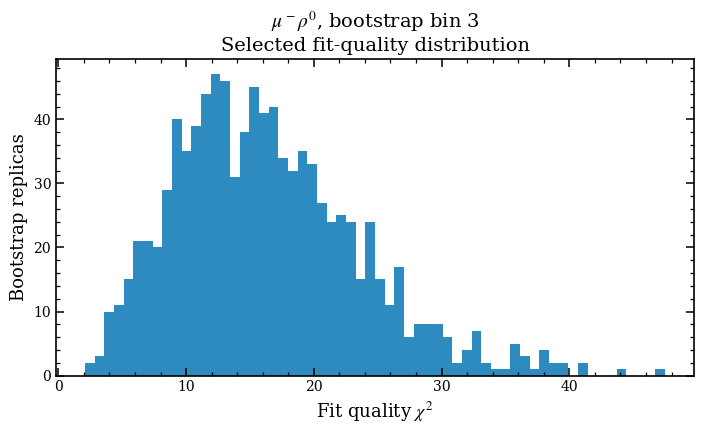

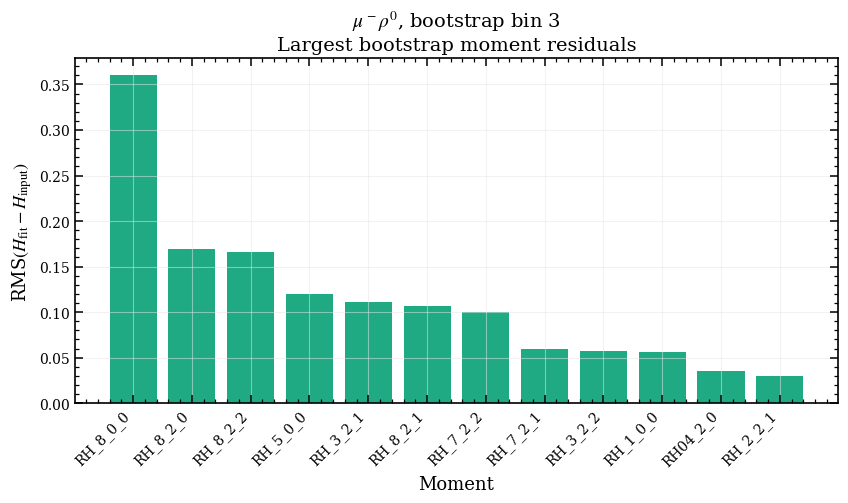

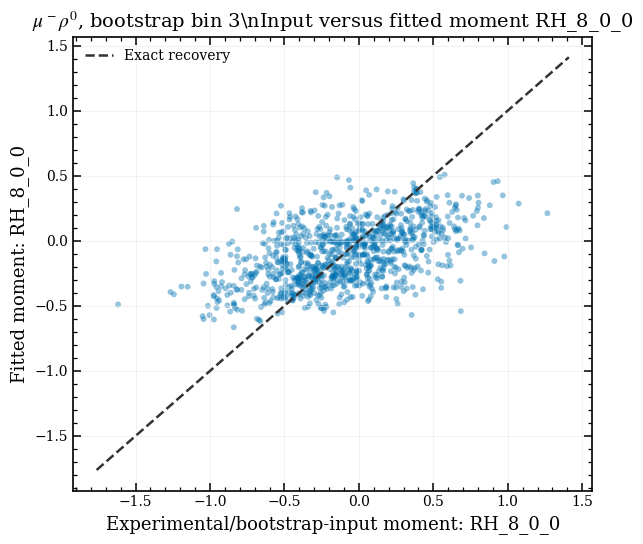

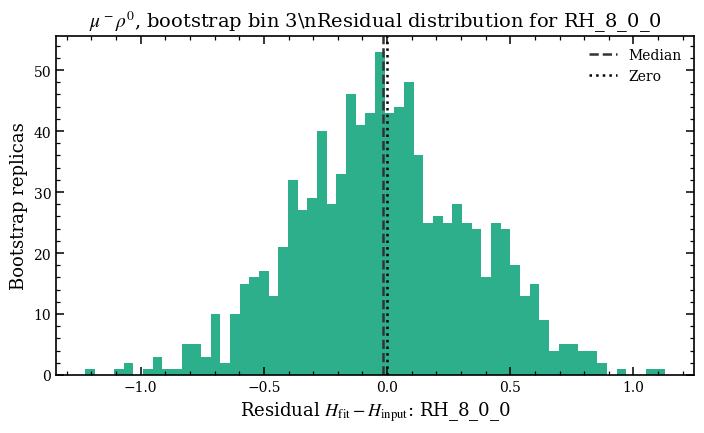

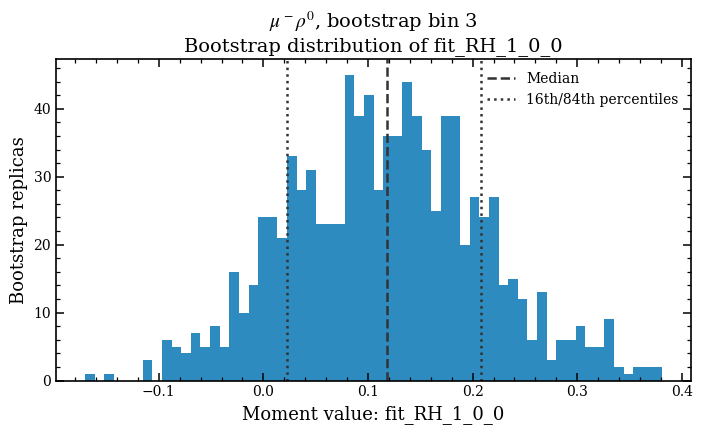

...

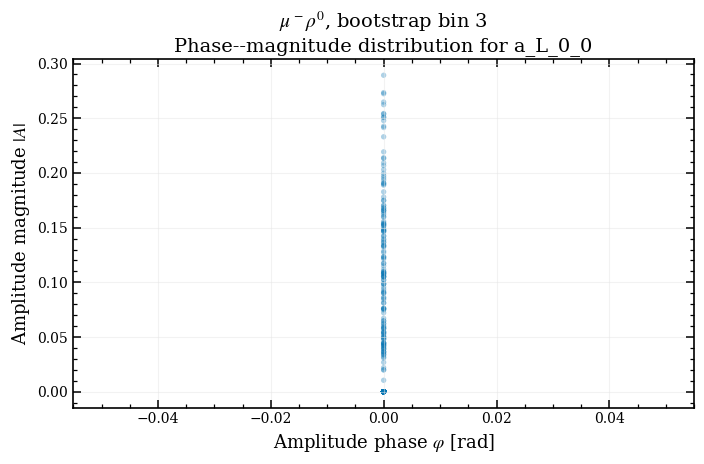

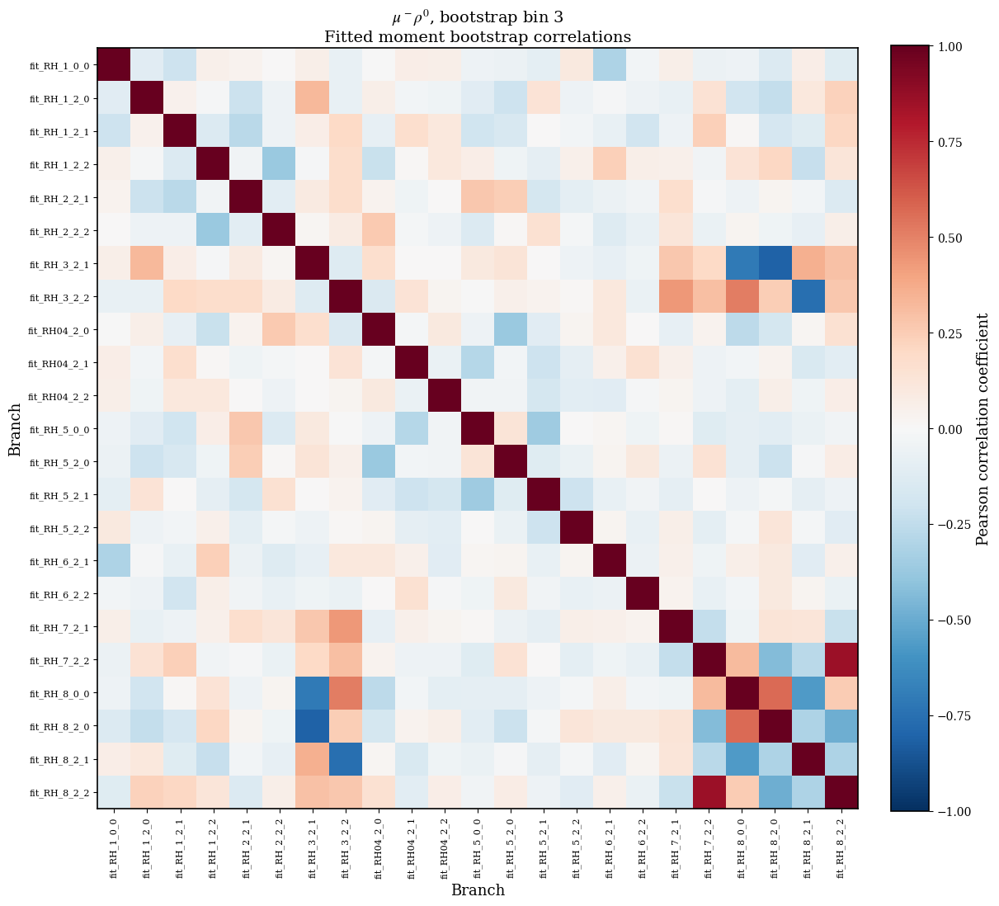

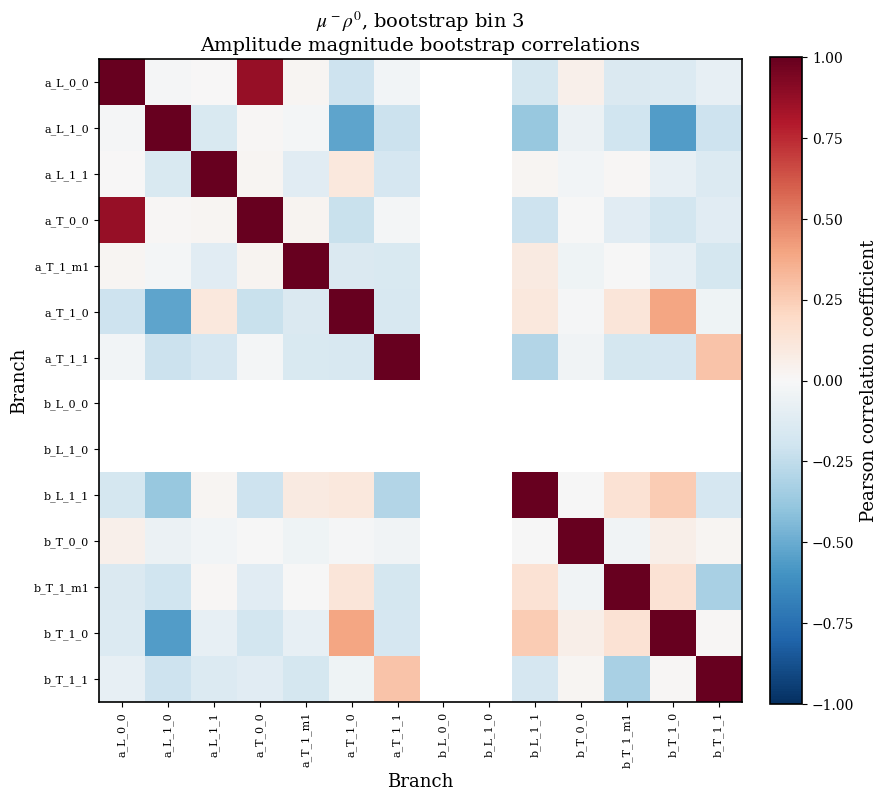

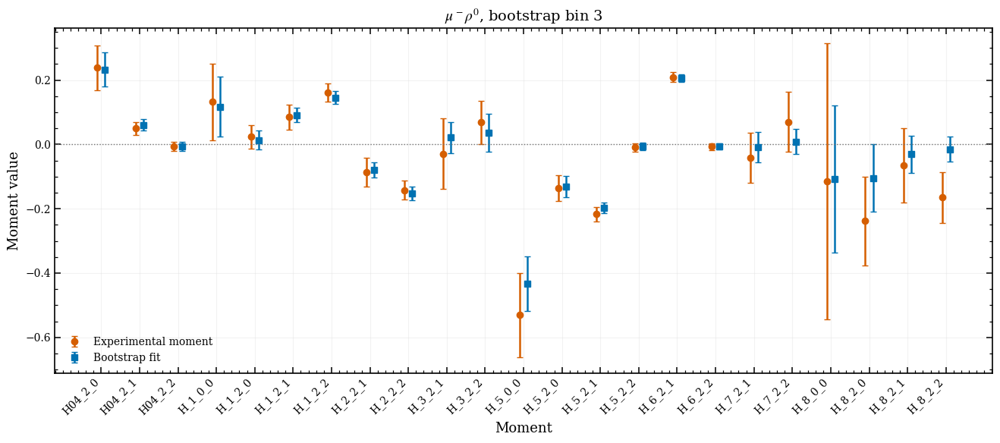

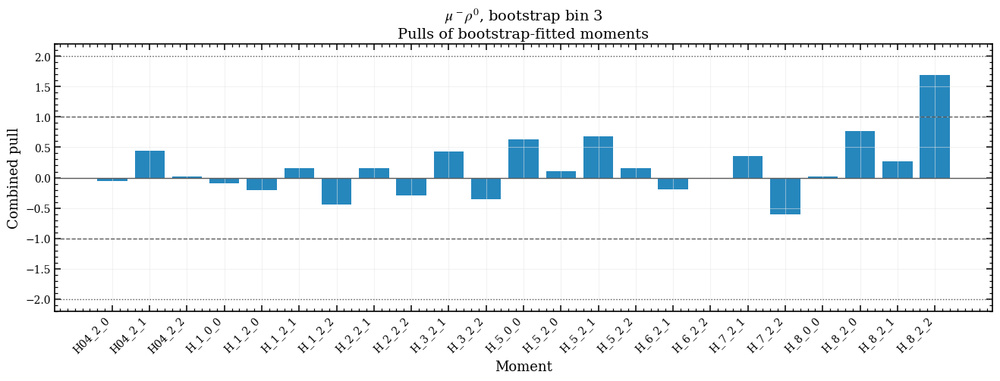

,dataset,file,replicas_total,replicas_selected,moment_pairs,amplitude_pairs,output_directory
0,ElOmega_bootstrap_0,/home/dleahy27/Desktop/PhD/Electroproduction/E...,1000,903,23,14,/home/dleahy27/Desktop/PhD/Electroproduction/E...
1,ElOmega_bootstrap_1,/home/dleahy27/Desktop/PhD/Electroproduction/E...,1000,876,23,14,/home/dleahy27/Desktop/PhD/Electroproduction/E...
2,ElOmega_bootstrap_2,/home/dleahy27/Desktop/PhD/Electroproduction/E...,1000,847,23,14,/home/dleahy27/Desktop/PhD/Electroproduction/E...
3,ElPhi_bootstrap_0,/home/dleahy27/Desktop/PhD/Electroproduction/E...,1000,990,23,14,/home/dleahy27/Desktop/PhD/Electroproduction/E...
4,ElPhi_bootstrap_1,/home/dleahy27/Desktop/PhD/Electroproduction/E...,1000,979,23,14,/home/dleahy27/Desktop/PhD/Electroproduction/E...
5,ElPhi_bootstrap_2,/home/dleahy27/Desktop/PhD/Electroproduction/E...,1000,976,23,14,/home/dleahy27/Desktop/PhD/Electroproduction/E...
6,ElRho_bootstrap_0,/home/dleahy27/Desktop/PhD/Electroproduction/E...,1000,959,23,14,/home/dleahy27/Desktop/PhD/Electroproduction/E...
7,ElRho_bootstrap_1,/home/dleahy27/Desktop/PhD/Electroproduction/E...,1000,951,23,14,/home/dleahy27/Desktop/PhD/Electroproduction/E...
8,ElRho_bootstrap_2,/home/dleahy27/Desktop/PhD/Electroproduction/E...,1000,919,23,14,/home/dleahy27/Desktop/PhD/Electroproduction/E...
9,ElRho_bootstrap_3,/home/dleahy27/Desktop/PhD/Electroproduction/E...,1000,973,23,14,/home/dleahy27/Desktop/PhD/Electroproduction/E...



Wrote combined index: /home/dleahy27/Desktop/PhD/Electroproduction/Electroproduction-Moments-Inverter/AnalysisScripts/bootstrap_analysis_outputs/analysis_index.csv


In [39]:
def analyse_bootstrap_file(root_file):
    metadata = dataset_metadata(root_file)
    title = metadata["title"]
    out_dir = OUT_DIR / metadata["key"]
    out_dir.mkdir(exist_ok=True, parents=True)

    print("\n" + "=" * 88)
    print(title)
    print(root_file)

    branches = list_root_branches(root_file, TREE_NAME)
    df = read_root_tree(root_file, TREE_NAME, branches)
    groups = classify_branches(df)
    mask = build_quality_mask(df, REQUIRE_VALID, GOOD_STATUSES, CHI2_MAX)
    selected = df.loc[mask].copy()
    if selected.empty:
        raise RuntimeError(f"No bootstrap replicas survived the cuts for {root_file.name}")

    print(f"Selected {len(selected)} / {len(df)} bootstrap replicas")
    print({name: len(columns) for name, columns in groups.items()})

    # moment_summary = pd.concat([
    #     summarise_columns(selected, groups["throw"], "throw_RH"),
    #     summarise_columns(selected, groups["fit_rh"], "fit_RH"),
    #     summarise_columns(selected, groups["h"], "H"),
    # ], ignore_index=True)
    # moment_summary.insert(0, "dataset", metadata["key"])
    # moment_summary.to_csv(out_dir / "bootstrap_moment_summaries.csv", index=False)
    #
    # pairs = make_throw_fit_pairs(selected, groups["throw"])
    # throw_fit = compare_throw_fit(selected, pairs)
    # if len(throw_fit):
    #     throw_fit.insert(0, "dataset", metadata["key"])
    # throw_fit.to_csv(out_dir / "bootstrap_throw_fit_comparison.csv", index=False)
    #
    # amp_pairs = amplitude_pairs(selected, groups["amp_mag"])
    # amp_summary = summarise_amplitudes(selected, amp_pairs)
    # if len(amp_summary):
    #     amp_summary.insert(0, "dataset", metadata["key"])
    # amp_summary.to_csv(out_dir / "bootstrap_amplitude_summaries.csv", index=False)
    #
    # plot_fit_quality(selected, title, out_dir)
    # plot_largest_residuals(throw_fit, title, out_dir)
    # if len(throw_fit):
    #     plot_throw_fit(throw_fit.iloc[0]["moment"], selected, pairs, title, out_dir)
    # for branch in (groups["fit_rh"][:2] + groups["h"][:2]):
    #     plot_branch_distribution(branch, selected, title, out_dir)
    # plot_argand(selected, amp_pairs, title, out_dir)
    # if amp_pairs:
    #     plot_phase_magnitude(amp_pairs[0][0], selected, title, out_dir)
    # plot_correlation(selected, groups["fit_rh"], title,
    #                  "Fitted moment bootstrap correlations", out_dir)
    # plot_correlation(selected, groups["amp_mag"], title,
    #                  "Amplitude magnitude bootstrap correlations", out_dir)

    official = OFFICIAL_MOMENTS_BY_DATASET.get(metadata["key"])
    if official:
        official_comparison = compare_to_official(selected, official)
        official_comparison.insert(0, "dataset", metadata["key"])
        plot_official_comparison(official_comparison, title, out_dir)
    else:
        print("No exact official-moment table configured for this dataset; internal input/fit comparison retained.")

    return {
        "dataset": metadata["key"], "file": str(root_file),
        "replicas_total": len(df), "replicas_selected": len(selected),
        "moment_pairs": len(pairs), "amplitude_pairs": len(amp_pairs),
        "output_directory": str(out_dir.resolve()),
    }


analysis_index = pd.DataFrame([analyse_bootstrap_file(root_file) for root_file in ROOT_FILES])
OUT_DIR.mkdir(exist_ok=True, parents=True)
analysis_index.to_csv(OUT_DIR / "analysis_index.csv", index=False)
display(analysis_index)
print(f"\nWrote combined index: {(OUT_DIR / 'analysis_index.csv').resolve()}")
